# Simplified Workflow Final

./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S001\S001R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S001\S001R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S002\S002R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S002\S002R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S003\S003R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S003\S003R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S004\S004R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S004\S004R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S005\S005R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S005\S005R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S006\S006R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S006\S006R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S007\S007R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S007\S007R02.edf
./EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0\S008\S008R01.edf
./EEGData/MNE-eegbci-data/files/eegmmidb

104
104
(83, 64, 9760)
(76, 64, 9760)
eyes open


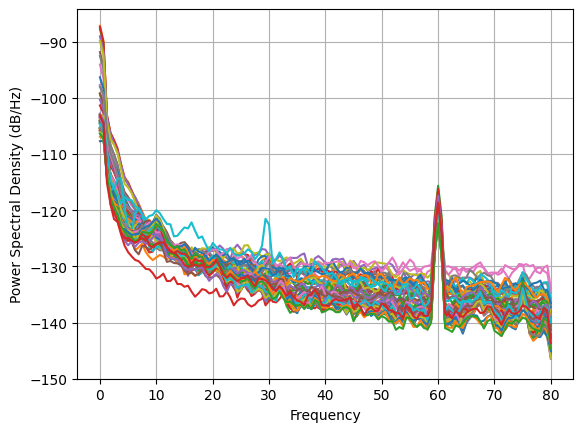

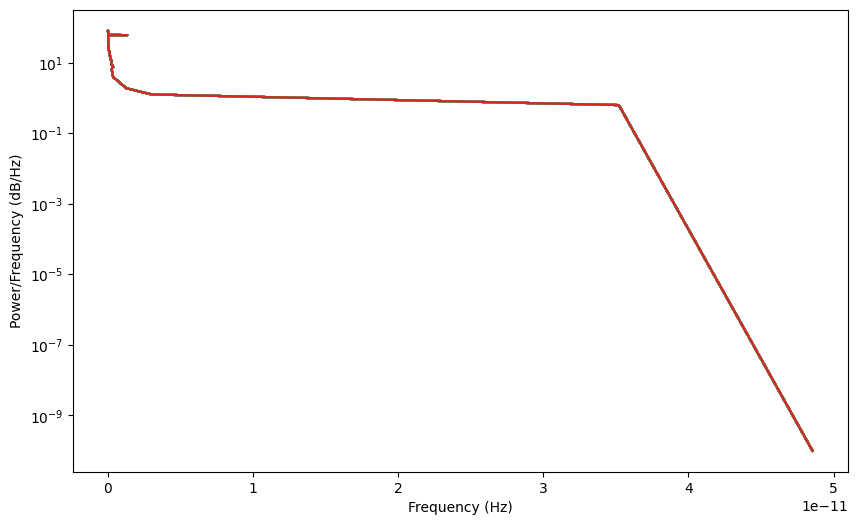

eyes closed


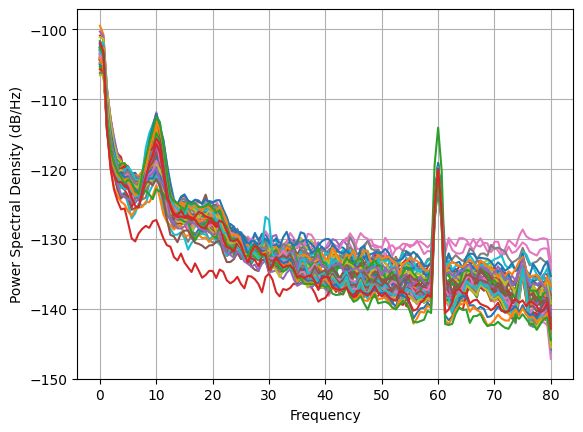

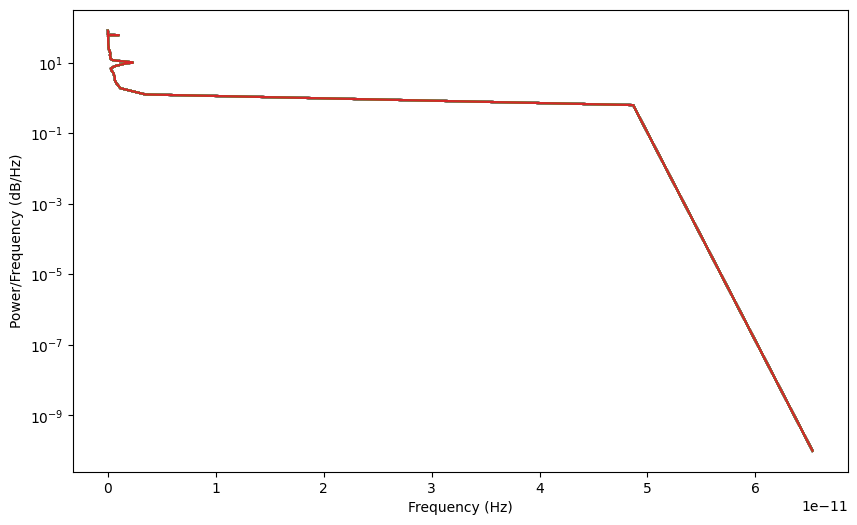

In [1]:
import mne
import numpy as np 
import matplotlib.pyplot as plt
import torch
import os
import sklearn
from sklearn.pipeline import Pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import ShuffleSplit, cross_val_score, train_test_split
from torch.utils.data import DataLoader, Dataset
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from sklearn.preprocessing import MinMaxScaler
from torch.utils.data import TensorDataset, DataLoader
from Data import download_EEGBCI

main_folder = './EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0'
subdirectories = [f.path for f in os.scandir(main_folder) if f.is_dir()]

opened_files = []
closed_files = []

i = 0
for subdirectory in subdirectories:
    files = os.listdir(subdirectory)
    
    if len(files) > 0 and i not in [13, 50, 68, 96, 108]: # 13, 50, 68, 96, 108 idx does not have 9760 seq len
        for file in files:
            
            if file[-6:] == '01.edf':
                # This is data for eyes opened
                eyes_opened = os.path.join(subdirectory, file)
                print(eyes_opened)
                opened_files.append(eyes_opened)

            if file[-6:] == '02.edf':
                # This is data for eyes closed
                eyes_closed = os.path.join(subdirectory, file)
                print(eyes_closed)
                closed_files.append(eyes_closed)
    else:
        print(f"No files found in {subdirectory}")
    
    i += 1
    
large_open_data = []    # This is a list of all the data for eyes opened
large_closed_data = []  # This is a list of all the data for eyes closed

for data in opened_files:
    value_open = mne.io.read_raw_edf(data, preload=True, verbose=False).get_data(verbose=False)
    if(len(value_open) == 64):
        large_open_data.append(value_open)

for data in closed_files:
    value_closed = mne.io.read_raw_edf(data, preload=True, verbose=False).get_data(verbose=False)
    if(len(value_closed) == 64):
        large_closed_data.append(value_closed)

print(large_open_data.__len__())   # This is the number of files for eyes opened
print(large_closed_data.__len__()) # This is the number of files for eyes closed



open_data = []
closed_data = []

for i in range(len(large_open_data)):
    if i not in [1,4,6,13,22,29,31,33,36,43,50,53,60,63,86,87,88,94,95,100,102]: # data that looks sussy
        open_data.append(large_open_data[i])

for i in range(len(large_closed_data)):
    if i not in [1,4,5,6,12,13,15,17,19,22,29,31,33,34.47,50,51,58,60,71,76,77,79,81,86,87,88,90,95,100]: # data that looks sussy
        closed_data.append(large_closed_data[i])   
        
training_data_open = np.array(open_data)
training_data_closed = np.array(closed_data)
print(np.shape(training_data_open))
print(np.shape(training_data_closed))



# Load the raw EEG data
edf_file = './EEGData/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R01.edf'
raw = mne.io.read_raw_edf(edf_file, preload=True, verbose=False)


def compute_psd(data, fs, nperseg=256, noverlap=None):
    """
    Compute Power Spectral Density (PSD) using the Welch method.

    Parameters:
        data (array): EEG data array with shape (n_channels, n_samples).
        fs (float): Sampling frequency.
        nperseg (int): Length of each segment for PSD estimation.
        noverlap (int): Number of overlapping samples between segments.
    
    Returns:
        freqs (array): Frequency values.
        psd (array): Power Spectral Density values.
    """
    n_channels, n_samples = data.shape
    psd = np.zeros((n_channels, nperseg // 2 + 1))

    for ch_idx in range(n_channels):
        f, Pxx = plt.psd(data[ch_idx], Fs=fs, NFFT=nperseg, noverlap=noverlap)
        # Add a small epsilon to avoid zero values
        psd[ch_idx] = Pxx + 1e-10

    return f, psd


# Get the EEG data using .get_data()
eeg_data = raw.get_data()
#eeg_data = large_closed_data[0]

# Set the sampling frequency
fs = raw.info['sfreq']

def average_across_arrays(generated_data):
    return generated_data.mean(dim=0)



## open data
averaged_data = average_across_arrays(torch.tensor(training_data_open).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

print("eyes open")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()



## closed data
averaged_data = average_across_arrays(torch.tensor(training_data_closed).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

print("eyes closed")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()




NUM_CHANNELS = 64
SEQUENCE_LENGTH = 9760
LAMBDA_GP = 5

def weights_init(model):
    for m in model.modules():
      if isinstance(m, (nn.Conv1d, nn.ConvTranspose1d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Gaussian normal distribution
def sample_normal_distribution(i, j, k):
    mu = 0
    sigma = 0.02
    return torch.Tensor(np.random.normal(mu, sigma, (i, j, k)))

def gradient_penalty(D, real, fake):
    alpha = torch.rand((BATCH_SIZE, 1, 1)).repeat(1, NUM_CHANNELS, SEQUENCE_LENGTH)
    interpolated_seq = real * alpha + fake * (1 - alpha)

    # Calculate discriminator scores
    mixed_scores = D(interpolated_seq)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_seq,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty


def plot_everything(generated_data, gen_err, critic_err):
    generated_data = generated_data.detach()
    
    # plotting generated data
    values = generated_data[0, 0, :]
    plt.plot(values.tolist())
    plt.show()

    # plotting PSD
    averaged_data = average_across_arrays(generated_data)
    freqs, psd = compute_psd(averaged_data, fs)
    plt.figure(figsize=(10, 6))  # Add this line to create a single figure
    for ch_idx in range(eeg_data.shape[0]):
        plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power/Frequency (dB/Hz)')
    plt.show()

    # plotting G vs D losses
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(gen_err,label="Generator")
    plt.plot(critic_err,label="Critic")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

# Final model (Lightweight)

Epoch 0: Critic error ([0.5534632693941242]) Generator err ([0.01875467225909233])


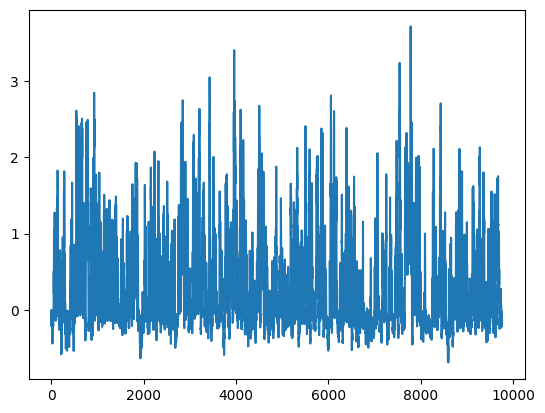

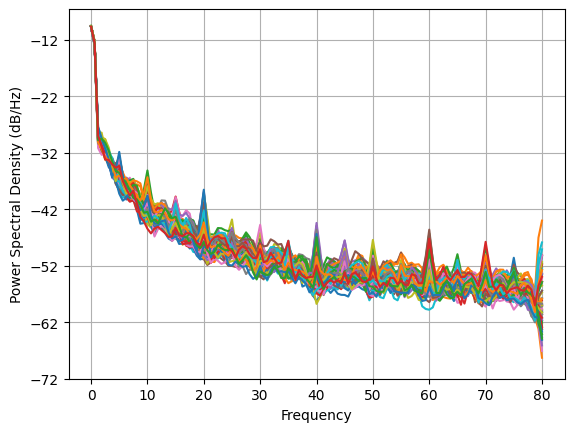

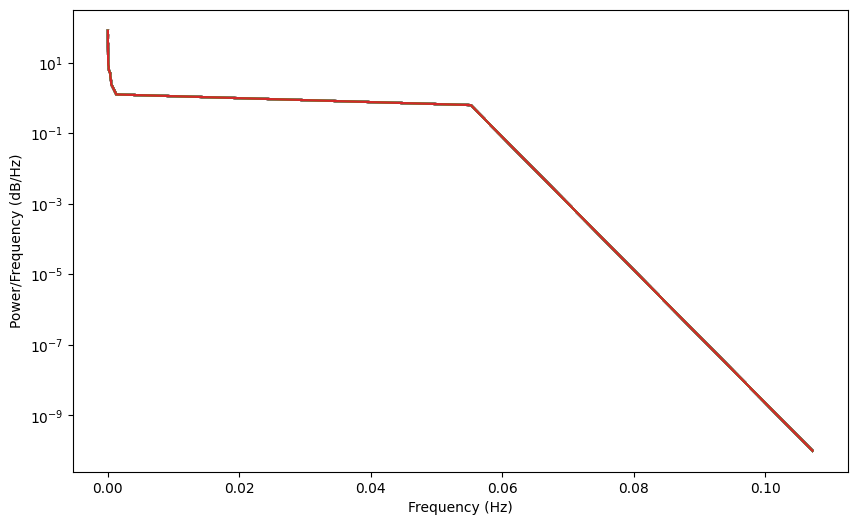

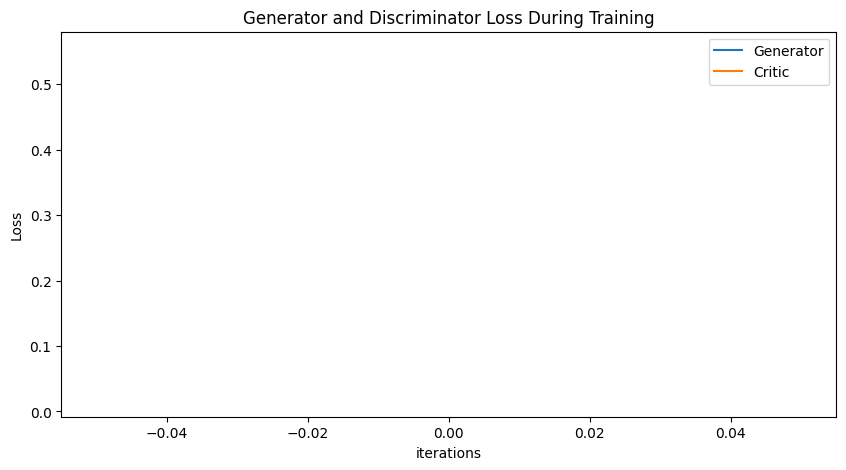

Epoch 10: Critic error ([0.5534632693941242, 0.7526976929308429, 0.4771101856294455, 0.3324219556075384, 0.06277280548731734, 0.06990705600451289, 0.05197673779917998, 0.16084820474906653, 0.12876641672197256, 0.17312483969746245, 0.13371710636829612]) Generator err ([0.01875467225909233, 0.026095861569046974, 0.07710441946983337, 0.01045593898743391, 0.09543076157569885, 0.02526458539068699, 0.029383279383182526, 0.012736002914607525, 0.009394476190209389, -0.010470463894307613, 0.01104128547012806])


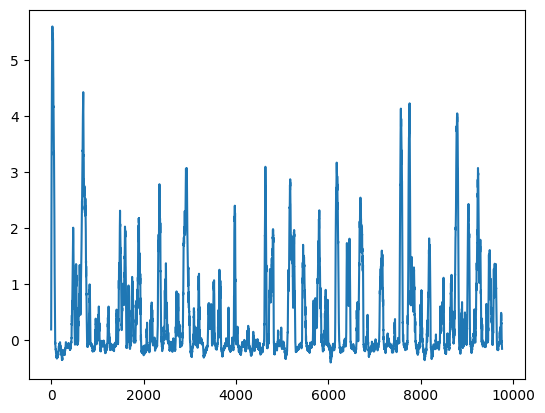

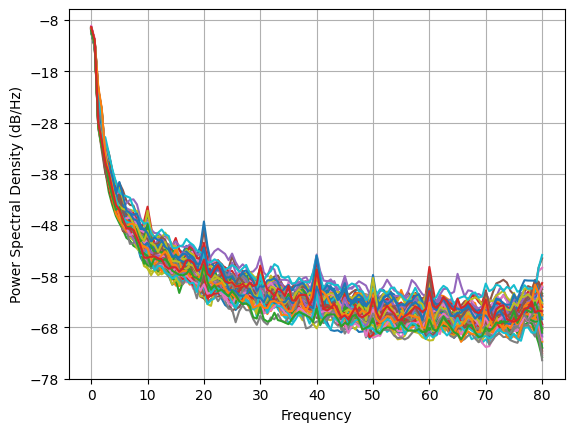

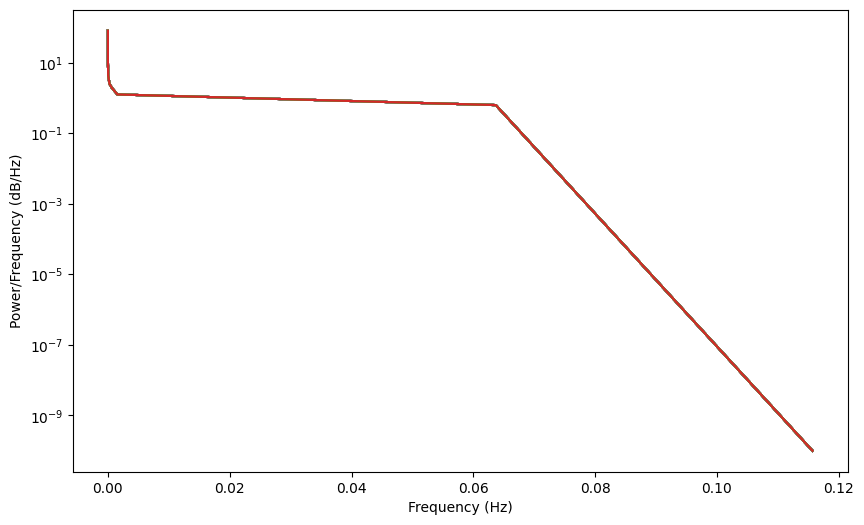

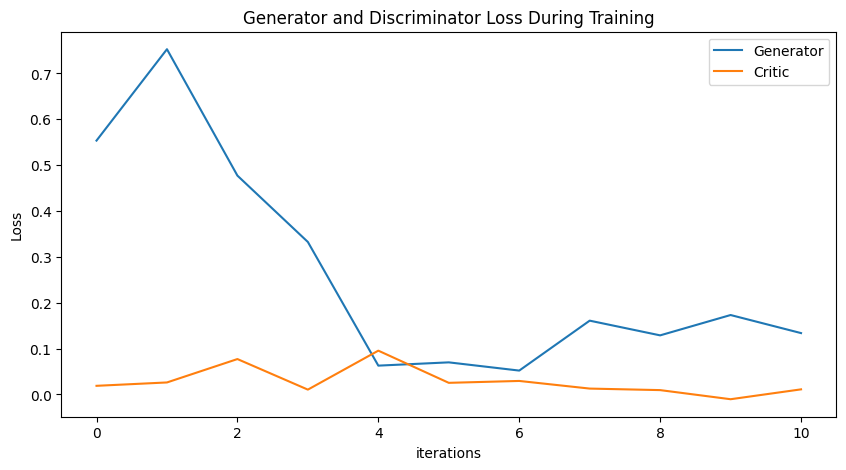

Epoch 20: Critic error ([0.5534632693941242, 0.7526976929308429, 0.4771101856294455, 0.3324219556075384, 0.06277280548731734, 0.06990705600451289, 0.05197673779917998, 0.16084820474906653, 0.12876641672197256, 0.17312483969746245, 0.13371710636829612, 0.296367902976868, 0.2125334515662216, 0.33342027636520055, 0.21274352317289857, 0.35773097670019166, 0.25112799926471435, 0.32596689480390056, 0.2525976192055795, 0.26765390291203894, 0.17250325876667516]) Generator err ([0.01875467225909233, 0.026095861569046974, 0.07710441946983337, 0.01045593898743391, 0.09543076157569885, 0.02526458539068699, 0.029383279383182526, 0.012736002914607525, 0.009394476190209389, -0.010470463894307613, 0.01104128547012806, -0.014467140659689903, -0.012805130332708359, -0.03386012464761734, -0.02412651851773262, -0.03837036341428757, -0.034207332879304886, -0.06483888626098633, -0.040285415947437286, -0.05329470336437225, -0.0369439572095871])


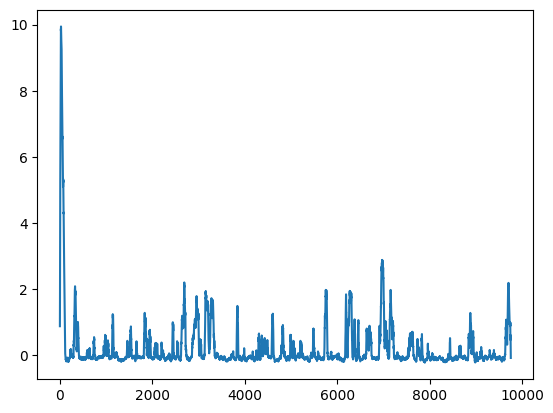

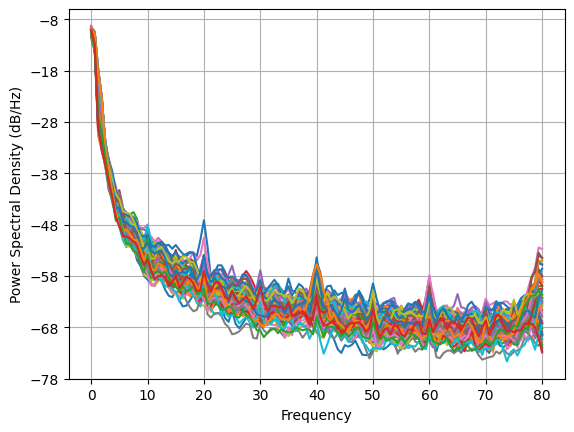

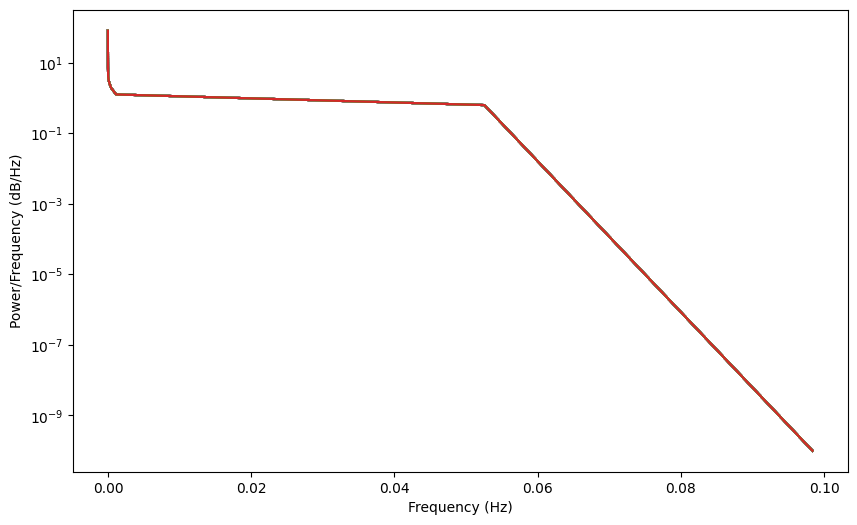

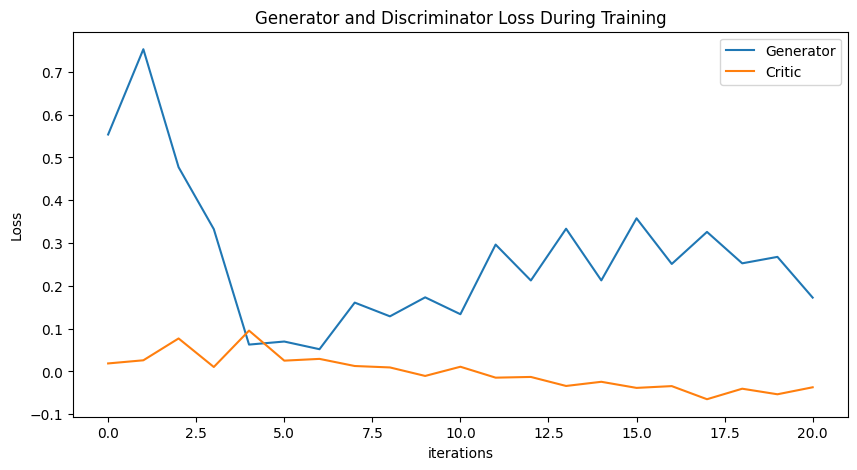

Epoch 30: Critic error ([0.5534632693941242, 0.7526976929308429, 0.4771101856294455, 0.3324219556075384, 0.06277280548731734, 0.06990705600451289, 0.05197673779917998, 0.16084820474906653, 0.12876641672197256, 0.17312483969746245, 0.13371710636829612, 0.296367902976868, 0.2125334515662216, 0.33342027636520055, 0.21274352317289857, 0.35773097670019166, 0.25112799926471435, 0.32596689480390056, 0.2525976192055795, 0.26765390291203894, 0.17250325876667516, 0.19132733323415058, 0.22527458924421476, 0.15203567626339368, 0.24721309706842853, 0.21164358786192222, 0.16338435049119418, 0.20377316531132633, 0.1538766282974453, 0.14438665520676125, 0.1255801135476736]) Generator err ([0.01875467225909233, 0.026095861569046974, 0.07710441946983337, 0.01045593898743391, 0.09543076157569885, 0.02526458539068699, 0.029383279383182526, 0.012736002914607525, 0.009394476190209389, -0.010470463894307613, 0.01104128547012806, -0.014467140659689903, -0.012805130332708359, -0.03386012464761734, -0.024126518

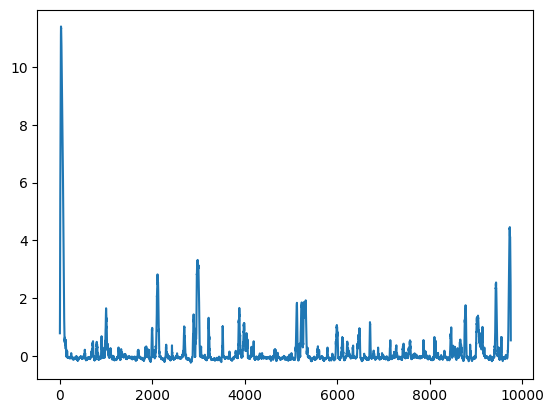

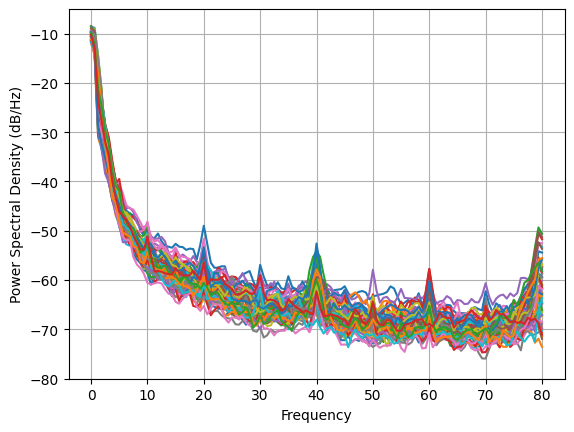

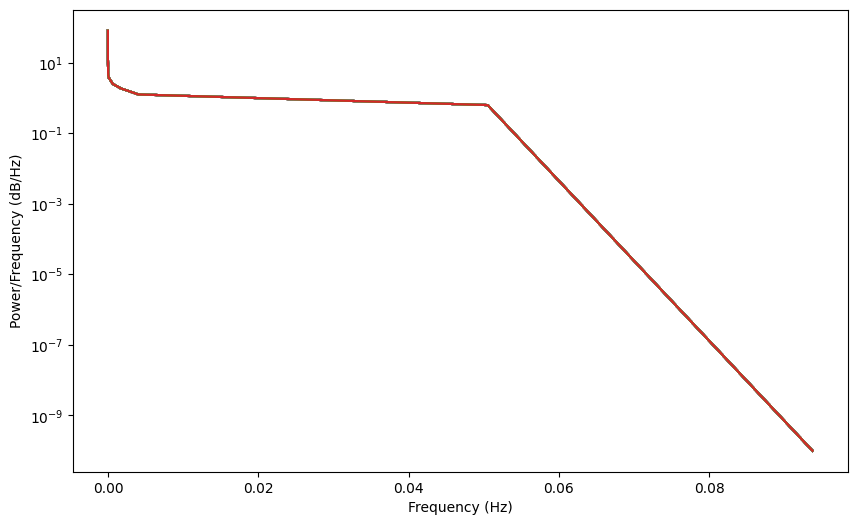

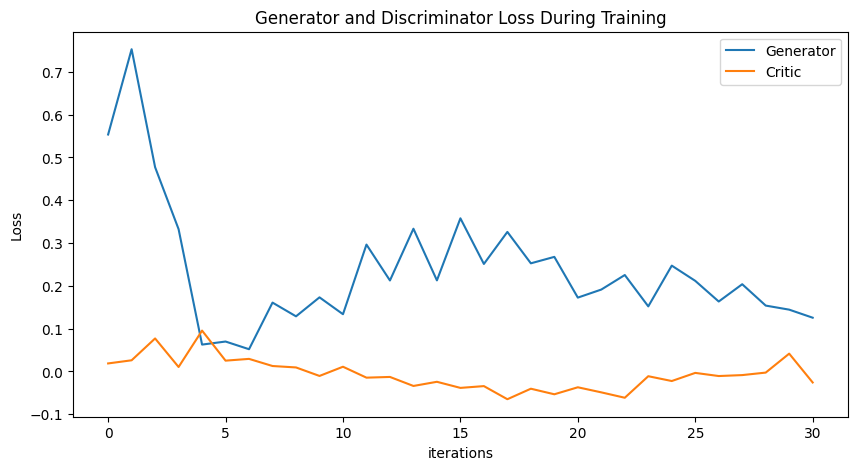

Epoch 40: Critic error ([0.5534632693941242, 0.7526976929308429, 0.4771101856294455, 0.3324219556075384, 0.06277280548731734, 0.06990705600451289, 0.05197673779917998, 0.16084820474906653, 0.12876641672197256, 0.17312483969746245, 0.13371710636829612, 0.296367902976868, 0.2125334515662216, 0.33342027636520055, 0.21274352317289857, 0.35773097670019166, 0.25112799926471435, 0.32596689480390056, 0.2525976192055795, 0.26765390291203894, 0.17250325876667516, 0.19132733323415058, 0.22527458924421476, 0.15203567626339368, 0.24721309706842853, 0.21164358786192222, 0.16338435049119418, 0.20377316531132633, 0.1538766282974453, 0.14438665520676125, 0.1255801135476736, 0.15791672692484182, 0.08292934120013798, 0.09879322929230794, 0.014636599038674827, 0.03465643080496389, -0.014074762171602296, 0.02842850548123778, -0.02804672601306243, -0.040702558027095395, -0.05339743863663531]) Generator err ([0.01875467225909233, 0.026095861569046974, 0.07710441946983337, 0.01045593898743391, 0.0954307615756

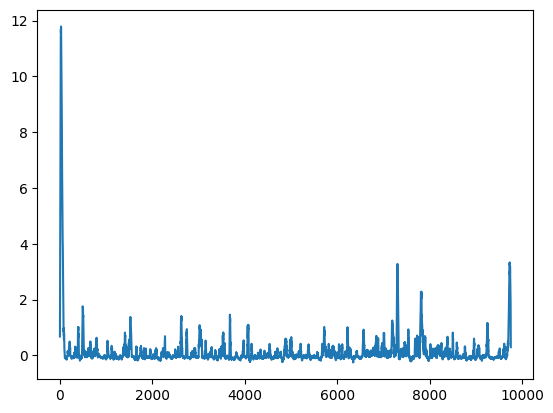

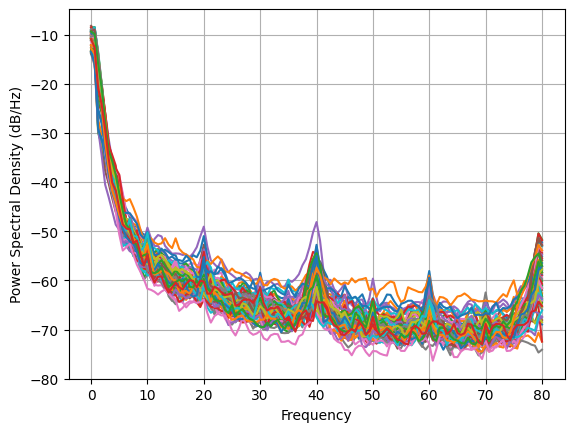

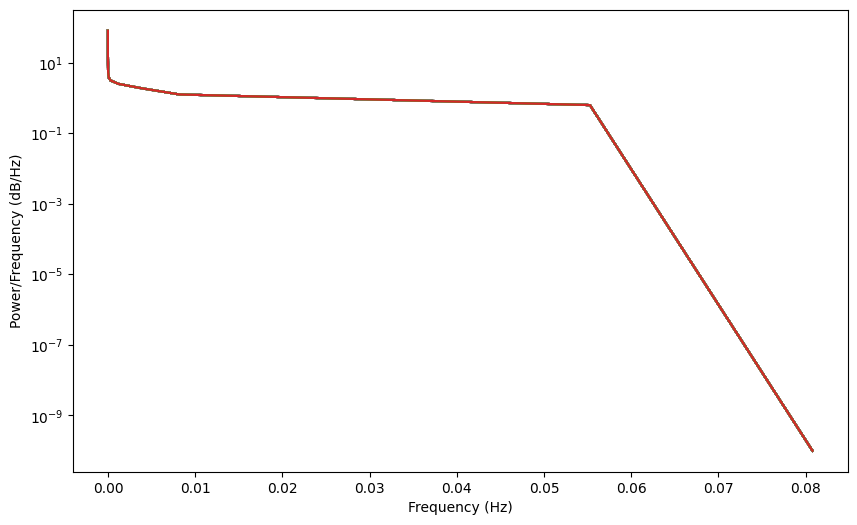

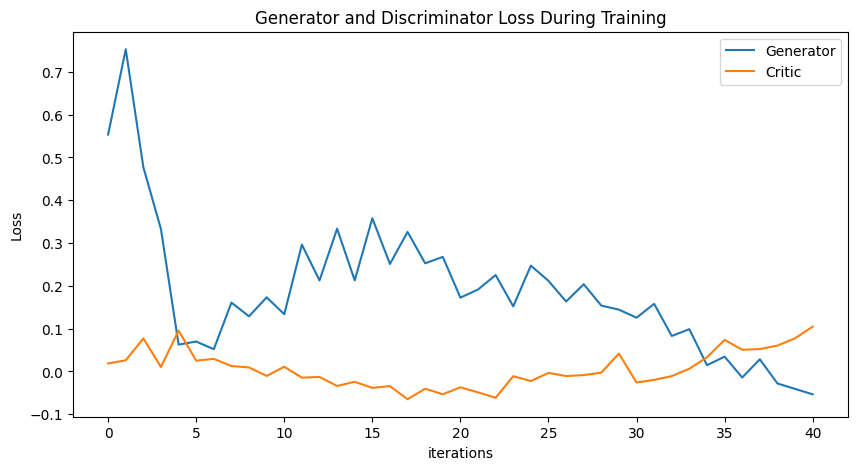

Epoch 50: Critic error ([0.5534632693941242, 0.7526976929308429, 0.4771101856294455, 0.3324219556075384, 0.06277280548731734, 0.06990705600451289, 0.05197673779917998, 0.16084820474906653, 0.12876641672197256, 0.17312483969746245, 0.13371710636829612, 0.296367902976868, 0.2125334515662216, 0.33342027636520055, 0.21274352317289857, 0.35773097670019166, 0.25112799926471435, 0.32596689480390056, 0.2525976192055795, 0.26765390291203894, 0.17250325876667516, 0.19132733323415058, 0.22527458924421476, 0.15203567626339368, 0.24721309706842853, 0.21164358786192222, 0.16338435049119418, 0.20377316531132633, 0.1538766282974453, 0.14438665520676125, 0.1255801135476736, 0.15791672692484182, 0.08292934120013798, 0.09879322929230794, 0.014636599038674827, 0.03465643080496389, -0.014074762171602296, 0.02842850548123778, -0.02804672601306243, -0.040702558027095395, -0.05339743863663531, -0.08545267586285495, -0.11337657614454977, -0.13321636670199155, -0.17017980091419044, -0.23817995254881222, -0.3278

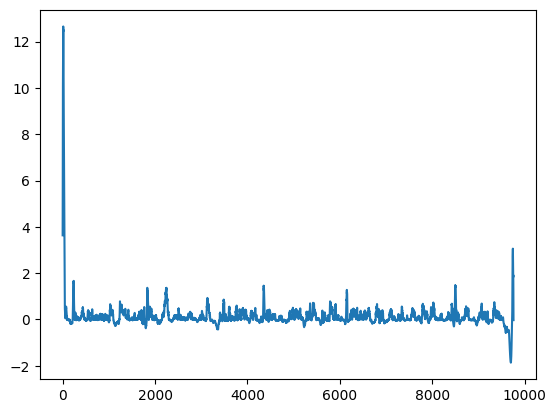

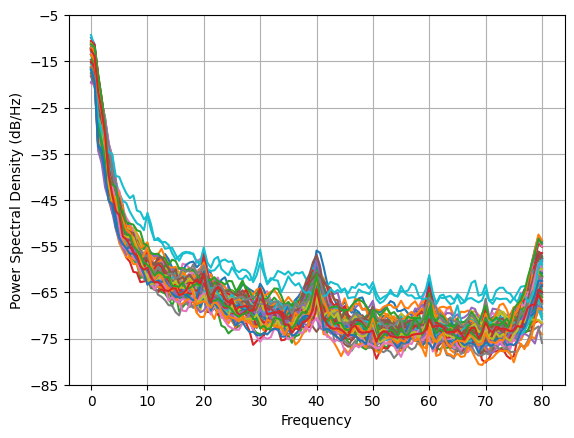

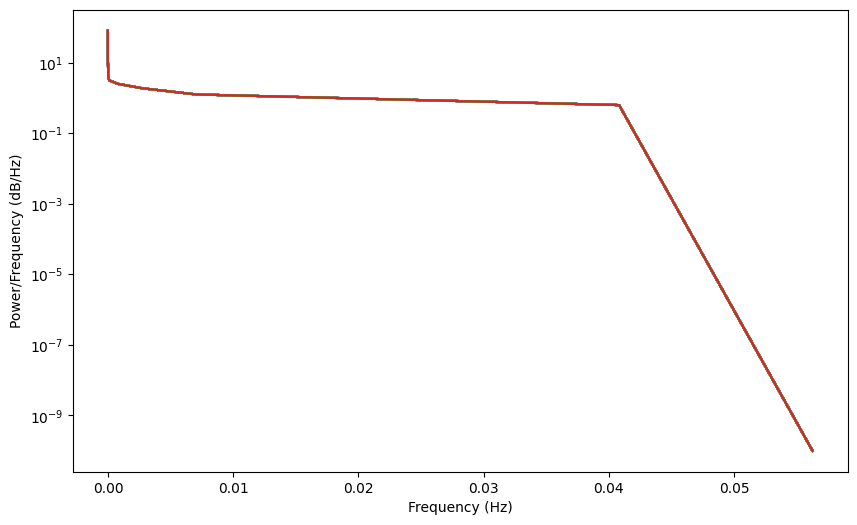

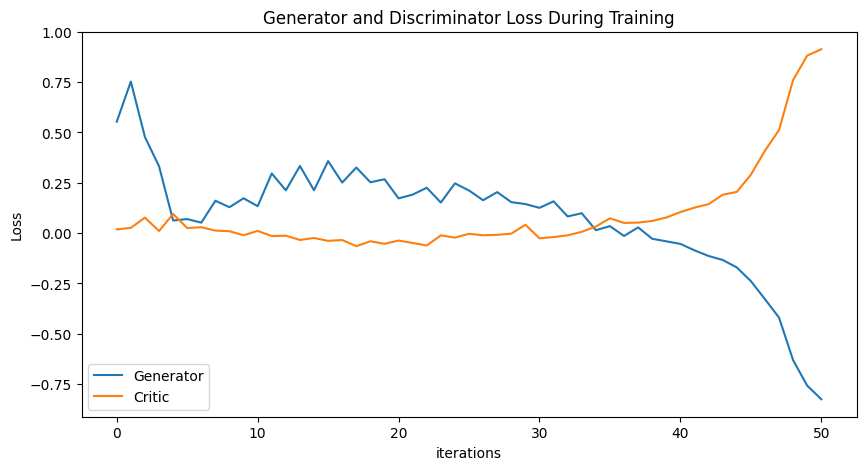

Epoch 60: Critic error ([0.5534632693941242, 0.7526976929308429, 0.4771101856294455, 0.3324219556075384, 0.06277280548731734, 0.06990705600451289, 0.05197673779917998, 0.16084820474906653, 0.12876641672197256, 0.17312483969746245, 0.13371710636829612, 0.296367902976868, 0.2125334515662216, 0.33342027636520055, 0.21274352317289857, 0.35773097670019166, 0.25112799926471435, 0.32596689480390056, 0.2525976192055795, 0.26765390291203894, 0.17250325876667516, 0.19132733323415058, 0.22527458924421476, 0.15203567626339368, 0.24721309706842853, 0.21164358786192222, 0.16338435049119418, 0.20377316531132633, 0.1538766282974453, 0.14438665520676125, 0.1255801135476736, 0.15791672692484182, 0.08292934120013798, 0.09879322929230794, 0.014636599038674827, 0.03465643080496389, -0.014074762171602296, 0.02842850548123778, -0.02804672601306243, -0.040702558027095395, -0.05339743863663531, -0.08545267586285495, -0.11337657614454977, -0.13321636670199155, -0.17017980091419044, -0.23817995254881222, -0.3278

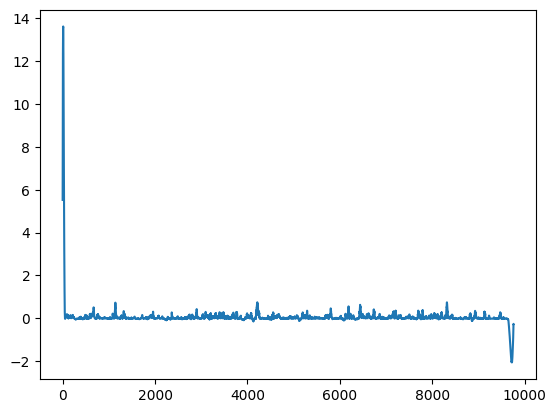

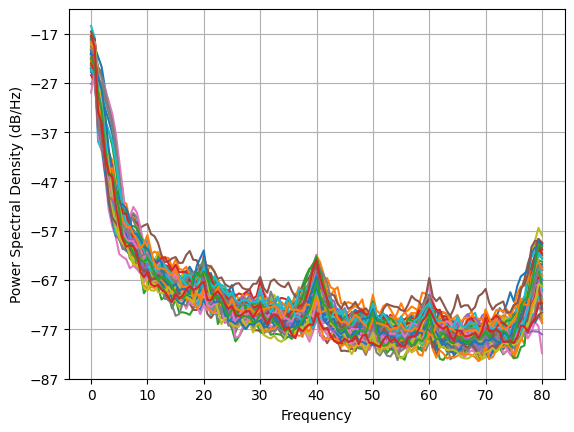

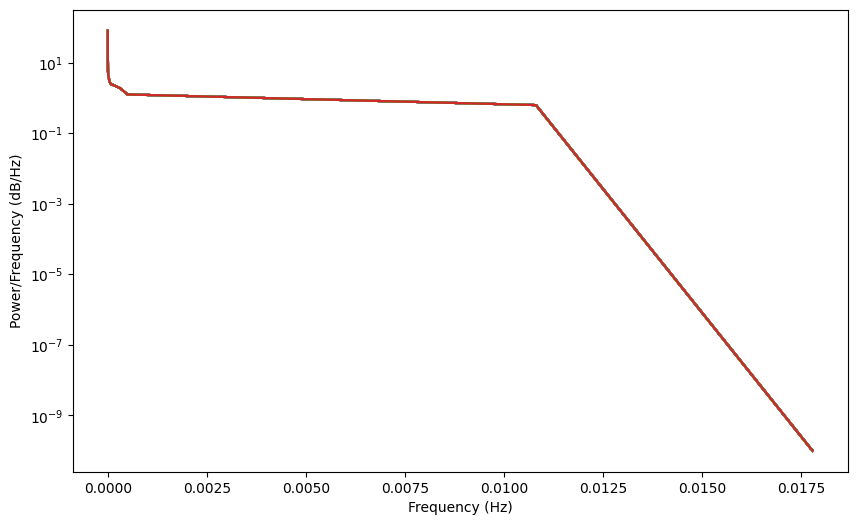

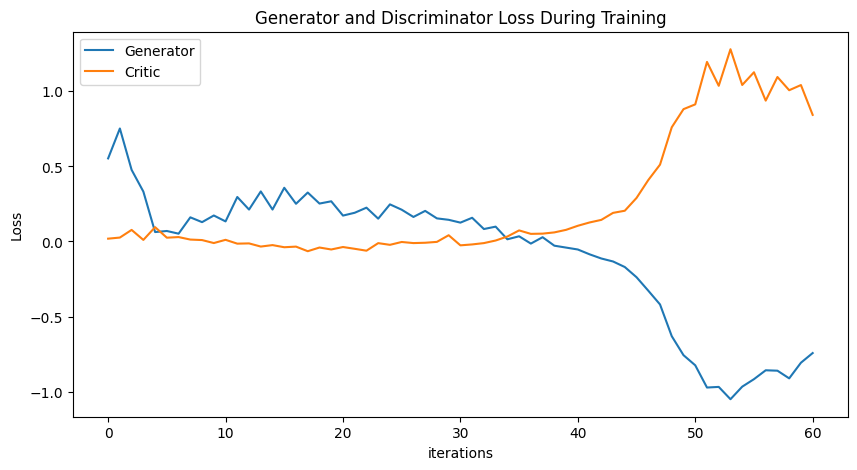

Epoch 70: Critic error ([0.5534632693941242, 0.7526976929308429, 0.4771101856294455, 0.3324219556075384, 0.06277280548731734, 0.06990705600451289, 0.05197673779917998, 0.16084820474906653, 0.12876641672197256, 0.17312483969746245, 0.13371710636829612, 0.296367902976868, 0.2125334515662216, 0.33342027636520055, 0.21274352317289857, 0.35773097670019166, 0.25112799926471435, 0.32596689480390056, 0.2525976192055795, 0.26765390291203894, 0.17250325876667516, 0.19132733323415058, 0.22527458924421476, 0.15203567626339368, 0.24721309706842853, 0.21164358786192222, 0.16338435049119418, 0.20377316531132633, 0.1538766282974453, 0.14438665520676125, 0.1255801135476736, 0.15791672692484182, 0.08292934120013798, 0.09879322929230794, 0.014636599038674827, 0.03465643080496389, -0.014074762171602296, 0.02842850548123778, -0.02804672601306243, -0.040702558027095395, -0.05339743863663531, -0.08545267586285495, -0.11337657614454977, -0.13321636670199155, -0.17017980091419044, -0.23817995254881222, -0.3278

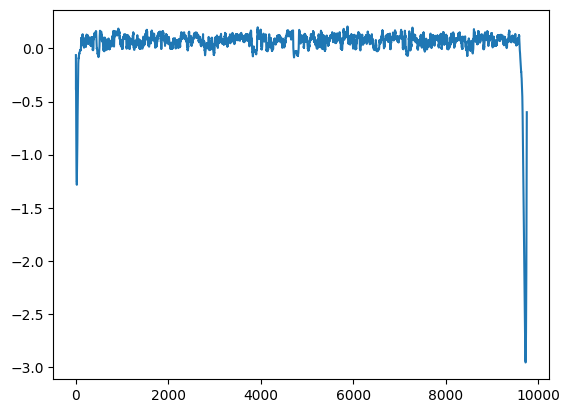

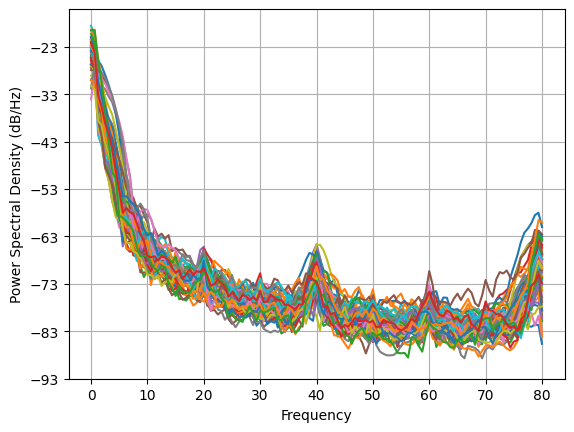

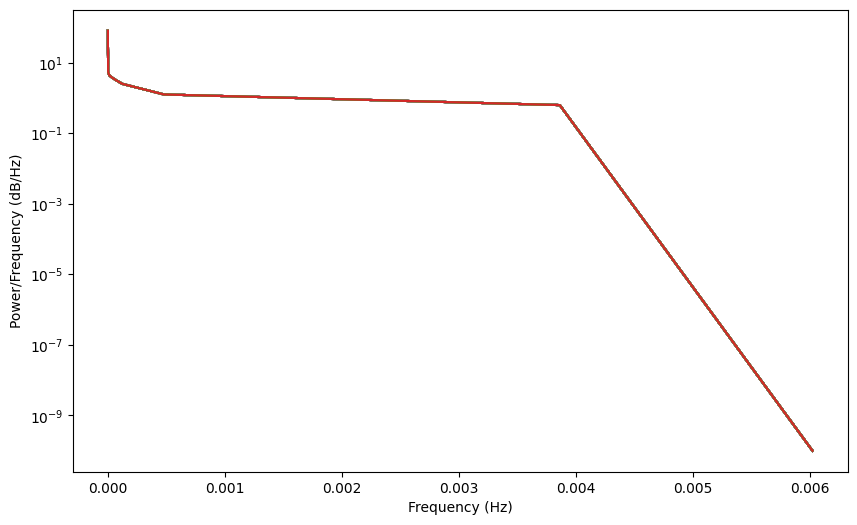

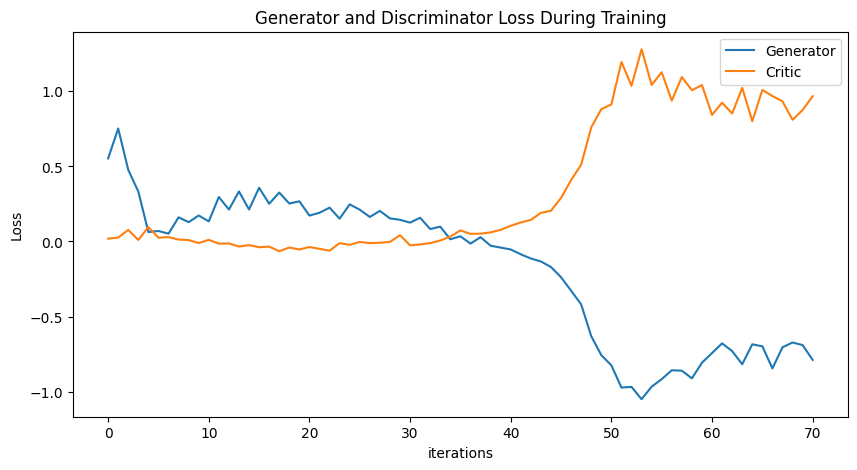

Epoch 80: Critic error ([0.5534632693941242, 0.7526976929308429, 0.4771101856294455, 0.3324219556075384, 0.06277280548731734, 0.06990705600451289, 0.05197673779917998, 0.16084820474906653, 0.12876641672197256, 0.17312483969746245, 0.13371710636829612, 0.296367902976868, 0.2125334515662216, 0.33342027636520055, 0.21274352317289857, 0.35773097670019166, 0.25112799926471435, 0.32596689480390056, 0.2525976192055795, 0.26765390291203894, 0.17250325876667516, 0.19132733323415058, 0.22527458924421476, 0.15203567626339368, 0.24721309706842853, 0.21164358786192222, 0.16338435049119418, 0.20377316531132633, 0.1538766282974453, 0.14438665520676125, 0.1255801135476736, 0.15791672692484182, 0.08292934120013798, 0.09879322929230794, 0.014636599038674827, 0.03465643080496389, -0.014074762171602296, 0.02842850548123778, -0.02804672601306243, -0.040702558027095395, -0.05339743863663531, -0.08545267586285495, -0.11337657614454977, -0.13321636670199155, -0.17017980091419044, -0.23817995254881222, -0.3278

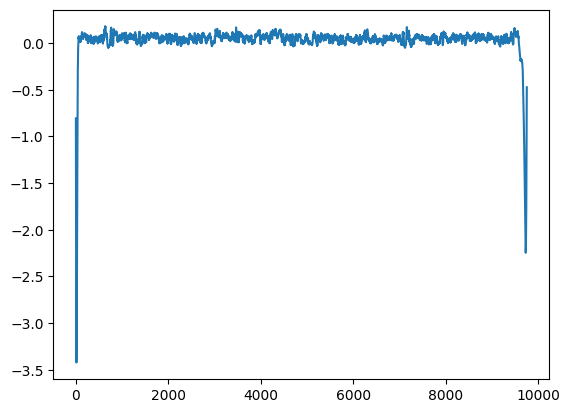

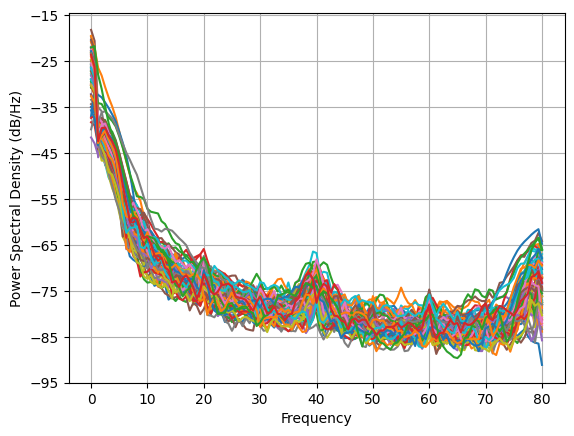

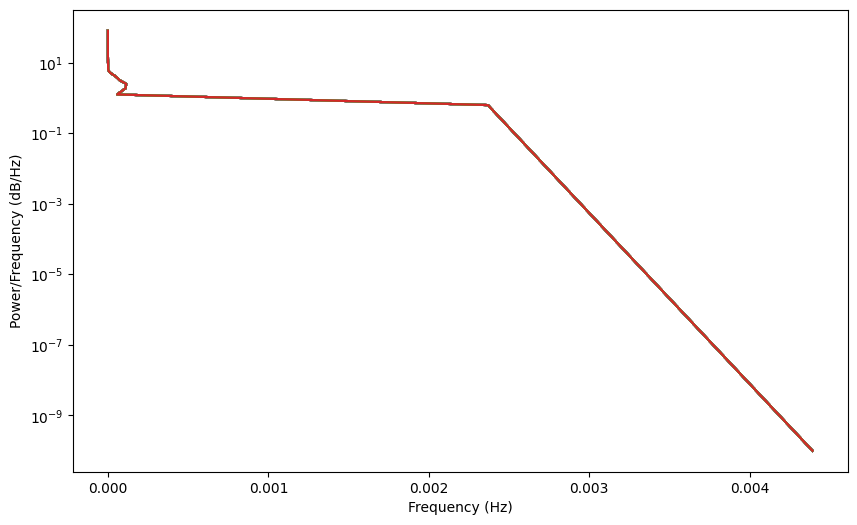

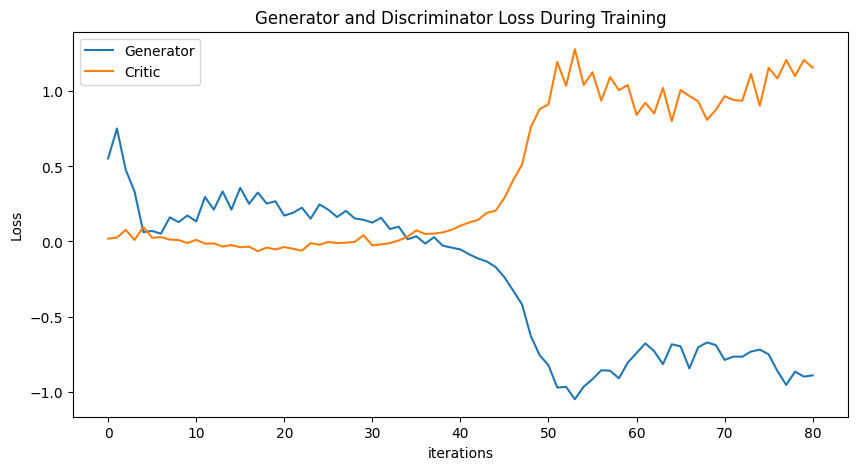

Epoch 90: Critic error ([0.5534632693941242, 0.7526976929308429, 0.4771101856294455, 0.3324219556075384, 0.06277280548731734, 0.06990705600451289, 0.05197673779917998, 0.16084820474906653, 0.12876641672197256, 0.17312483969746245, 0.13371710636829612, 0.296367902976868, 0.2125334515662216, 0.33342027636520055, 0.21274352317289857, 0.35773097670019166, 0.25112799926471435, 0.32596689480390056, 0.2525976192055795, 0.26765390291203894, 0.17250325876667516, 0.19132733323415058, 0.22527458924421476, 0.15203567626339368, 0.24721309706842853, 0.21164358786192222, 0.16338435049119418, 0.20377316531132633, 0.1538766282974453, 0.14438665520676125, 0.1255801135476736, 0.15791672692484182, 0.08292934120013798, 0.09879322929230794, 0.014636599038674827, 0.03465643080496389, -0.014074762171602296, 0.02842850548123778, -0.02804672601306243, -0.040702558027095395, -0.05339743863663531, -0.08545267586285495, -0.11337657614454977, -0.13321636670199155, -0.17017980091419044, -0.23817995254881222, -0.3278

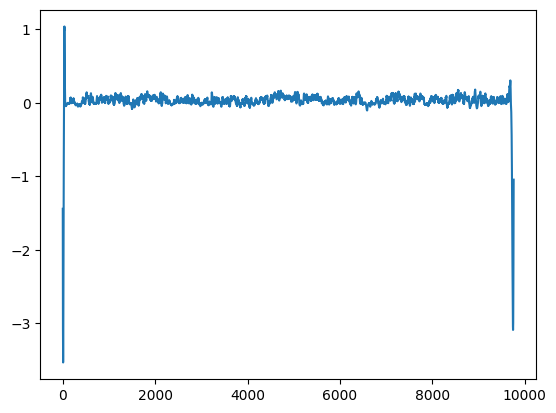

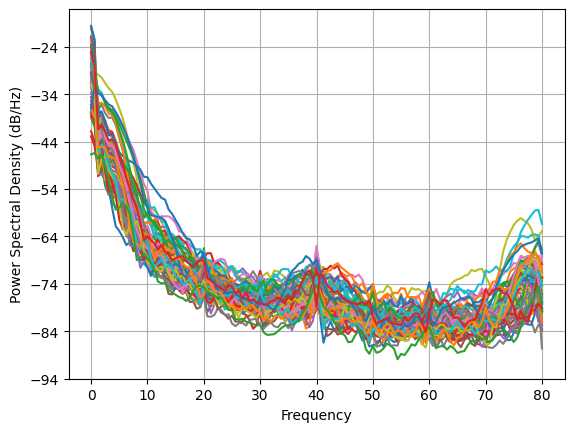

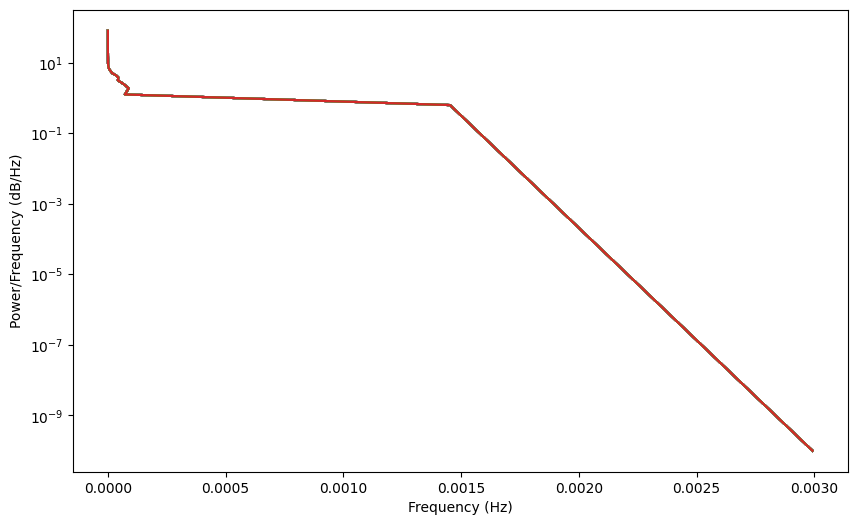

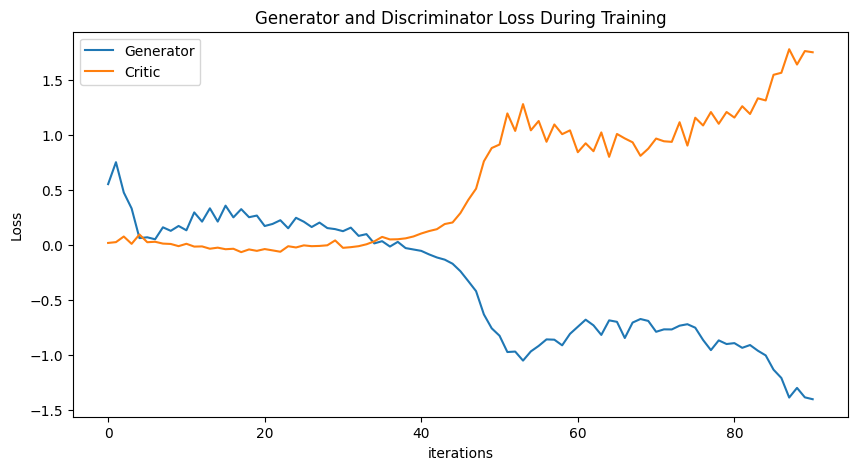

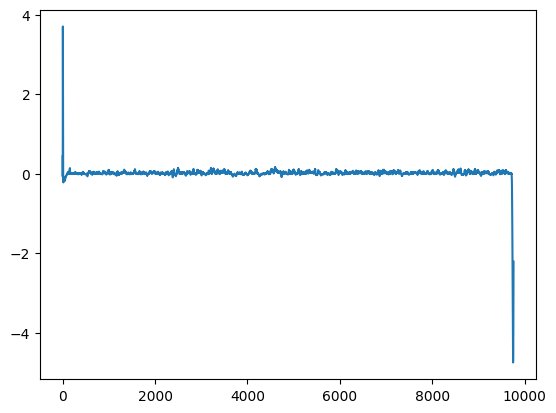

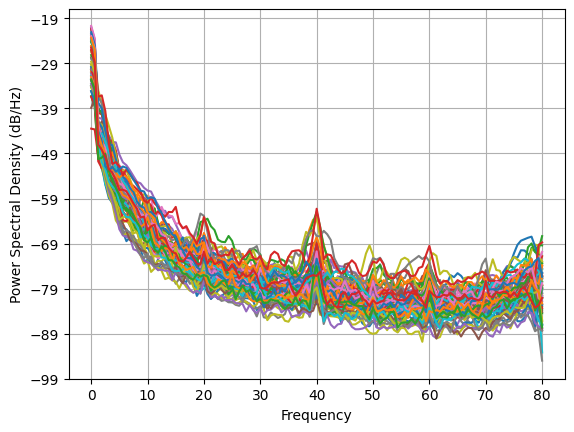

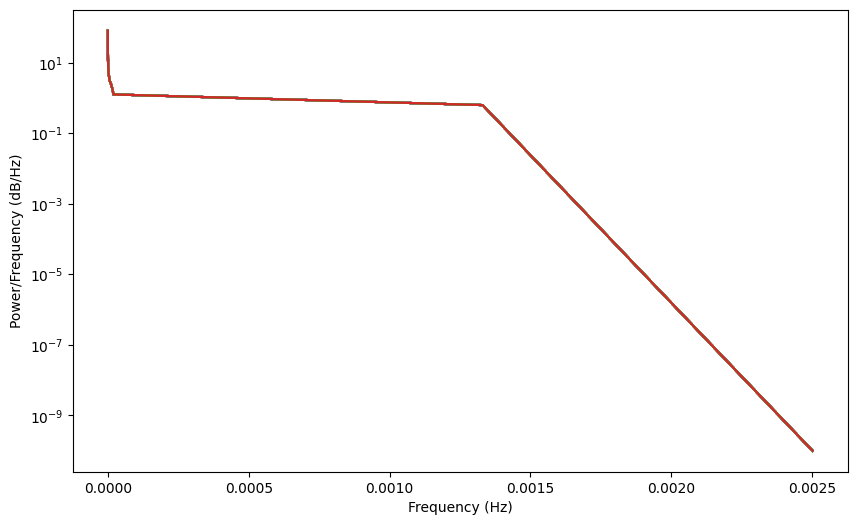

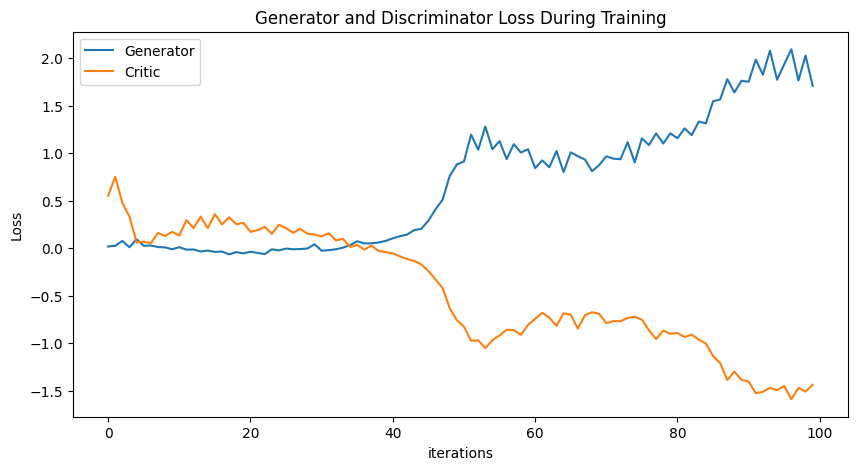

In [9]:
NUM_EPOCHS = 100
PRINT_INTERVAL = 10
BATCH_SIZE = np.shape(training_data_open)[0]
training_data = torch.tensor(training_data_open)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
            fake = G(noise)
            critic_real = D(real).reshape(-1)
            critic_fake = D(fake).reshape(-1)
            gp = gradient_penalty(D, real, fake)
            critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            D.zero_grad()
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()
            critic_optimizer.zero_grad()

        generated_data = fake
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        gen_optimizer.zero_grad()

        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_open, disc, gen = train()

torch.save(gen, 'gen_FINAL_open.pt')
torch.save(disc, 'disc_FINAL_open.pt')

plot_everything(generated_data_open, gen_err, critic_err)

Epoch 0: Critic error ([3.074134025230567]) Generator err ([-0.03915680944919586])


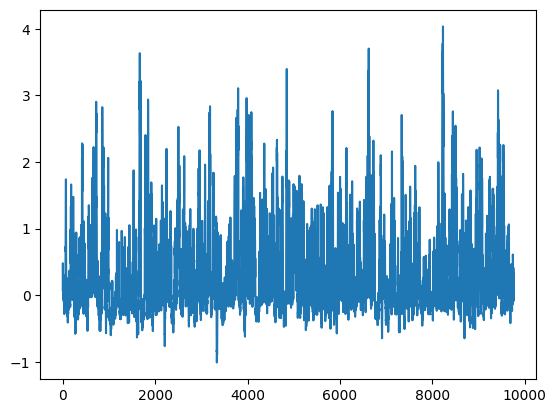

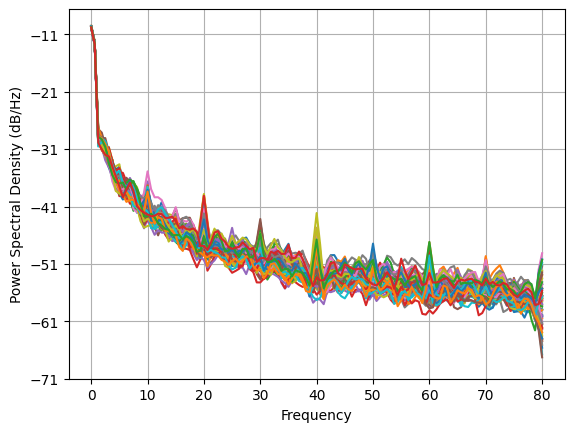

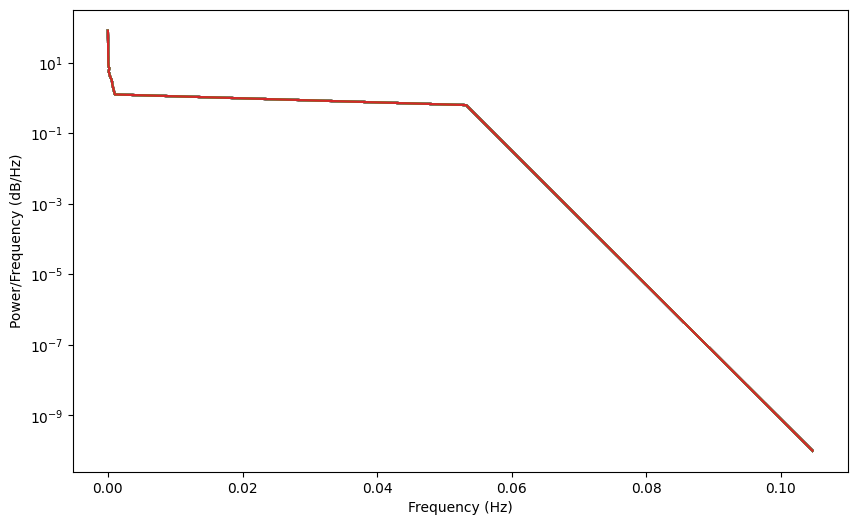

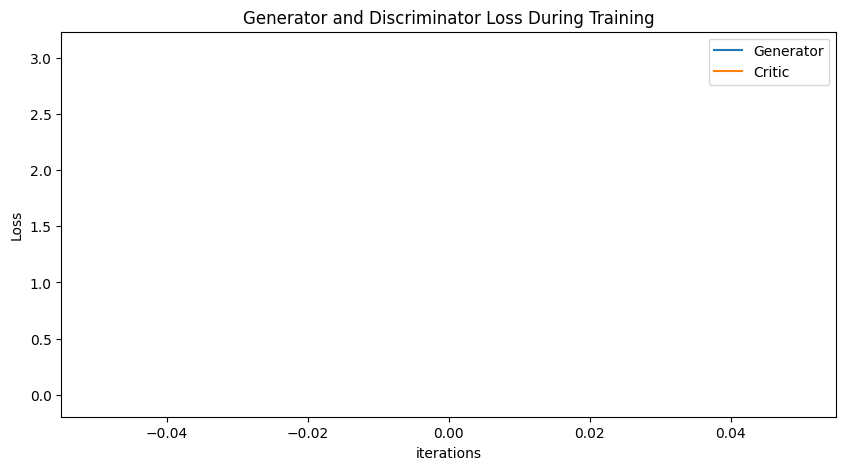

Epoch 10: Critic error ([3.074134025230567, 1.0341115962656713, 0.14670704278374427, 0.14543150024526144, 0.012200900021435118, 0.14713128999246664, 0.04361579512422473, -0.04115287576810593, -0.1877020979457912, -0.3744406821056279, -0.47800208236687264]) Generator err ([-0.03915680944919586, -0.182709738612175, -0.09311235696077347, -0.08998598158359528, 0.016616210341453552, -0.10591981559991837, 0.008348065428435802, 0.06797956675291061, 0.25757285952568054, 0.5031681060791016, 0.624260425567627])


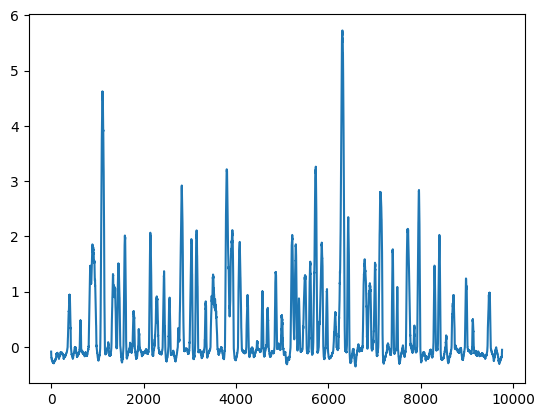

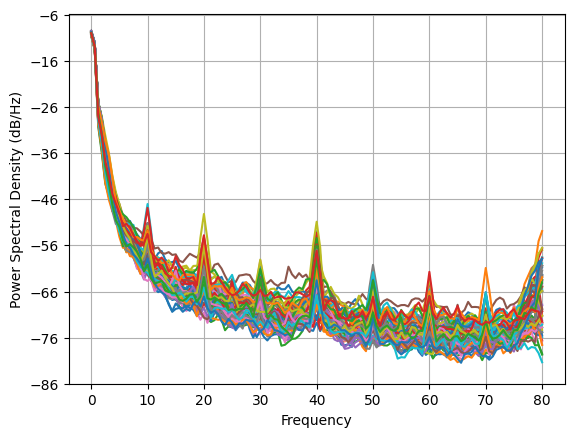

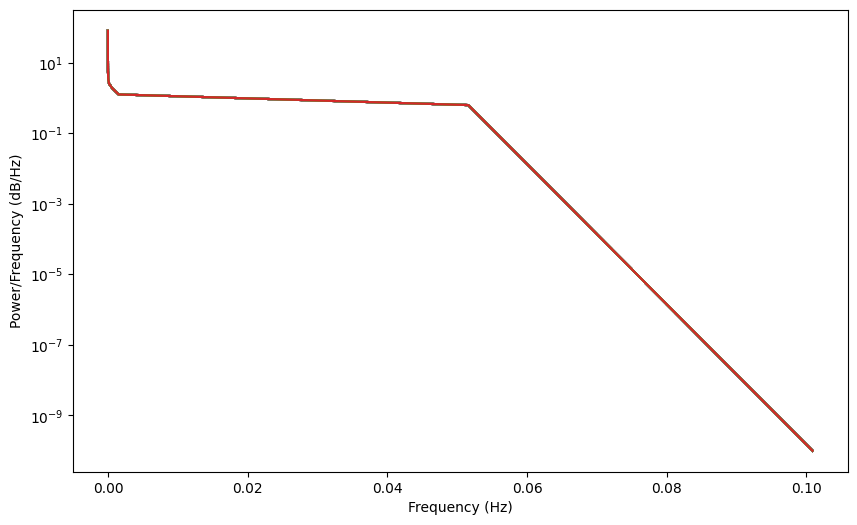

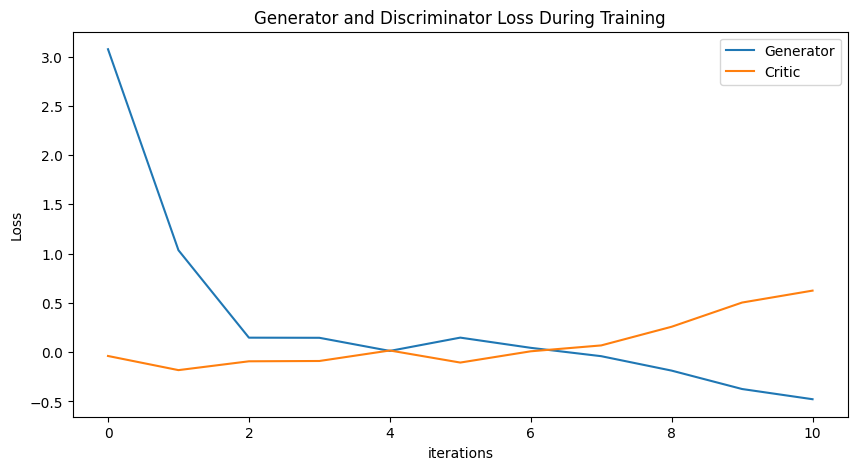

Epoch 20: Critic error ([3.074134025230567, 1.0341115962656713, 0.14670704278374427, 0.14543150024526144, 0.012200900021435118, 0.14713128999246664, 0.04361579512422473, -0.04115287576810593, -0.1877020979457912, -0.3744406821056279, -0.47800208236687264, -0.8591586189721909, -0.8344606636141692, -1.1050422006389473, -2.3548735939297165, -3.8216179718422274, -3.9882642898490825, -4.769062306691371, -4.622052538491371, -5.150036713991248, -5.884985887210024]) Generator err ([-0.03915680944919586, -0.182709738612175, -0.09311235696077347, -0.08998598158359528, 0.016616210341453552, -0.10591981559991837, 0.008348065428435802, 0.06797956675291061, 0.25757285952568054, 0.5031681060791016, 0.624260425567627, 1.1797477006912231, 1.1247566938400269, 1.6144012212753296, 1.9603556394577026, 8.26206111907959, 6.281108856201172, 4.9622392654418945, 7.934851169586182, 6.8604888916015625, 6.434881210327148])


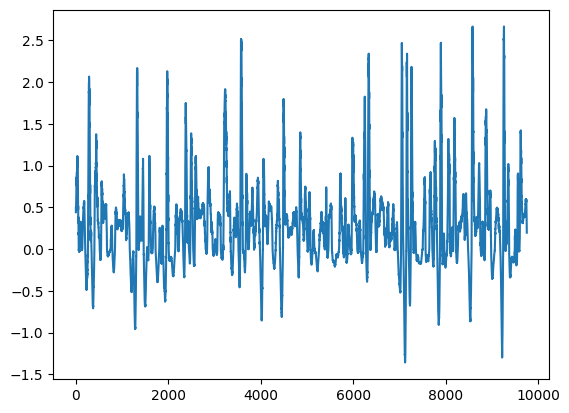

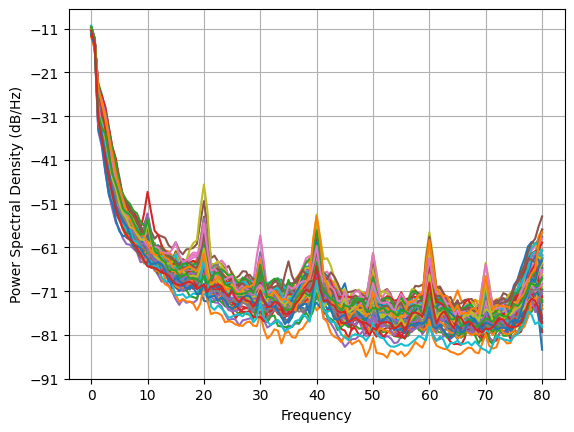

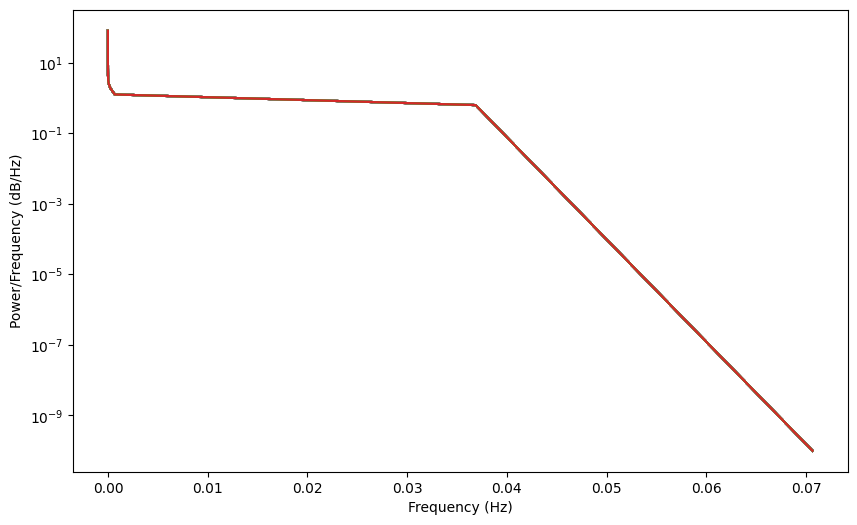

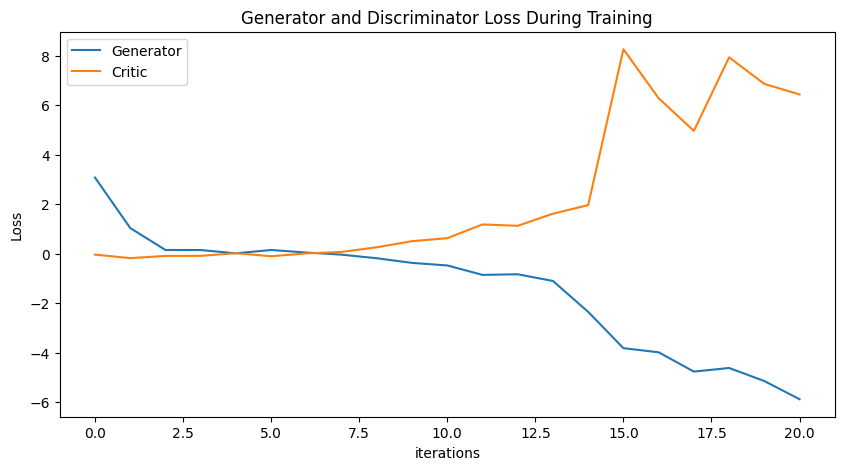

Epoch 30: Critic error ([3.074134025230567, 1.0341115962656713, 0.14670704278374427, 0.14543150024526144, 0.012200900021435118, 0.14713128999246664, 0.04361579512422473, -0.04115287576810593, -0.1877020979457912, -0.3744406821056279, -0.47800208236687264, -0.8591586189721909, -0.8344606636141692, -1.1050422006389473, -2.3548735939297165, -3.8216179718422274, -3.9882642898490825, -4.769062306691371, -4.622052538491371, -5.150036713991248, -5.884985887210024, -5.073021202003716, -5.3917419086369724, -5.350369749605545, -4.821641123699445, -4.650583929372793, -4.775666681379553, -4.646398581655451, -4.45872999467874, -4.431944300031095, -4.902290635641486]) Generator err ([-0.03915680944919586, -0.182709738612175, -0.09311235696077347, -0.08998598158359528, 0.016616210341453552, -0.10591981559991837, 0.008348065428435802, 0.06797956675291061, 0.25757285952568054, 0.5031681060791016, 0.624260425567627, 1.1797477006912231, 1.1247566938400269, 1.6144012212753296, 1.9603556394577026, 8.262061

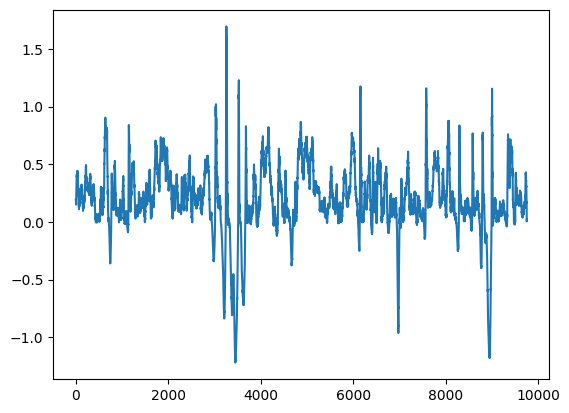

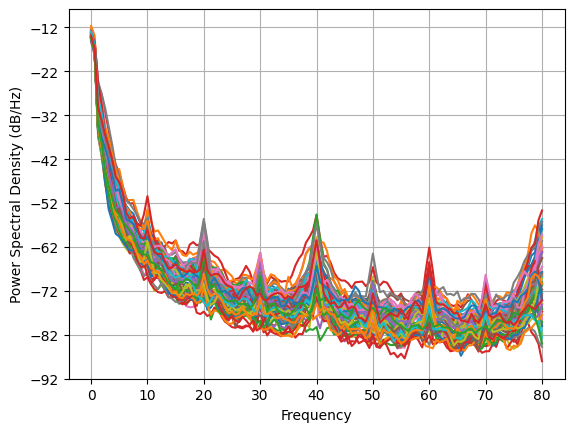

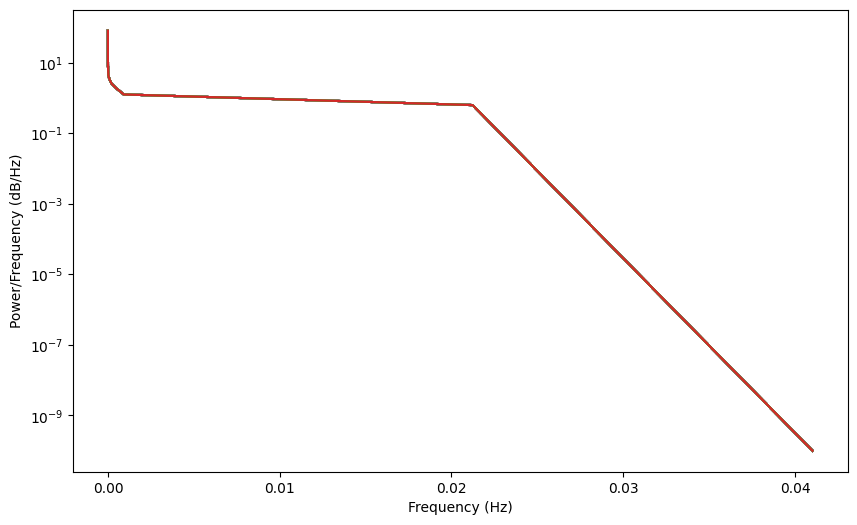

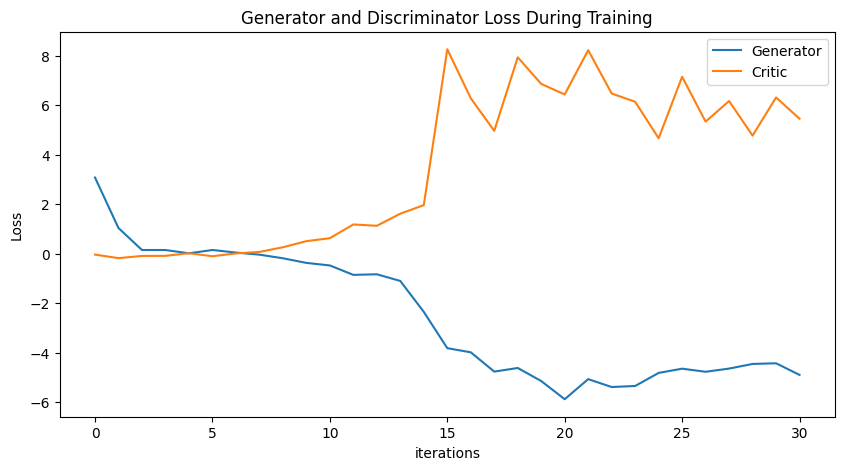

Epoch 40: Critic error ([3.074134025230567, 1.0341115962656713, 0.14670704278374427, 0.14543150024526144, 0.012200900021435118, 0.14713128999246664, 0.04361579512422473, -0.04115287576810593, -0.1877020979457912, -0.3744406821056279, -0.47800208236687264, -0.8591586189721909, -0.8344606636141692, -1.1050422006389473, -2.3548735939297165, -3.8216179718422274, -3.9882642898490825, -4.769062306691371, -4.622052538491371, -5.150036713991248, -5.884985887210024, -5.073021202003716, -5.3917419086369724, -5.350369749605545, -4.821641123699445, -4.650583929372793, -4.775666681379553, -4.646398581655451, -4.45872999467874, -4.431944300031095, -4.902290635641486, -4.681282513299029, -4.4362689444849766, -4.263558018526401, -4.102509948291226, -3.9825913796869377, -3.9458398228827614, -3.7828387513746113, -3.9173085948201085, -3.773653231747794, -4.289328411515153]) Generator err ([-0.03915680944919586, -0.182709738612175, -0.09311235696077347, -0.08998598158359528, 0.016616210341453552, -0.10591

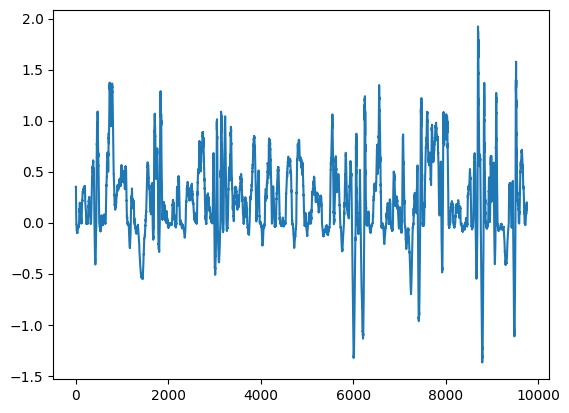

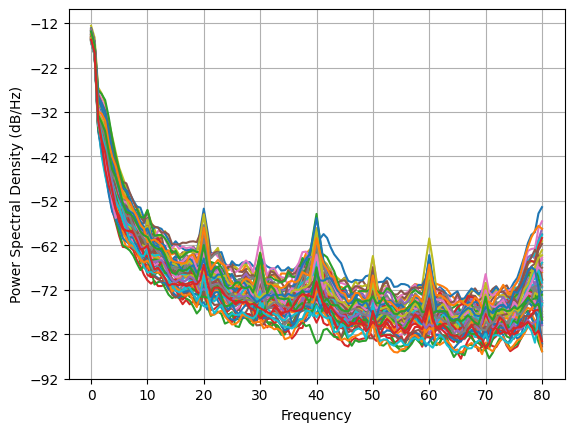

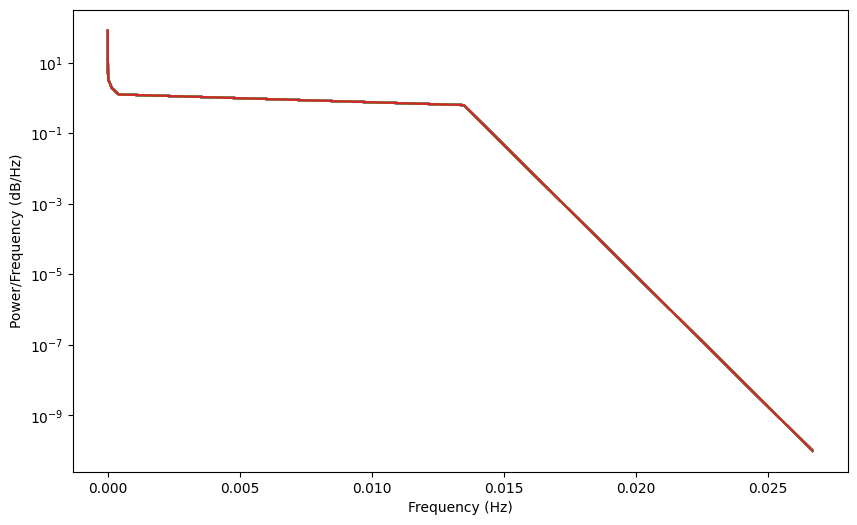

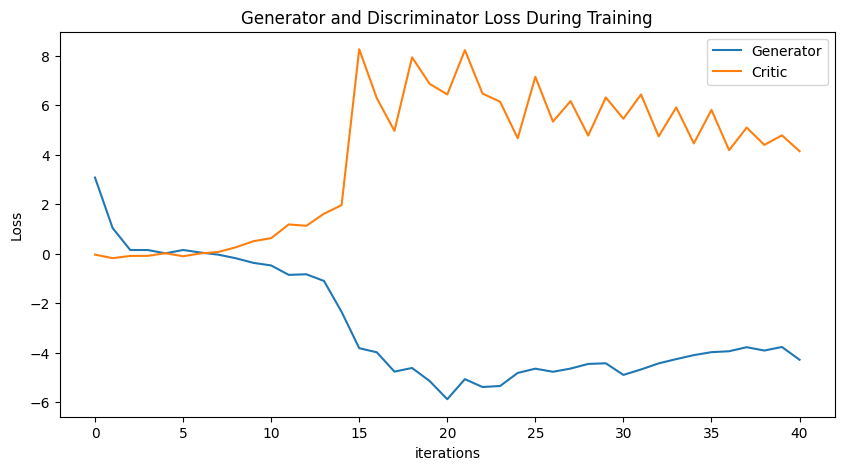

Epoch 50: Critic error ([3.074134025230567, 1.0341115962656713, 0.14670704278374427, 0.14543150024526144, 0.012200900021435118, 0.14713128999246664, 0.04361579512422473, -0.04115287576810593, -0.1877020979457912, -0.3744406821056279, -0.47800208236687264, -0.8591586189721909, -0.8344606636141692, -1.1050422006389473, -2.3548735939297165, -3.8216179718422274, -3.9882642898490825, -4.769062306691371, -4.622052538491371, -5.150036713991248, -5.884985887210024, -5.073021202003716, -5.3917419086369724, -5.350369749605545, -4.821641123699445, -4.650583929372793, -4.775666681379553, -4.646398581655451, -4.45872999467874, -4.431944300031095, -4.902290635641486, -4.681282513299029, -4.4362689444849766, -4.263558018526401, -4.102509948291226, -3.9825913796869377, -3.9458398228827614, -3.7828387513746113, -3.9173085948201085, -3.773653231747794, -4.289328411515153, -3.993896815193323, -3.9900607629368157, -3.8854195827357296, -3.7344819098655035, -3.5739499077722097, -3.8403855020446134, -3.68633

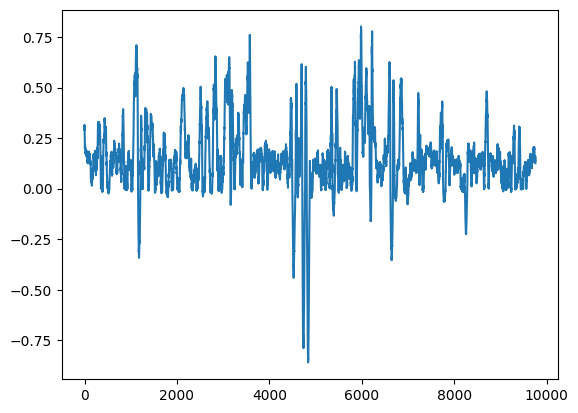

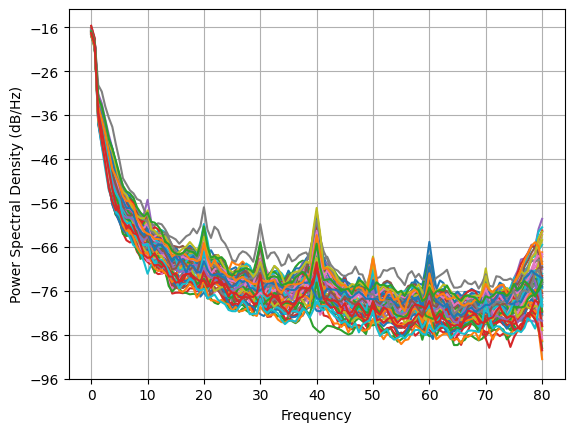

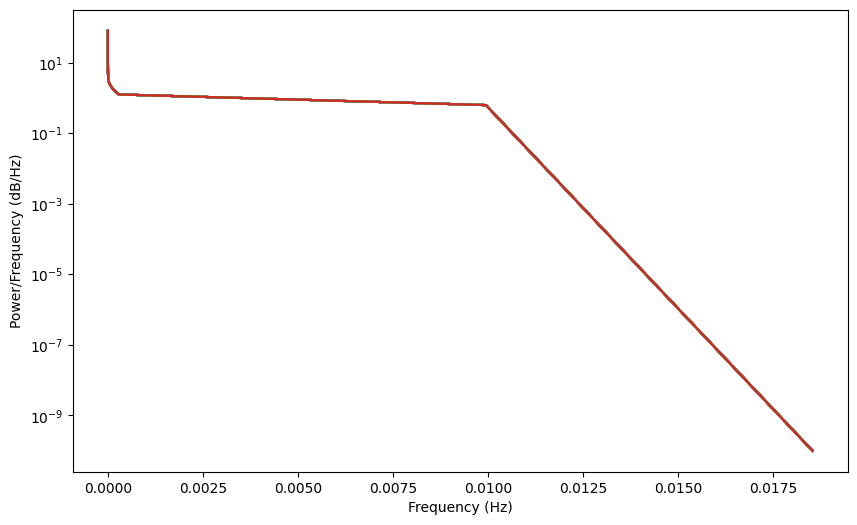

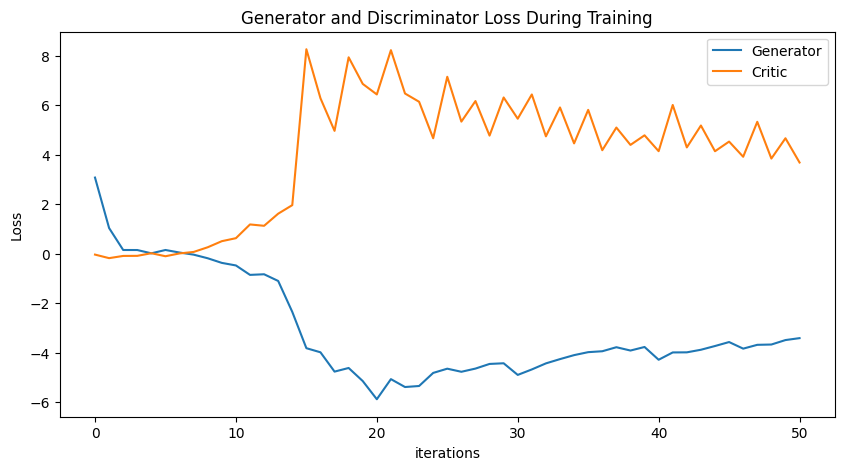

Epoch 60: Critic error ([3.074134025230567, 1.0341115962656713, 0.14670704278374427, 0.14543150024526144, 0.012200900021435118, 0.14713128999246664, 0.04361579512422473, -0.04115287576810593, -0.1877020979457912, -0.3744406821056279, -0.47800208236687264, -0.8591586189721909, -0.8344606636141692, -1.1050422006389473, -2.3548735939297165, -3.8216179718422274, -3.9882642898490825, -4.769062306691371, -4.622052538491371, -5.150036713991248, -5.884985887210024, -5.073021202003716, -5.3917419086369724, -5.350369749605545, -4.821641123699445, -4.650583929372793, -4.775666681379553, -4.646398581655451, -4.45872999467874, -4.431944300031095, -4.902290635641486, -4.681282513299029, -4.4362689444849766, -4.263558018526401, -4.102509948291226, -3.9825913796869377, -3.9458398228827614, -3.7828387513746113, -3.9173085948201085, -3.773653231747794, -4.289328411515153, -3.993896815193323, -3.9900607629368157, -3.8854195827357296, -3.7344819098655035, -3.5739499077722097, -3.8403855020446134, -3.68633

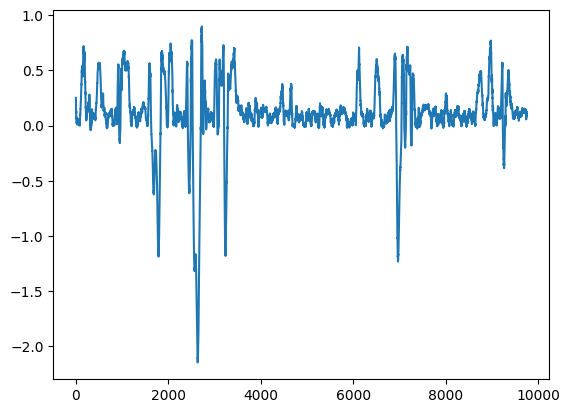

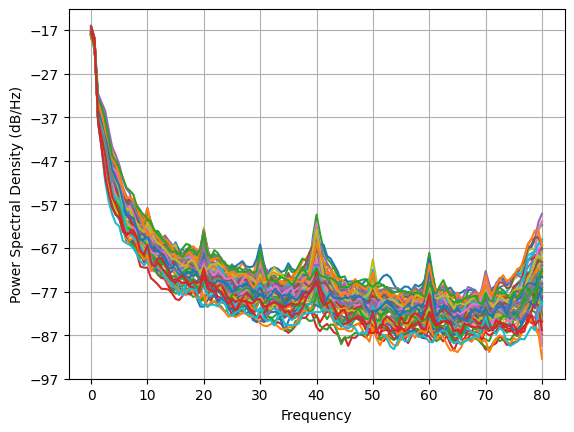

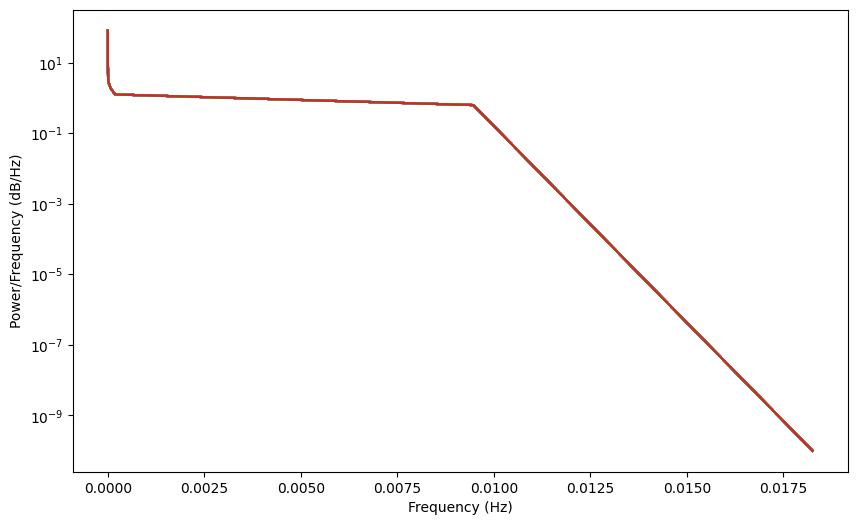

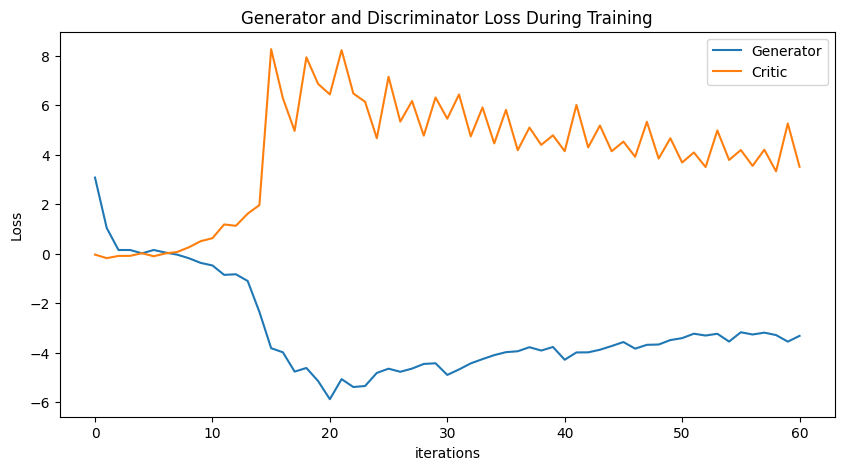

Epoch 70: Critic error ([3.074134025230567, 1.0341115962656713, 0.14670704278374427, 0.14543150024526144, 0.012200900021435118, 0.14713128999246664, 0.04361579512422473, -0.04115287576810593, -0.1877020979457912, -0.3744406821056279, -0.47800208236687264, -0.8591586189721909, -0.8344606636141692, -1.1050422006389473, -2.3548735939297165, -3.8216179718422274, -3.9882642898490825, -4.769062306691371, -4.622052538491371, -5.150036713991248, -5.884985887210024, -5.073021202003716, -5.3917419086369724, -5.350369749605545, -4.821641123699445, -4.650583929372793, -4.775666681379553, -4.646398581655451, -4.45872999467874, -4.431944300031095, -4.902290635641486, -4.681282513299029, -4.4362689444849766, -4.263558018526401, -4.102509948291226, -3.9825913796869377, -3.9458398228827614, -3.7828387513746113, -3.9173085948201085, -3.773653231747794, -4.289328411515153, -3.993896815193323, -3.9900607629368157, -3.8854195827357296, -3.7344819098655035, -3.5739499077722097, -3.8403855020446134, -3.68633

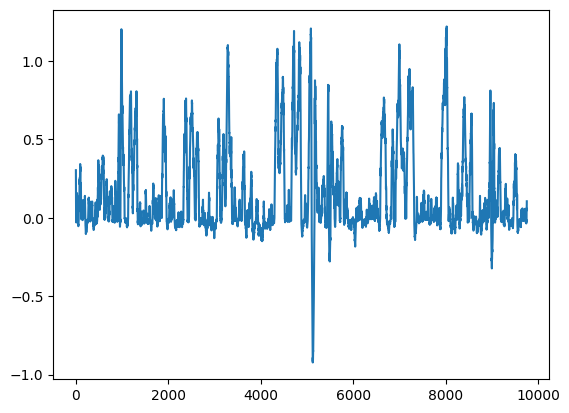

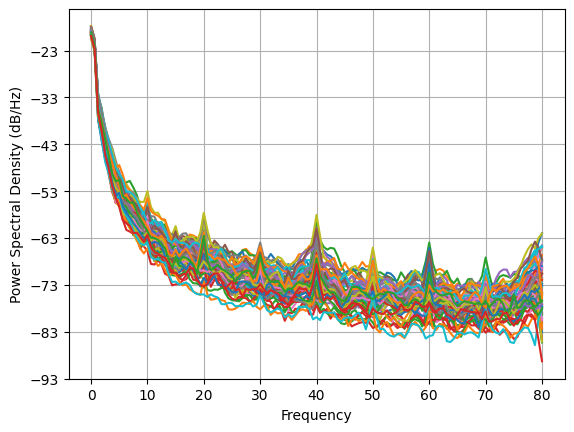

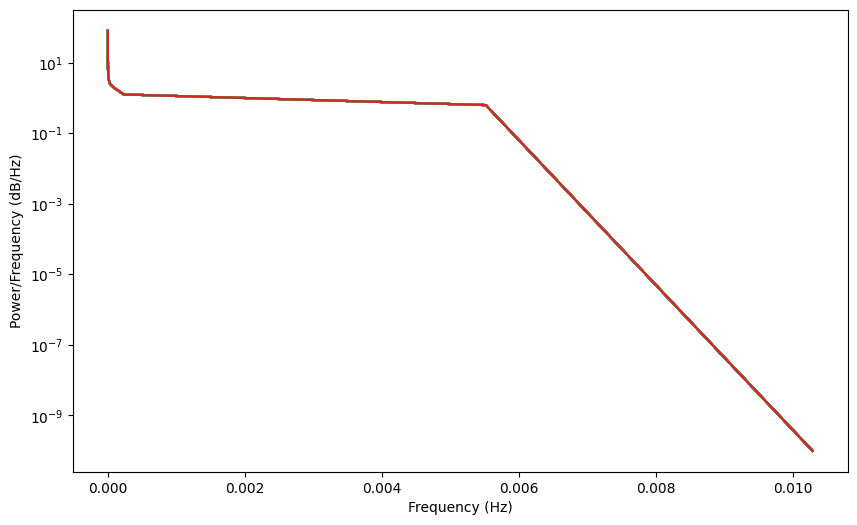

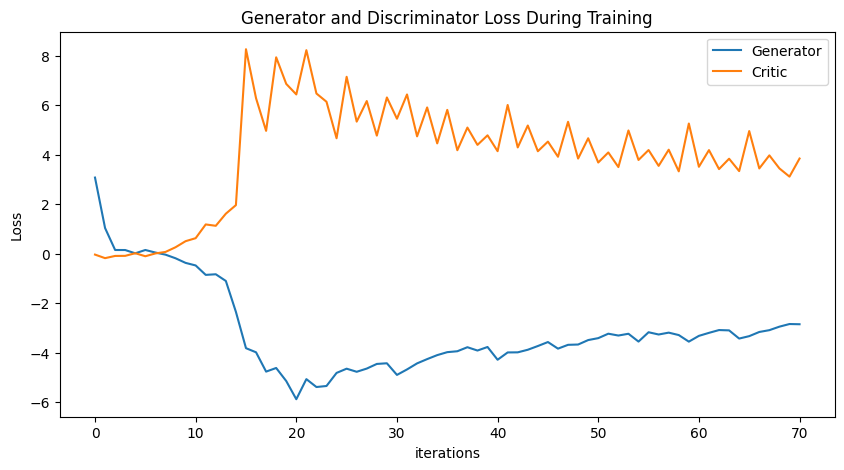

Epoch 80: Critic error ([3.074134025230567, 1.0341115962656713, 0.14670704278374427, 0.14543150024526144, 0.012200900021435118, 0.14713128999246664, 0.04361579512422473, -0.04115287576810593, -0.1877020979457912, -0.3744406821056279, -0.47800208236687264, -0.8591586189721909, -0.8344606636141692, -1.1050422006389473, -2.3548735939297165, -3.8216179718422274, -3.9882642898490825, -4.769062306691371, -4.622052538491371, -5.150036713991248, -5.884985887210024, -5.073021202003716, -5.3917419086369724, -5.350369749605545, -4.821641123699445, -4.650583929372793, -4.775666681379553, -4.646398581655451, -4.45872999467874, -4.431944300031095, -4.902290635641486, -4.681282513299029, -4.4362689444849766, -4.263558018526401, -4.102509948291226, -3.9825913796869377, -3.9458398228827614, -3.7828387513746113, -3.9173085948201085, -3.773653231747794, -4.289328411515153, -3.993896815193323, -3.9900607629368157, -3.8854195827357296, -3.7344819098655035, -3.5739499077722097, -3.8403855020446134, -3.68633

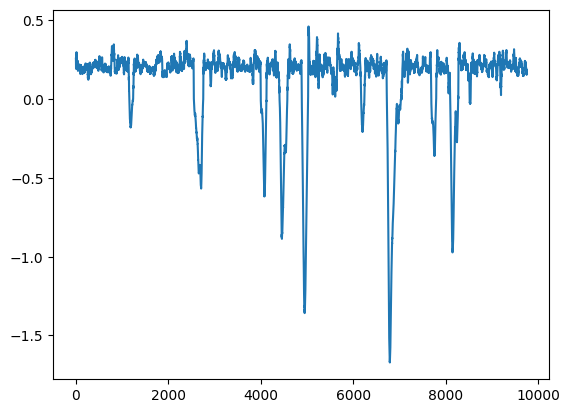

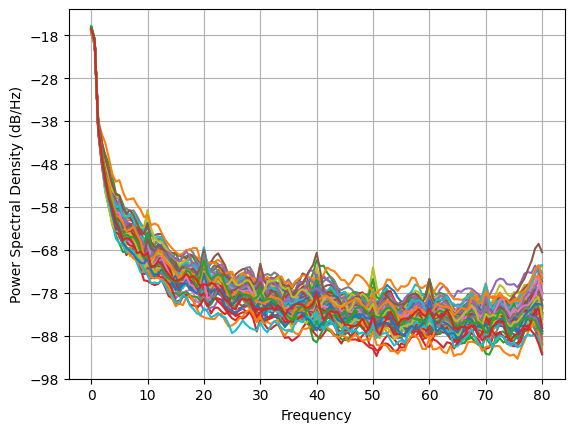

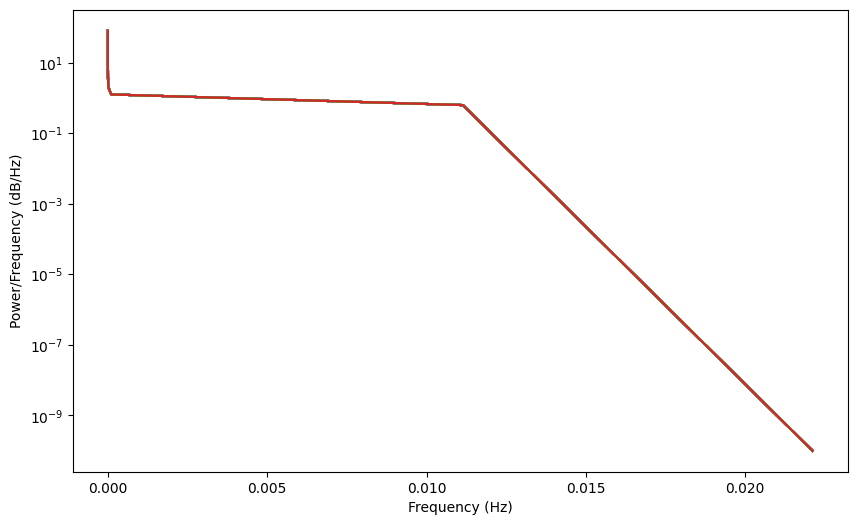

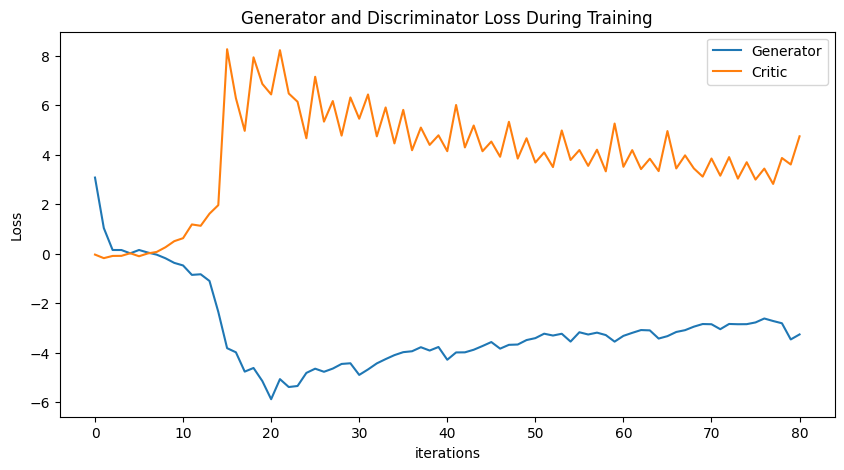

Epoch 90: Critic error ([3.074134025230567, 1.0341115962656713, 0.14670704278374427, 0.14543150024526144, 0.012200900021435118, 0.14713128999246664, 0.04361579512422473, -0.04115287576810593, -0.1877020979457912, -0.3744406821056279, -0.47800208236687264, -0.8591586189721909, -0.8344606636141692, -1.1050422006389473, -2.3548735939297165, -3.8216179718422274, -3.9882642898490825, -4.769062306691371, -4.622052538491371, -5.150036713991248, -5.884985887210024, -5.073021202003716, -5.3917419086369724, -5.350369749605545, -4.821641123699445, -4.650583929372793, -4.775666681379553, -4.646398581655451, -4.45872999467874, -4.431944300031095, -4.902290635641486, -4.681282513299029, -4.4362689444849766, -4.263558018526401, -4.102509948291226, -3.9825913796869377, -3.9458398228827614, -3.7828387513746113, -3.9173085948201085, -3.773653231747794, -4.289328411515153, -3.993896815193323, -3.9900607629368157, -3.8854195827357296, -3.7344819098655035, -3.5739499077722097, -3.8403855020446134, -3.68633

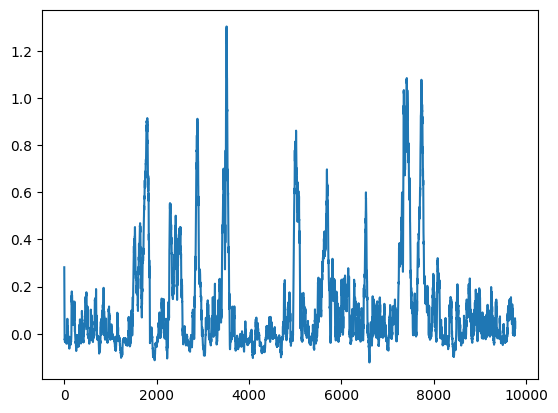

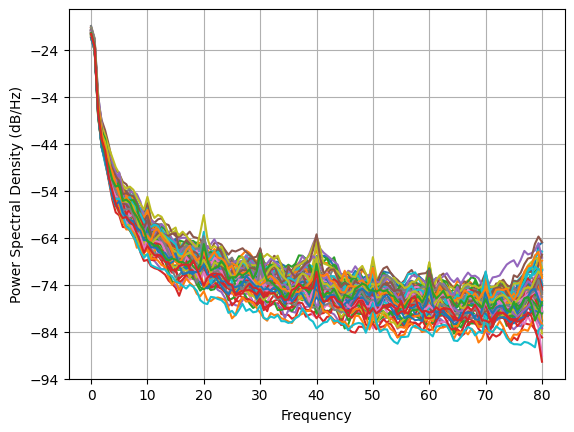

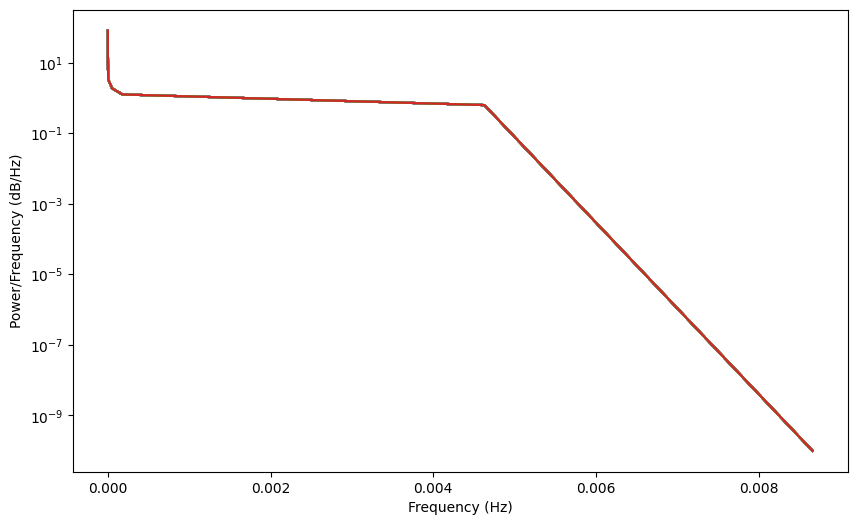

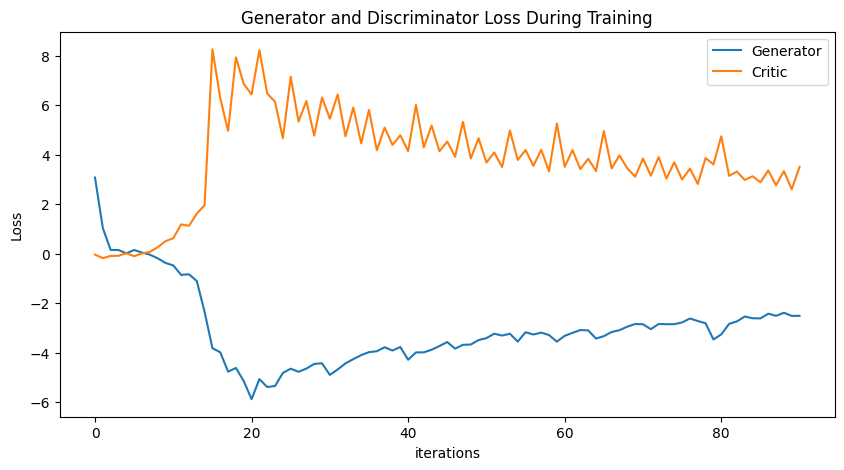

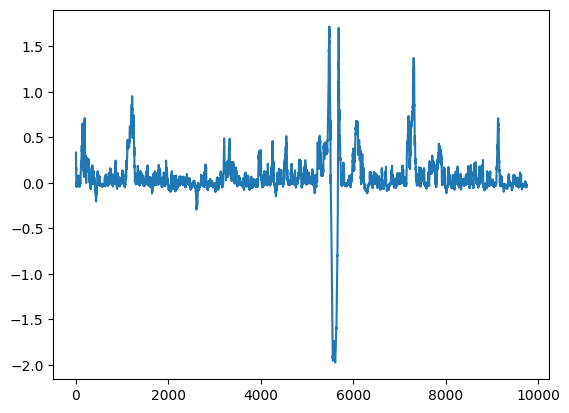

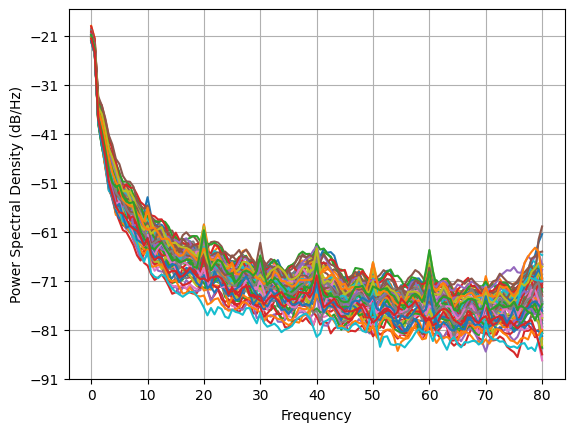

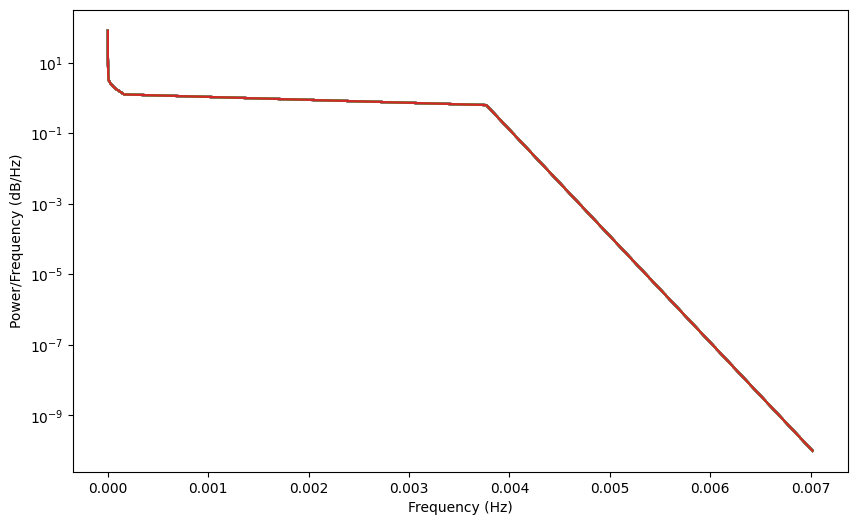

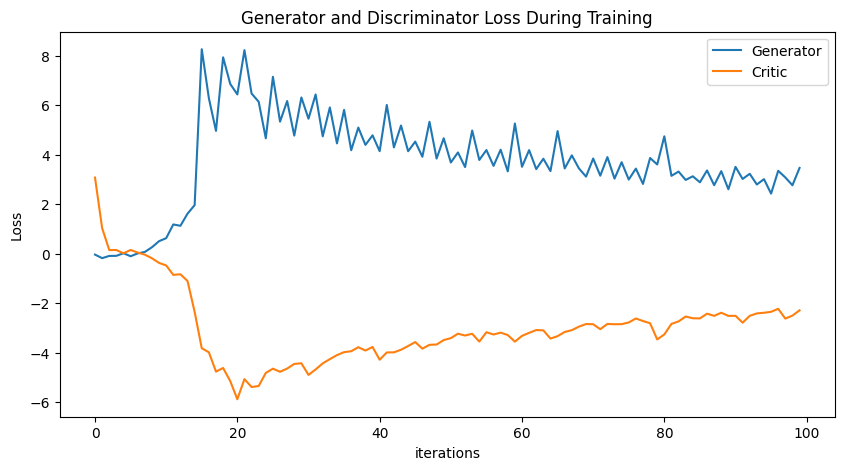

In [10]:
NUM_EPOCHS = 100
PRINT_INTERVAL = 10
BATCH_SIZE = np.shape(training_data_closed)[0]
training_data = torch.tensor(training_data_closed)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
            fake = G(noise)
            critic_real = D(real).reshape(-1)
            critic_fake = D(fake).reshape(-1)
            gp = gradient_penalty(D, real, fake)
            critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            D.zero_grad()
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()
            critic_optimizer.zero_grad()

        generated_data = fake
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        gen_optimizer.zero_grad()

        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_closed, disc, gen = train()

torch.save(gen, 'gen_FINAL_closed.pt')
torch.save(disc, 'disc_FINAL_closed.pt')

plot_everything(generated_data_closed, gen_err, critic_err)

In [22]:
data = np.array(training_data_open)

np.save('training_open.npy', data)
# loaded_tensor = np.load('josh_output.npy')








# NORMALIZED






eyes open


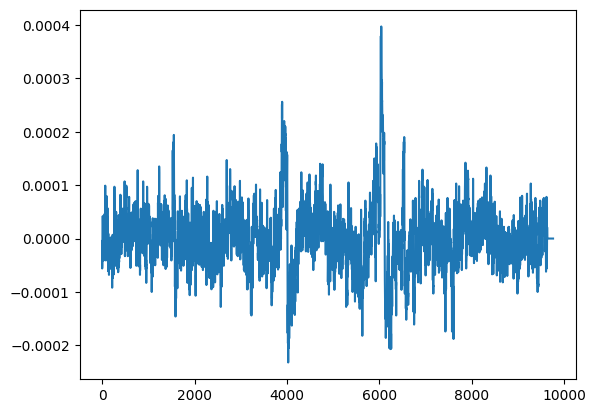

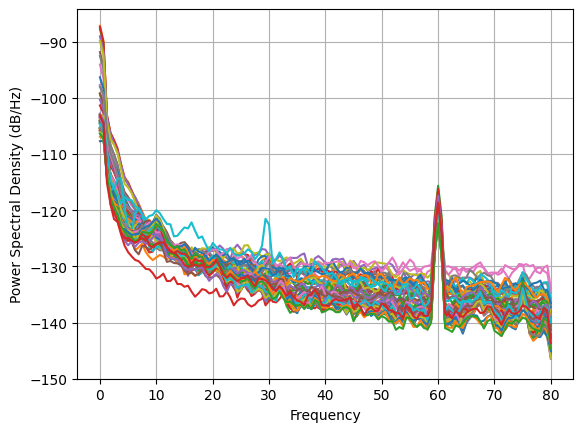

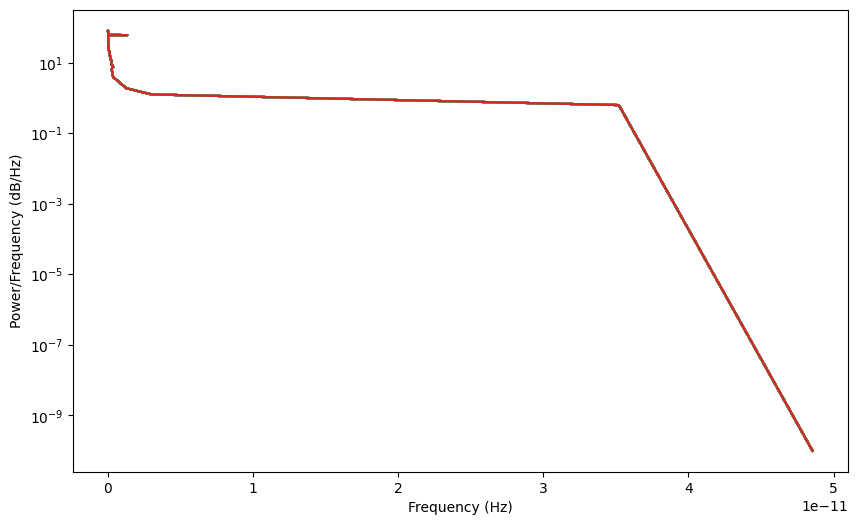

eyes open normalized


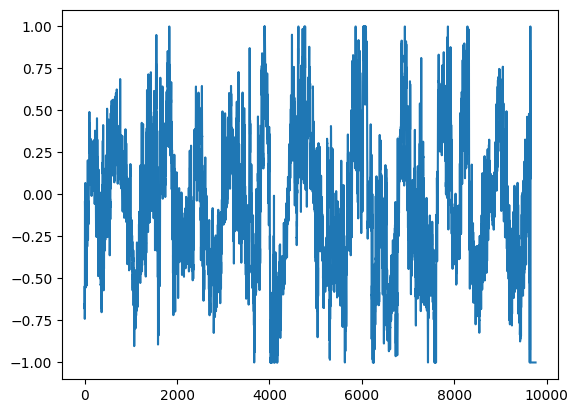

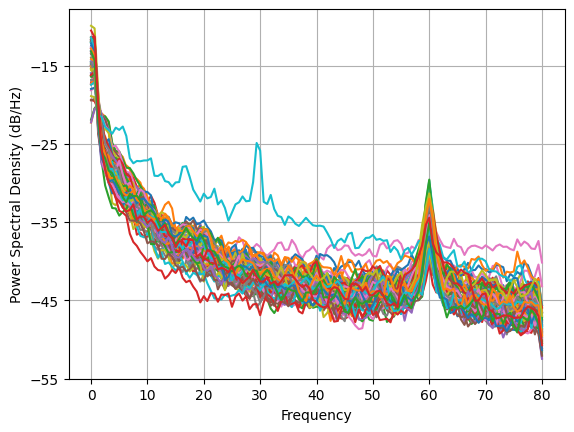

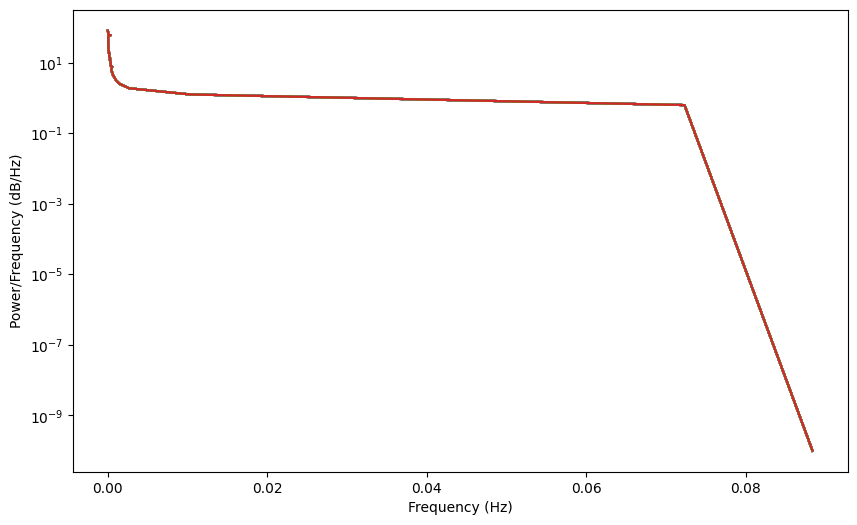

eyes closed


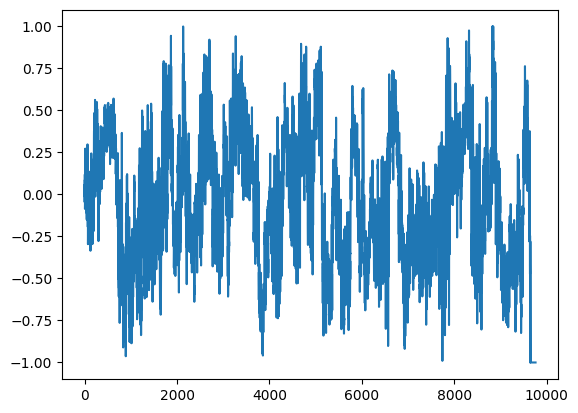

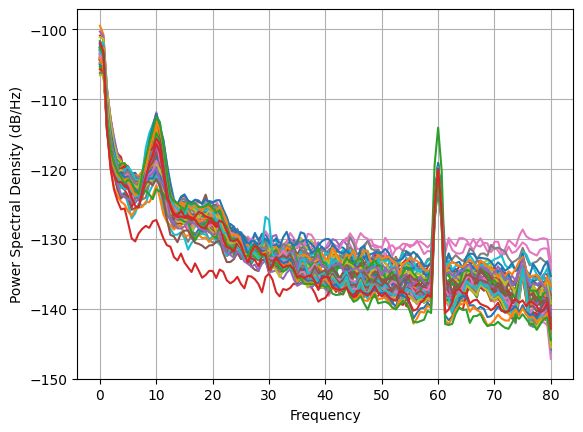

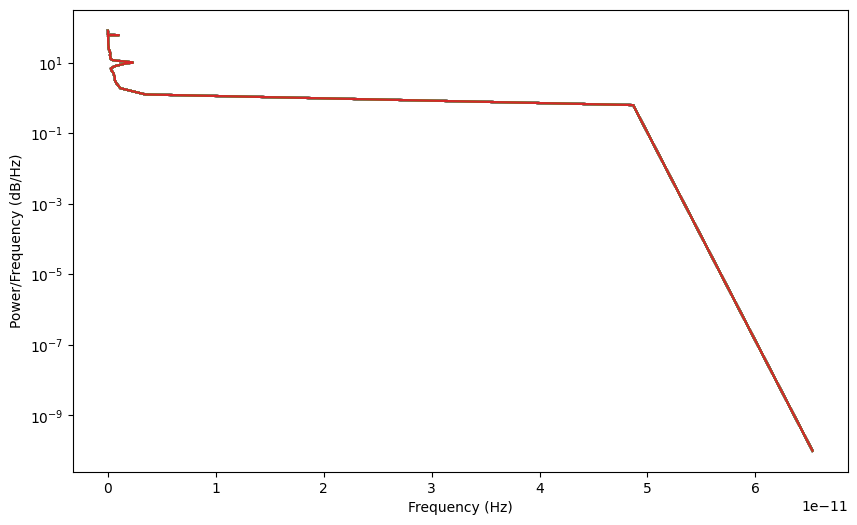

eyes closed normalized


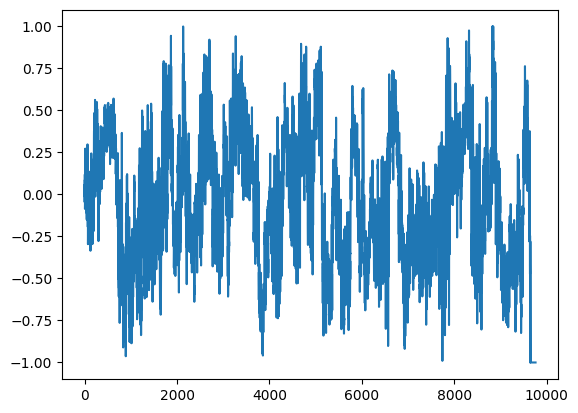

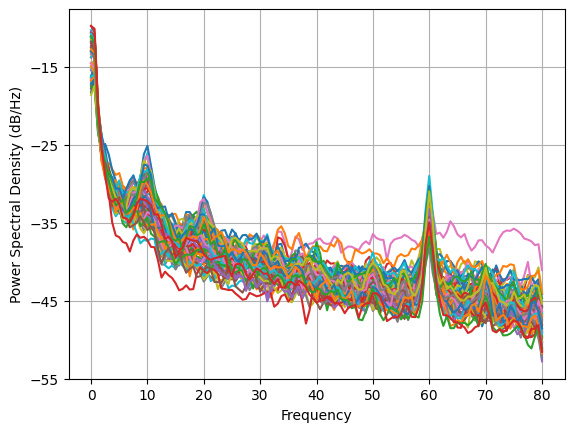

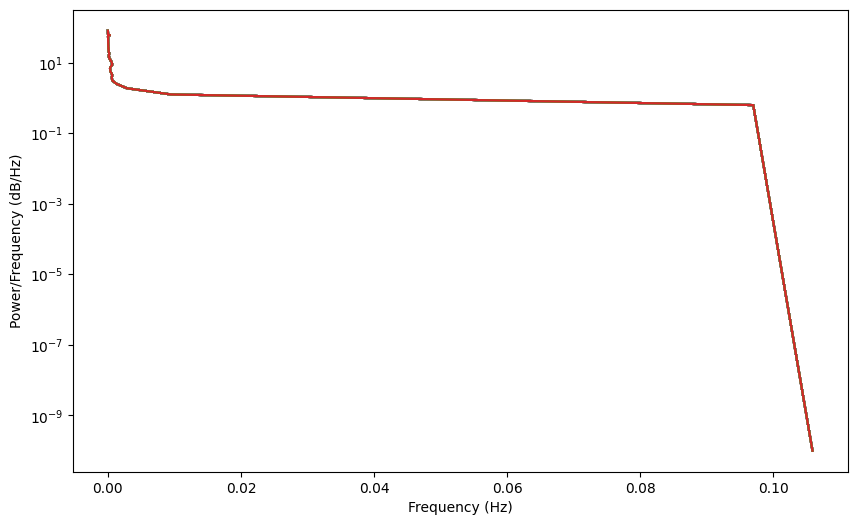

In [11]:
# Normalize the data (OPEN)
scaler = MinMaxScaler(feature_range=(-1, 1))
normalized_data_open = np.zeros_like(training_data_open)
for i in range(training_data_open.shape[1]):
    scaler = scaler.fit(training_data_open[:, i])
    normalized_data_open[:, i] = scaler.transform(training_data_open[:, i])

print("eyes open")
plt.plot(training_data_open[0][0])
plt.show()
averaged_data = average_across_arrays(torch.tensor(training_data_open).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()


print("eyes open normalized")
plt.plot(normalized_data_open[0][0])
plt.show()
averaged_data = average_across_arrays(torch.tensor(normalized_data_open).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()








# Normalize the data (CLOSED)
scaler = MinMaxScaler(feature_range=(-1, 1))
normalized_data_closed = np.zeros_like(training_data_closed)
for i in range(training_data_closed.shape[1]):
    scaler = scaler.fit(training_data_closed[:, i])
    normalized_data_closed[:, i] = scaler.transform(training_data_closed[:, i])
    
print("eyes closed")
plt.plot(normalized_data_closed[0][0])
plt.show()
averaged_data = average_across_arrays(torch.tensor(training_data_closed).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()


print("eyes closed normalized")
plt.plot(normalized_data_closed[0][0])
plt.show()
averaged_data = average_across_arrays(torch.tensor(normalized_data_closed).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(eeg_data.shape[0]):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()

# Final model (same, normalized)

Epoch 0: Critic error ([1.636278151395983]) Generator err ([-0.04993994161486626])


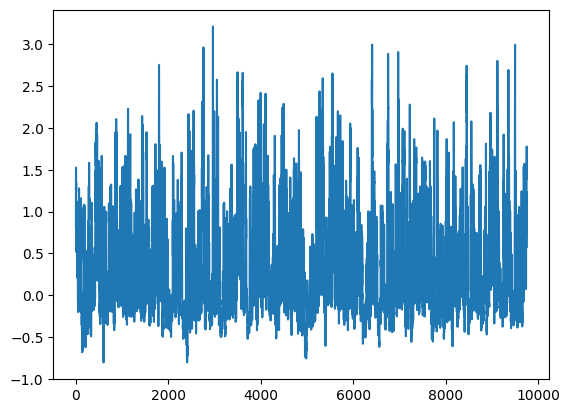

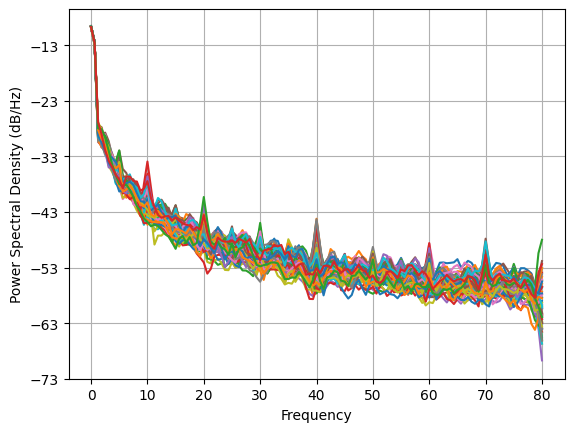

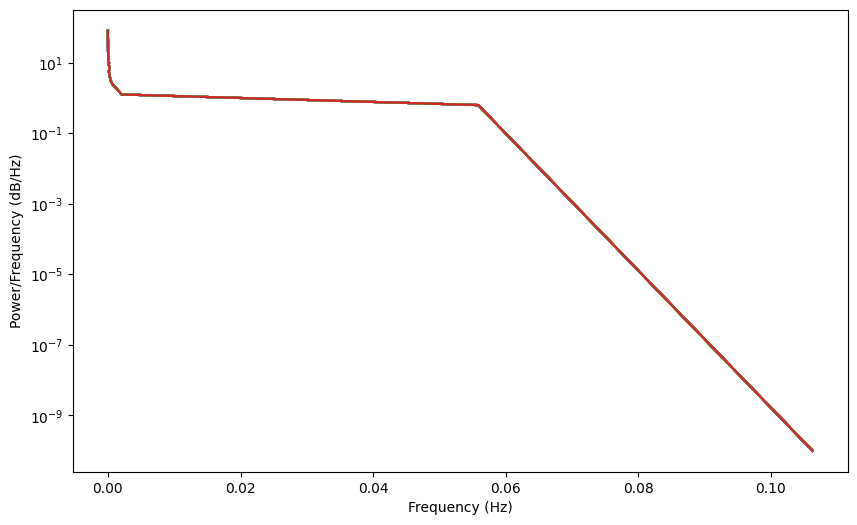

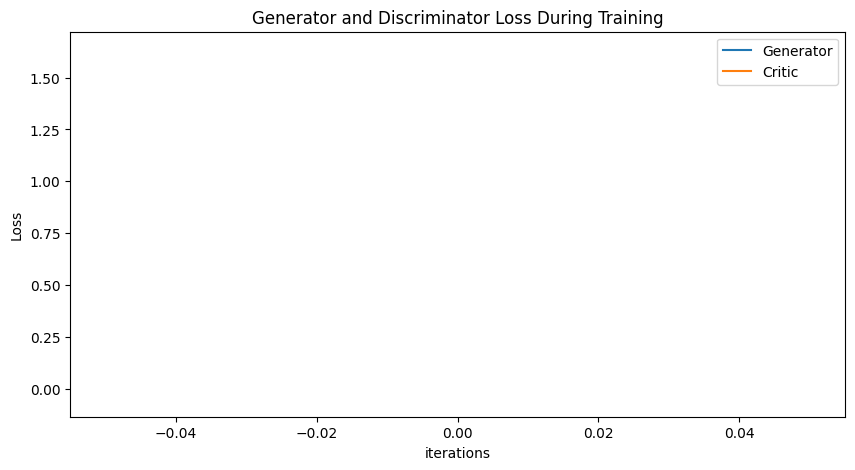

Epoch 10: Critic error ([1.636278151395983, 1.1947108601513445, 0.5434537618838005, 0.23142265965301617, 0.1462193022393507, 0.17330517174553406, 0.16192031070854987, 0.2527828492233176, 0.2197818277100378, 0.11971180863426013, 0.1971996026641597]) Generator err ([-0.04993994161486626, -0.08131281286478043, -0.15818901360034943, -0.16243460774421692, -0.13941054046154022, -0.1817455142736435, -0.15567126870155334, -0.24262139201164246, -0.2006678581237793, -0.10680171102285385, -0.18385407328605652])


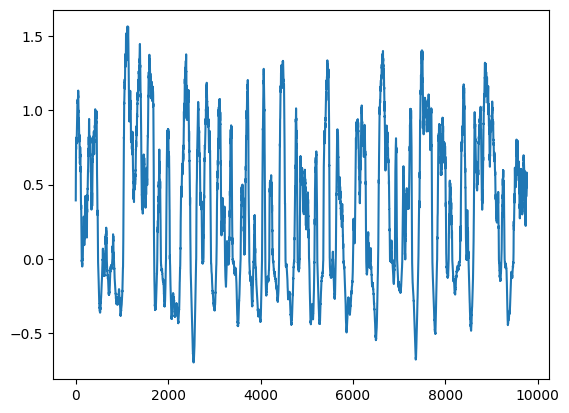

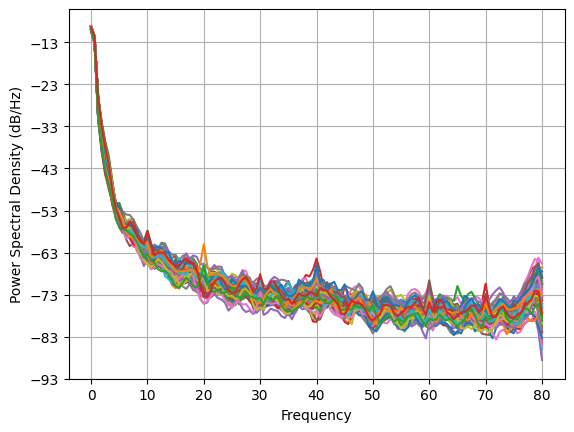

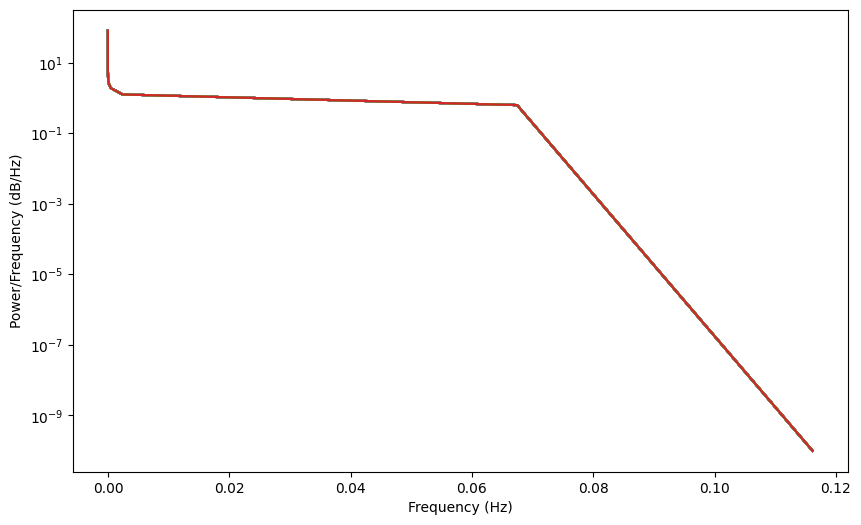

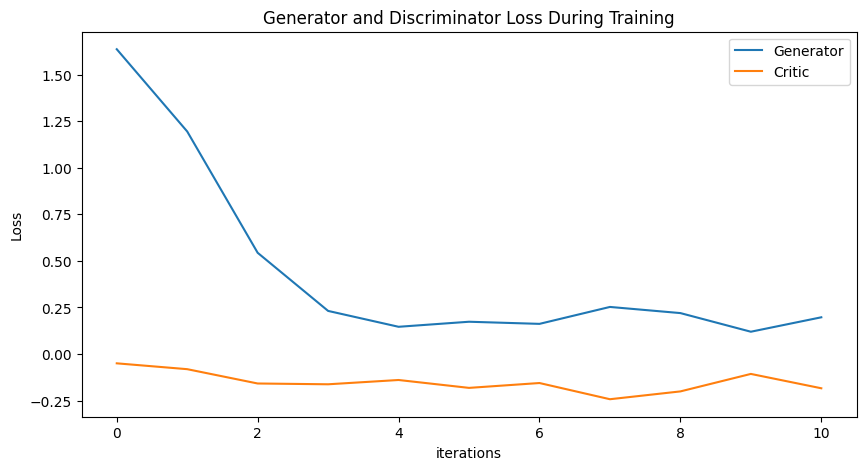

Epoch 20: Critic error ([1.636278151395983, 1.1947108601513445, 0.5434537618838005, 0.23142265965301617, 0.1462193022393507, 0.17330517174553406, 0.16192031070854987, 0.2527828492233176, 0.2197818277100378, 0.11971180863426013, 0.1971996026641597, 0.06117138311550831, 0.025349378758604685, -0.08202754433209809, -0.1928547627639595, -0.2373398493494254, -0.23425874625625237, -0.3277584562807632, -0.19742671011302848, -0.087781553266025, -0.03426589363882725]) Generator err ([-0.04993994161486626, -0.08131281286478043, -0.15818901360034943, -0.16243460774421692, -0.13941054046154022, -0.1817455142736435, -0.15567126870155334, -0.24262139201164246, -0.2006678581237793, -0.10680171102285385, -0.18385407328605652, -0.020122544839978218, -0.0013815449783578515, 0.12306878715753555, 0.2094467133283615, 0.24446681141853333, 0.245914489030838, 0.3433801233768463, 0.1964447945356369, 0.0821208730340004, 0.014273663982748985])


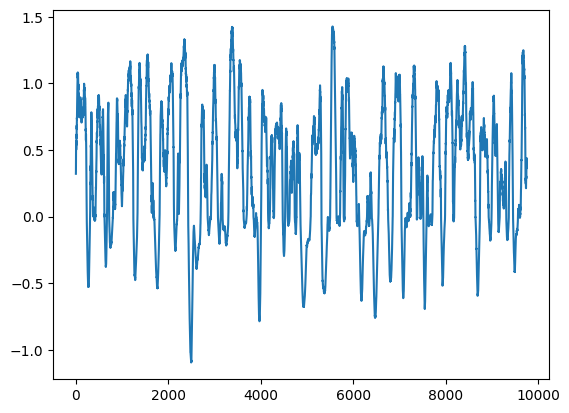

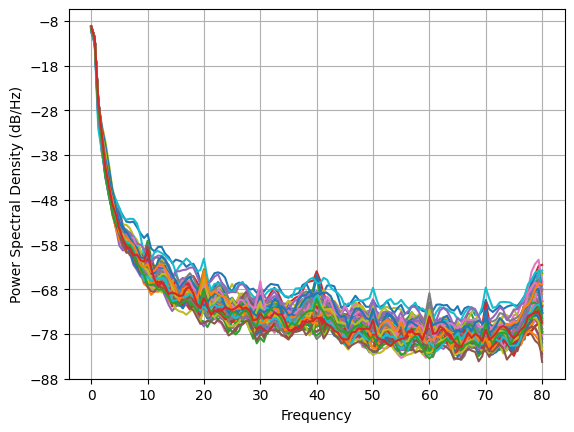

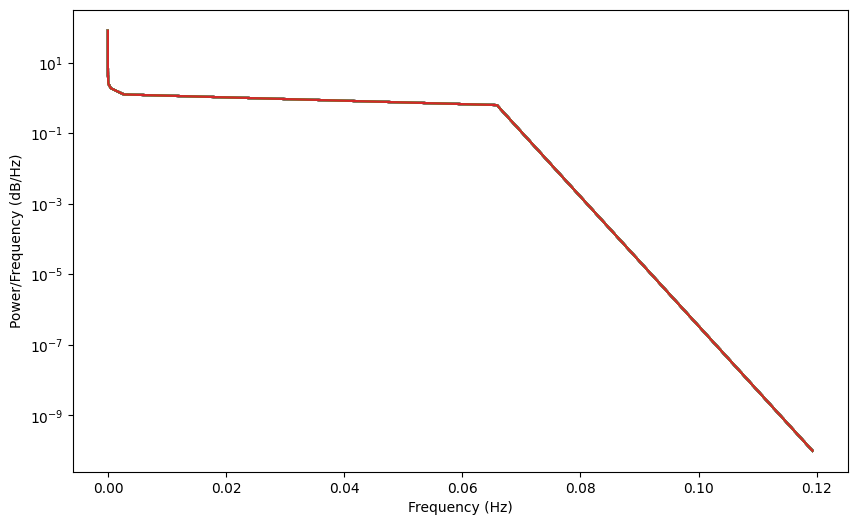

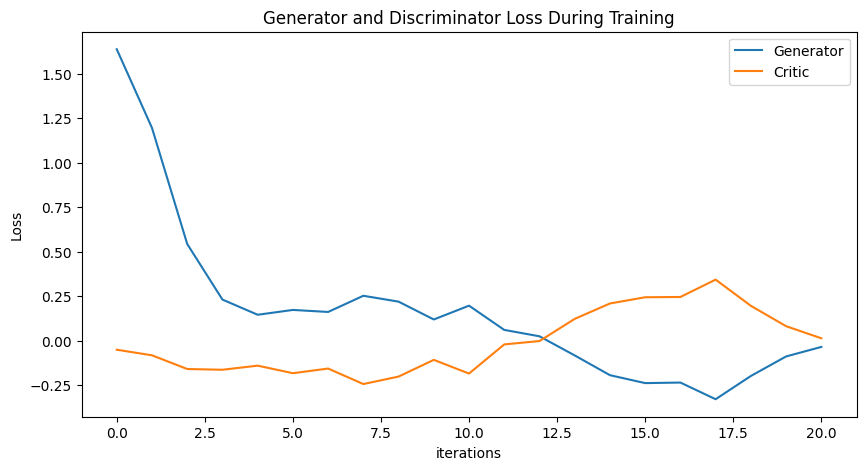

Epoch 30: Critic error ([1.636278151395983, 1.1947108601513445, 0.5434537618838005, 0.23142265965301617, 0.1462193022393507, 0.17330517174553406, 0.16192031070854987, 0.2527828492233176, 0.2197818277100378, 0.11971180863426013, 0.1971996026641597, 0.06117138311550831, 0.025349378758604685, -0.08202754433209809, -0.1928547627639595, -0.2373398493494254, -0.23425874625625237, -0.3277584562807632, -0.19742671011302848, -0.087781553266025, -0.03426589363882725, -0.006618189659084048, -0.023768207371601822, -0.028378969235561904, -0.030234403062791747, 0.004775354510752592, 0.0202438843573789, 0.010956926992496313, 0.01588185960805943, 0.02260131409610358, 0.006961745523198375]) Generator err ([-0.04993994161486626, -0.08131281286478043, -0.15818901360034943, -0.16243460774421692, -0.13941054046154022, -0.1817455142736435, -0.15567126870155334, -0.24262139201164246, -0.2006678581237793, -0.10680171102285385, -0.18385407328605652, -0.020122544839978218, -0.0013815449783578515, 0.123068787157

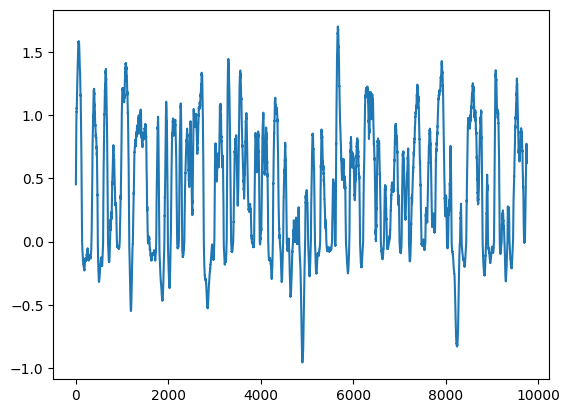

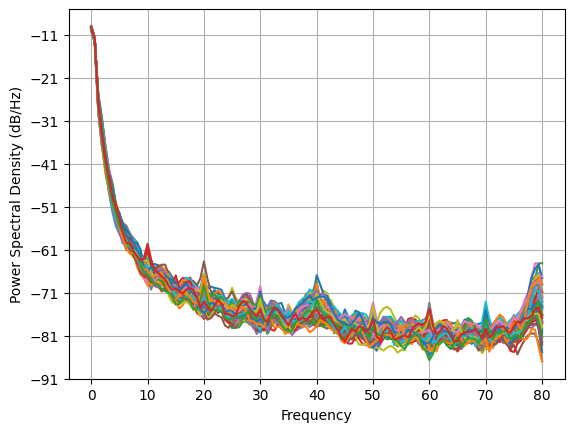

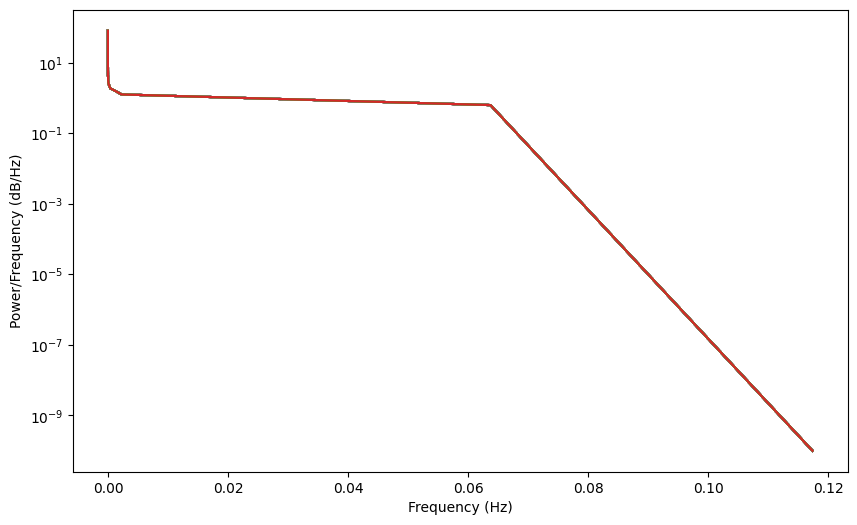

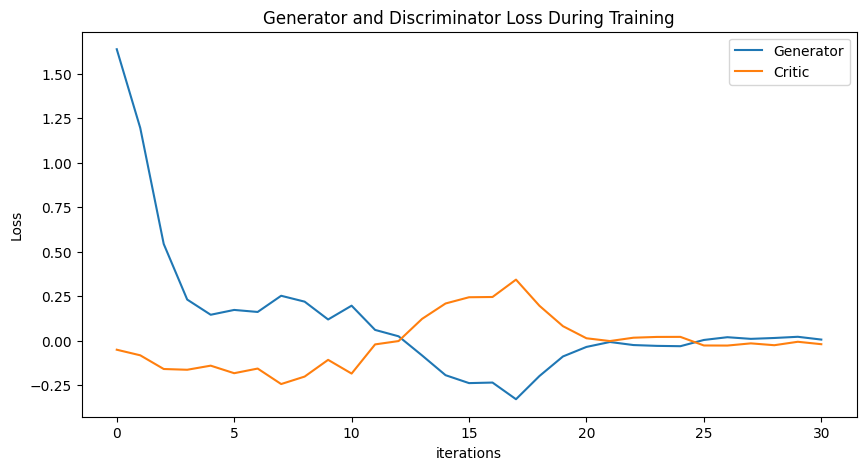

Epoch 40: Critic error ([1.636278151395983, 1.1947108601513445, 0.5434537618838005, 0.23142265965301617, 0.1462193022393507, 0.17330517174553406, 0.16192031070854987, 0.2527828492233176, 0.2197818277100378, 0.11971180863426013, 0.1971996026641597, 0.06117138311550831, 0.025349378758604685, -0.08202754433209809, -0.1928547627639595, -0.2373398493494254, -0.23425874625625237, -0.3277584562807632, -0.19742671011302848, -0.087781553266025, -0.03426589363882725, -0.006618189659084048, -0.023768207371601822, -0.028378969235561904, -0.030234403062791747, 0.004775354510752592, 0.0202438843573789, 0.010956926992496313, 0.01588185960805943, 0.02260131409610358, 0.006961745523198375, 0.04088967060993866, 0.017576041797328933, 0.006313061585676863, 0.004936332911810504, 0.018454398254612155, 0.007874622525865724, 0.05198970802316713, -0.001633974363779933, 0.004348593992298713, -0.019695922458298668]) Generator err ([-0.04993994161486626, -0.08131281286478043, -0.15818901360034943, -0.162434607744

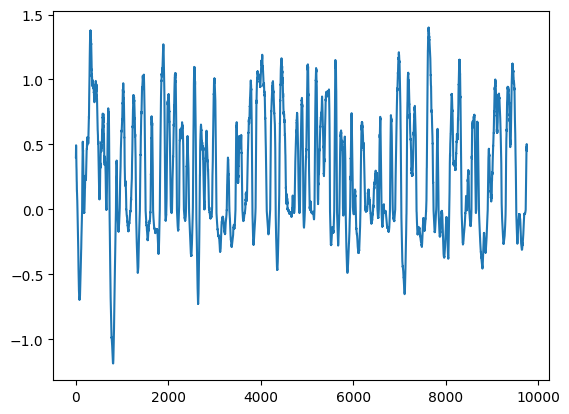

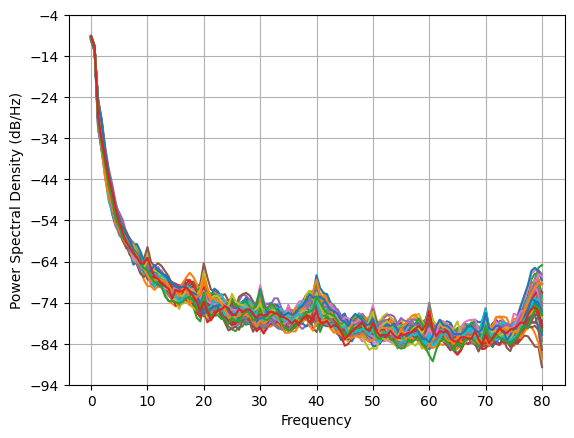

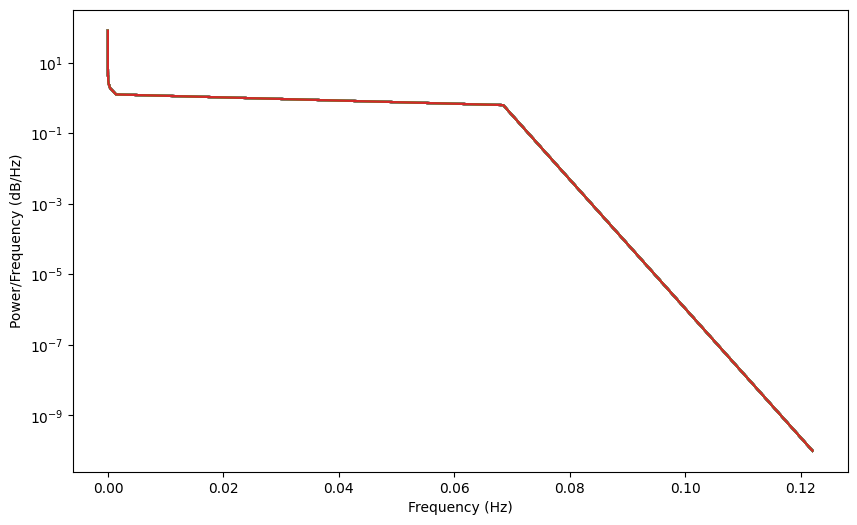

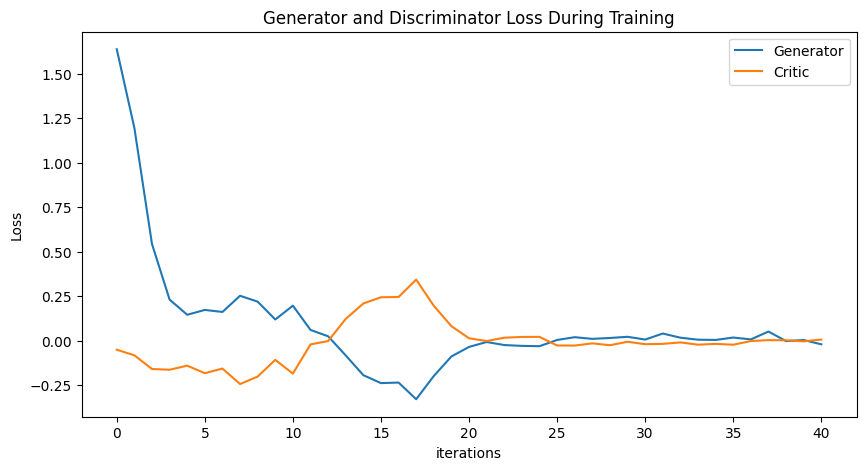

Epoch 50: Critic error ([1.636278151395983, 1.1947108601513445, 0.5434537618838005, 0.23142265965301617, 0.1462193022393507, 0.17330517174553406, 0.16192031070854987, 0.2527828492233176, 0.2197818277100378, 0.11971180863426013, 0.1971996026641597, 0.06117138311550831, 0.025349378758604685, -0.08202754433209809, -0.1928547627639595, -0.2373398493494254, -0.23425874625625237, -0.3277584562807632, -0.19742671011302848, -0.087781553266025, -0.03426589363882725, -0.006618189659084048, -0.023768207371601822, -0.028378969235561904, -0.030234403062791747, 0.004775354510752592, 0.0202438843573789, 0.010956926992496313, 0.01588185960805943, 0.02260131409610358, 0.006961745523198375, 0.04088967060993866, 0.017576041797328933, 0.006313061585676863, 0.004936332911810504, 0.018454398254612155, 0.007874622525865724, 0.05198970802316713, -0.001633974363779933, 0.004348593992298713, -0.019695922458298668, -0.02231048417010925, -0.02628835520964641, -0.09277215233700142, -0.2750375842470049, -0.71419183

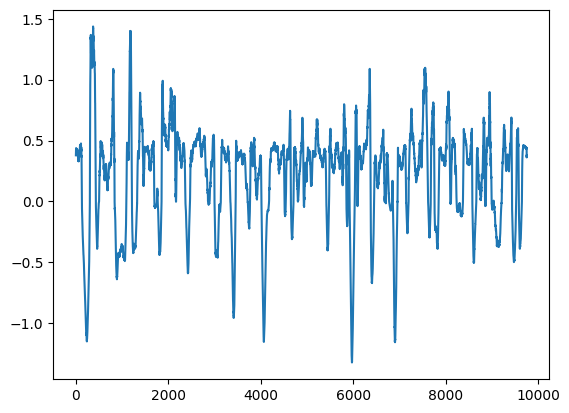

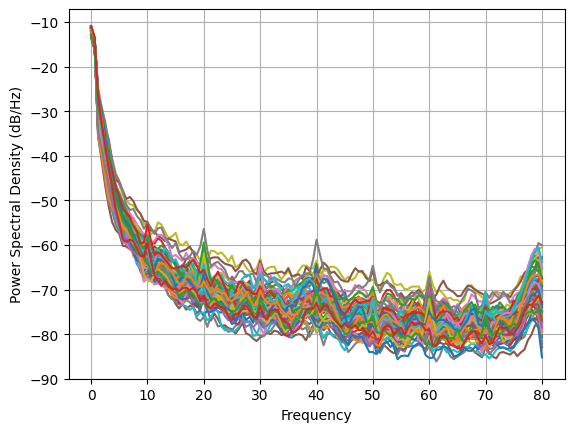

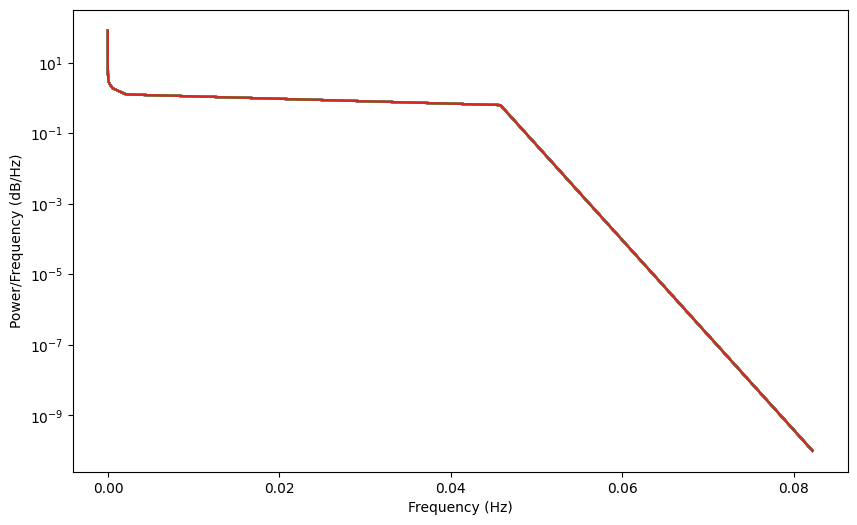

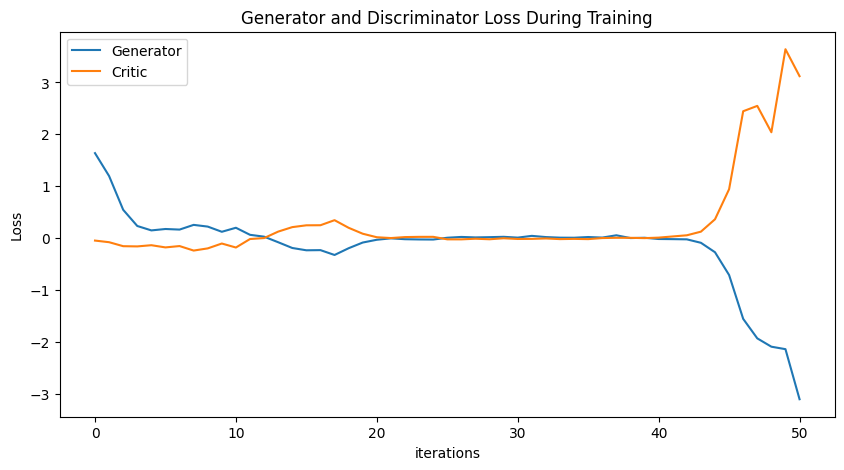

Epoch 60: Critic error ([1.636278151395983, 1.1947108601513445, 0.5434537618838005, 0.23142265965301617, 0.1462193022393507, 0.17330517174553406, 0.16192031070854987, 0.2527828492233176, 0.2197818277100378, 0.11971180863426013, 0.1971996026641597, 0.06117138311550831, 0.025349378758604685, -0.08202754433209809, -0.1928547627639595, -0.2373398493494254, -0.23425874625625237, -0.3277584562807632, -0.19742671011302848, -0.087781553266025, -0.03426589363882725, -0.006618189659084048, -0.023768207371601822, -0.028378969235561904, -0.030234403062791747, 0.004775354510752592, 0.0202438843573789, 0.010956926992496313, 0.01588185960805943, 0.02260131409610358, 0.006961745523198375, 0.04088967060993866, 0.017576041797328933, 0.006313061585676863, 0.004936332911810504, 0.018454398254612155, 0.007874622525865724, 0.05198970802316713, -0.001633974363779933, 0.004348593992298713, -0.019695922458298668, -0.02231048417010925, -0.02628835520964641, -0.09277215233700142, -0.2750375842470049, -0.71419183

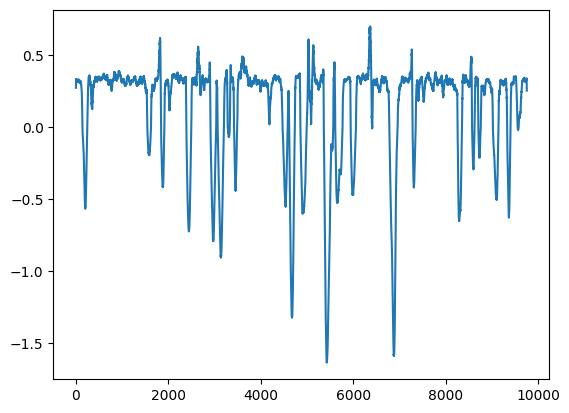

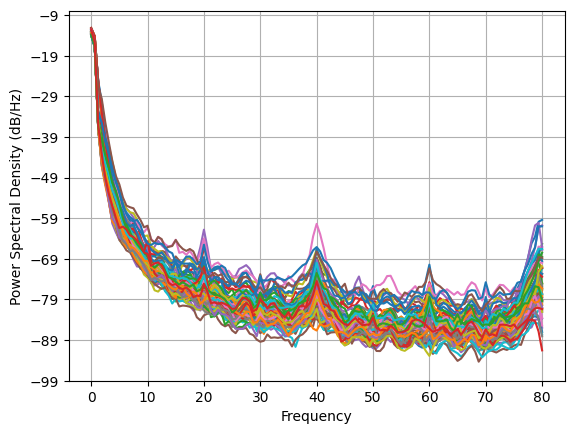

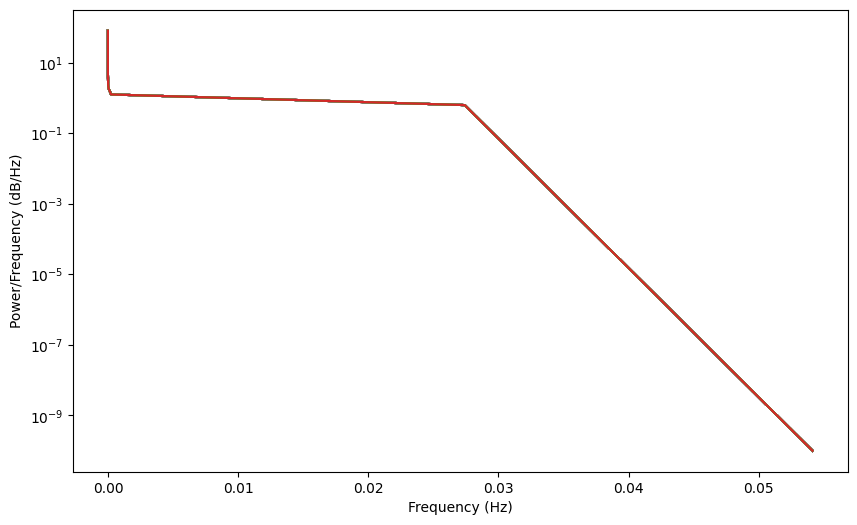

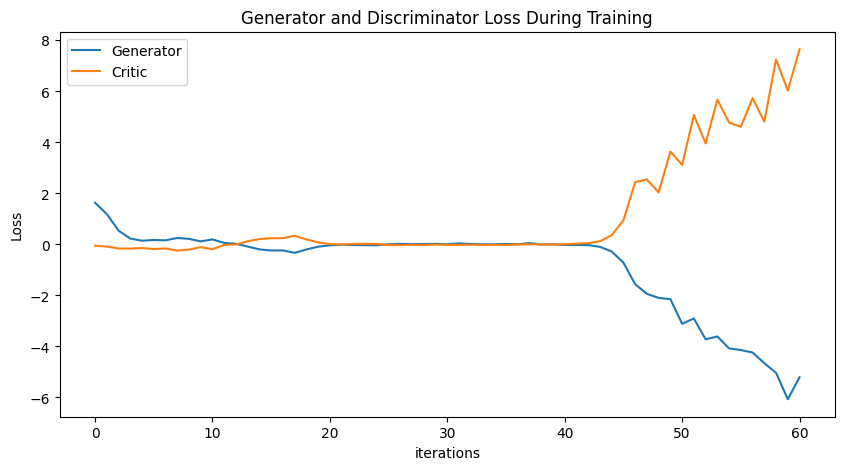

Epoch 70: Critic error ([1.636278151395983, 1.1947108601513445, 0.5434537618838005, 0.23142265965301617, 0.1462193022393507, 0.17330517174553406, 0.16192031070854987, 0.2527828492233176, 0.2197818277100378, 0.11971180863426013, 0.1971996026641597, 0.06117138311550831, 0.025349378758604685, -0.08202754433209809, -0.1928547627639595, -0.2373398493494254, -0.23425874625625237, -0.3277584562807632, -0.19742671011302848, -0.087781553266025, -0.03426589363882725, -0.006618189659084048, -0.023768207371601822, -0.028378969235561904, -0.030234403062791747, 0.004775354510752592, 0.0202438843573789, 0.010956926992496313, 0.01588185960805943, 0.02260131409610358, 0.006961745523198375, 0.04088967060993866, 0.017576041797328933, 0.006313061585676863, 0.004936332911810504, 0.018454398254612155, 0.007874622525865724, 0.05198970802316713, -0.001633974363779933, 0.004348593992298713, -0.019695922458298668, -0.02231048417010925, -0.02628835520964641, -0.09277215233700142, -0.2750375842470049, -0.71419183

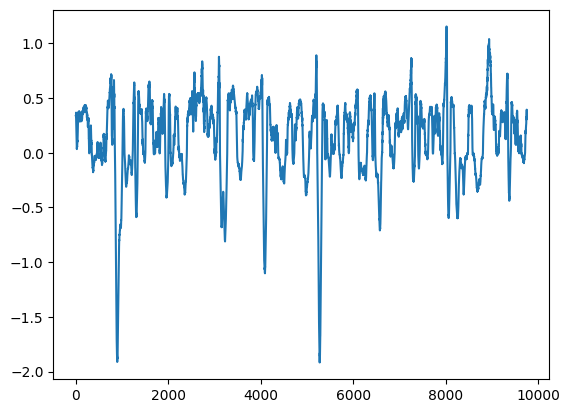

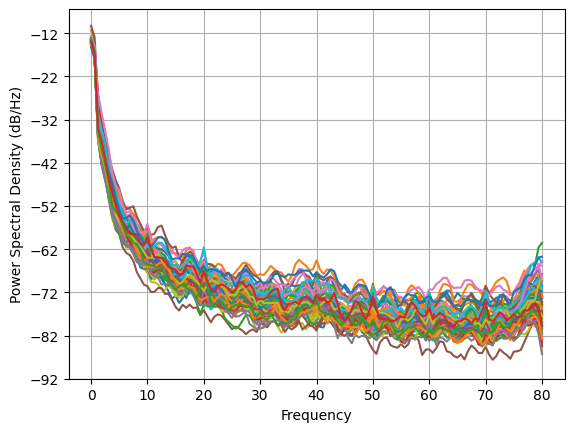

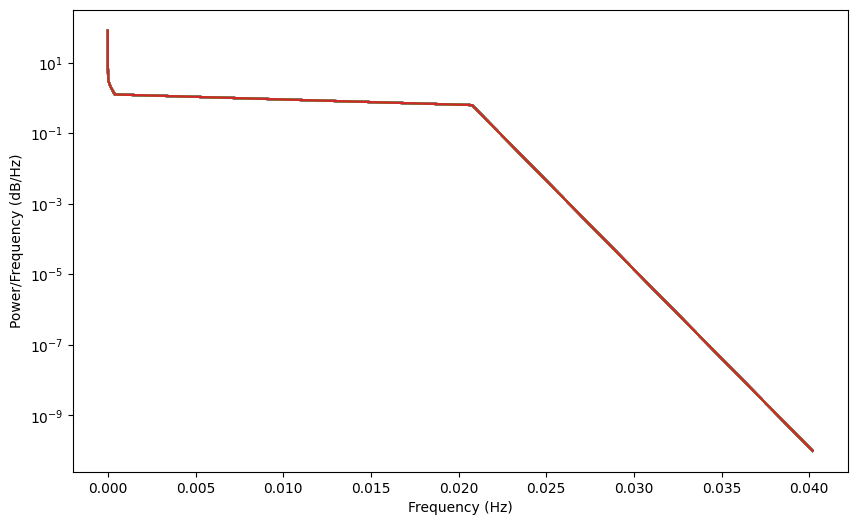

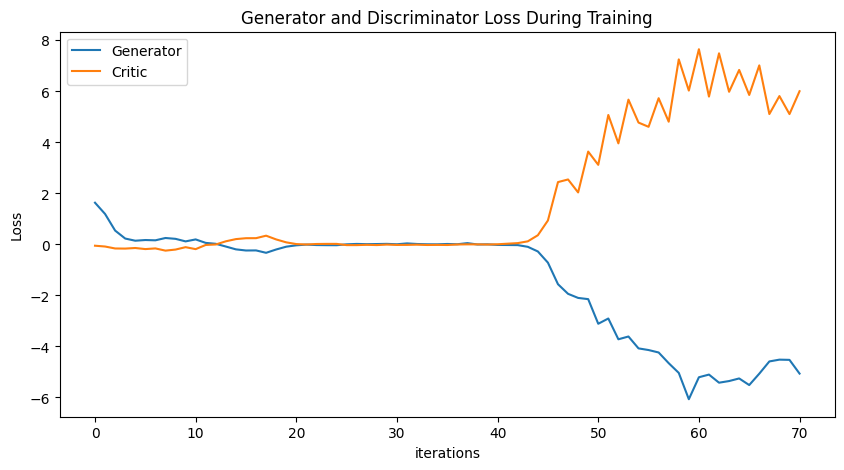

Epoch 80: Critic error ([1.636278151395983, 1.1947108601513445, 0.5434537618838005, 0.23142265965301617, 0.1462193022393507, 0.17330517174553406, 0.16192031070854987, 0.2527828492233176, 0.2197818277100378, 0.11971180863426013, 0.1971996026641597, 0.06117138311550831, 0.025349378758604685, -0.08202754433209809, -0.1928547627639595, -0.2373398493494254, -0.23425874625625237, -0.3277584562807632, -0.19742671011302848, -0.087781553266025, -0.03426589363882725, -0.006618189659084048, -0.023768207371601822, -0.028378969235561904, -0.030234403062791747, 0.004775354510752592, 0.0202438843573789, 0.010956926992496313, 0.01588185960805943, 0.02260131409610358, 0.006961745523198375, 0.04088967060993866, 0.017576041797328933, 0.006313061585676863, 0.004936332911810504, 0.018454398254612155, 0.007874622525865724, 0.05198970802316713, -0.001633974363779933, 0.004348593992298713, -0.019695922458298668, -0.02231048417010925, -0.02628835520964641, -0.09277215233700142, -0.2750375842470049, -0.71419183

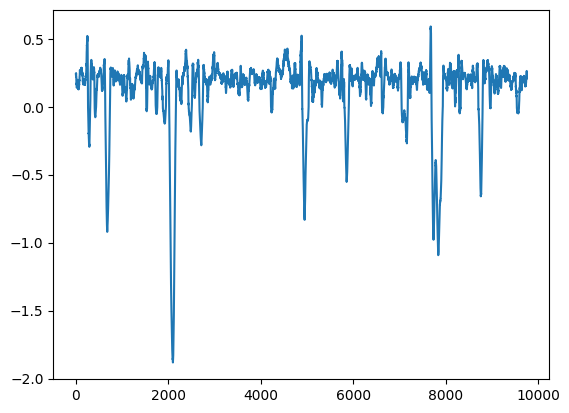

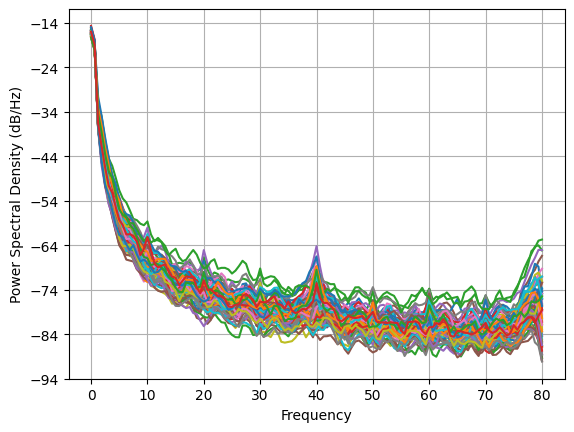

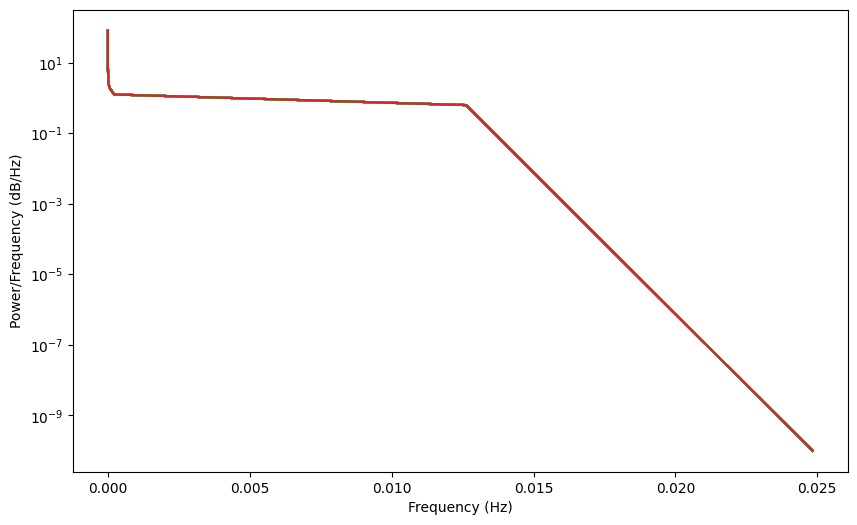

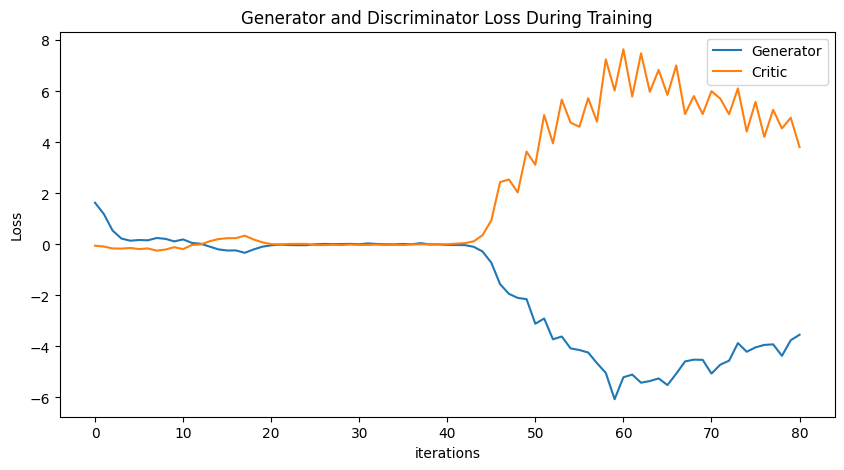

Epoch 90: Critic error ([1.636278151395983, 1.1947108601513445, 0.5434537618838005, 0.23142265965301617, 0.1462193022393507, 0.17330517174553406, 0.16192031070854987, 0.2527828492233176, 0.2197818277100378, 0.11971180863426013, 0.1971996026641597, 0.06117138311550831, 0.025349378758604685, -0.08202754433209809, -0.1928547627639595, -0.2373398493494254, -0.23425874625625237, -0.3277584562807632, -0.19742671011302848, -0.087781553266025, -0.03426589363882725, -0.006618189659084048, -0.023768207371601822, -0.028378969235561904, -0.030234403062791747, 0.004775354510752592, 0.0202438843573789, 0.010956926992496313, 0.01588185960805943, 0.02260131409610358, 0.006961745523198375, 0.04088967060993866, 0.017576041797328933, 0.006313061585676863, 0.004936332911810504, 0.018454398254612155, 0.007874622525865724, 0.05198970802316713, -0.001633974363779933, 0.004348593992298713, -0.019695922458298668, -0.02231048417010925, -0.02628835520964641, -0.09277215233700142, -0.2750375842470049, -0.71419183

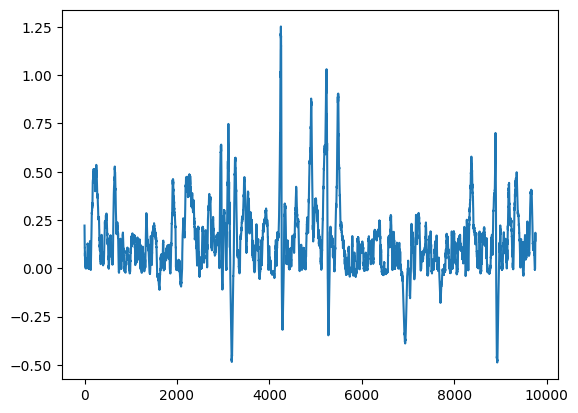

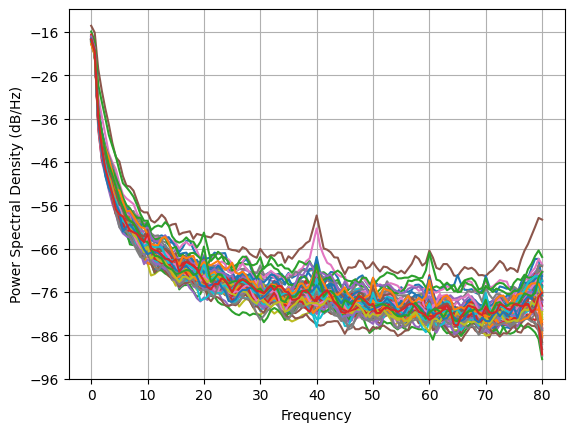

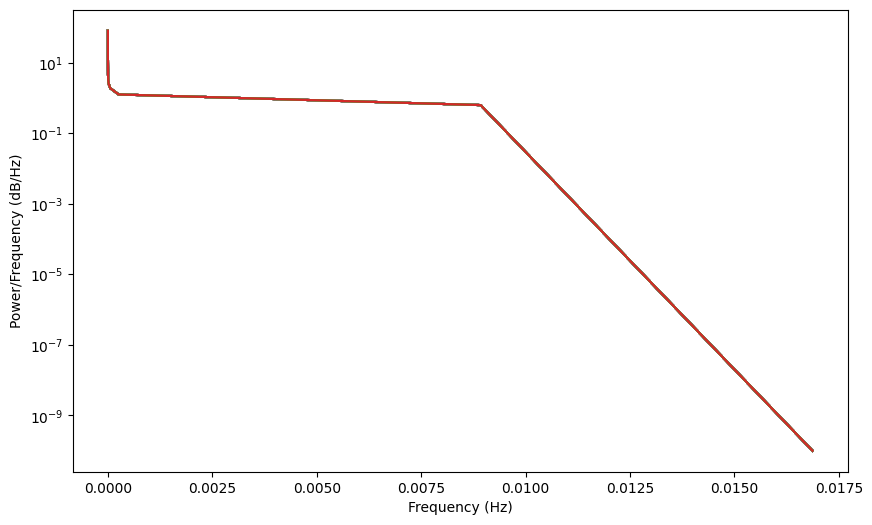

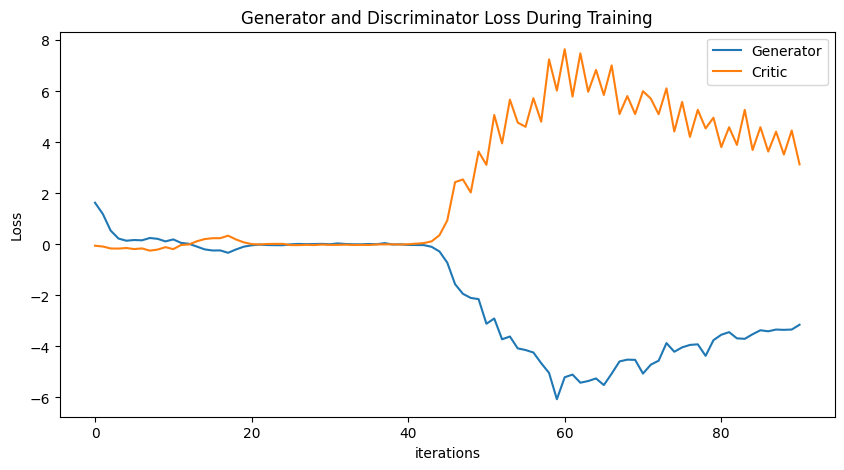

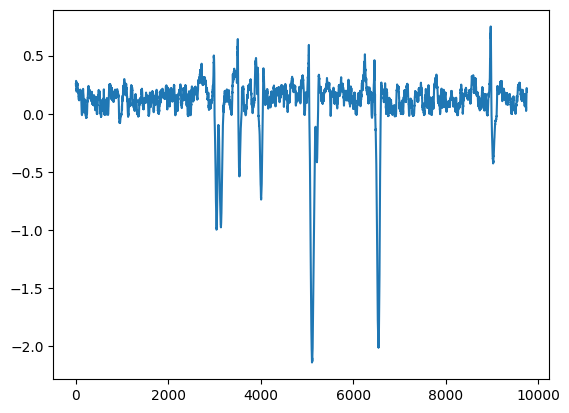

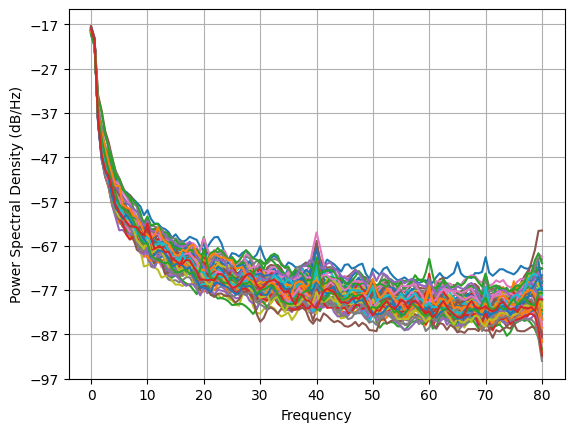

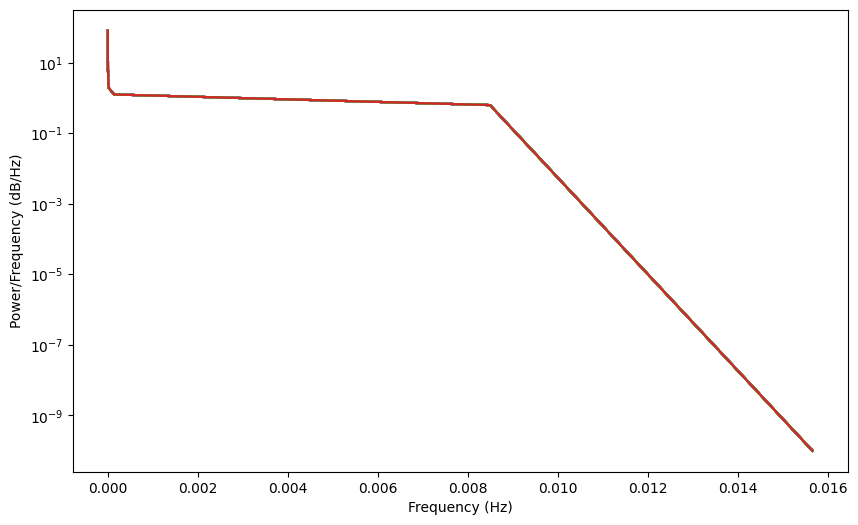

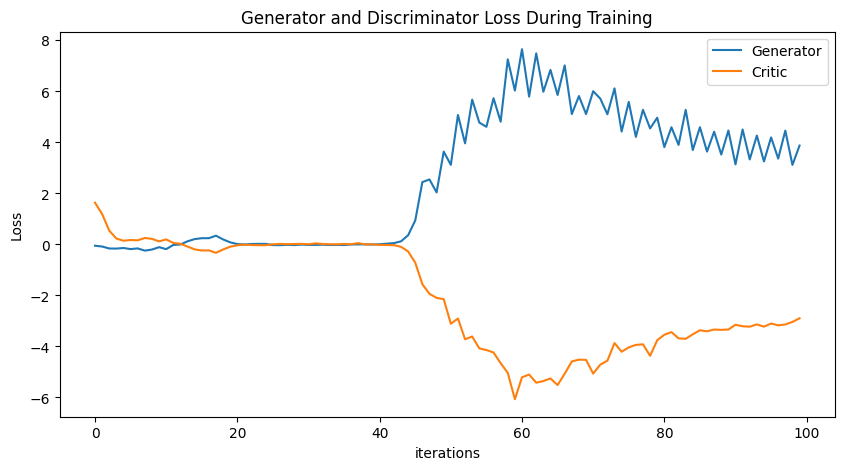

In [12]:
NUM_EPOCHS = 100
PRINT_INTERVAL = 10
BATCH_SIZE = np.shape(training_data_closed)[0]
training_data = torch.tensor(training_data_closed)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
            fake = G(noise)
            critic_real = D(real).reshape(-1)
            critic_fake = D(fake).reshape(-1)
            gp = gradient_penalty(D, real, fake)
            critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            D.zero_grad()
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()
            critic_optimizer.zero_grad()

        generated_data = fake
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        gen_optimizer.zero_grad()

        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_norm_closed_same, disc, gen = train()

torch.save(gen, 'generator_FINAL_norm_closed.pt')
torch.save(disc, 'discriminator_FINAL_norm_closed.pt')

plot_everything(generated_data_norm_closed_same, gen_err, critic_err)

Epoch 0: Critic error ([2.601824243096349]) Generator err ([-0.062410060316324234])


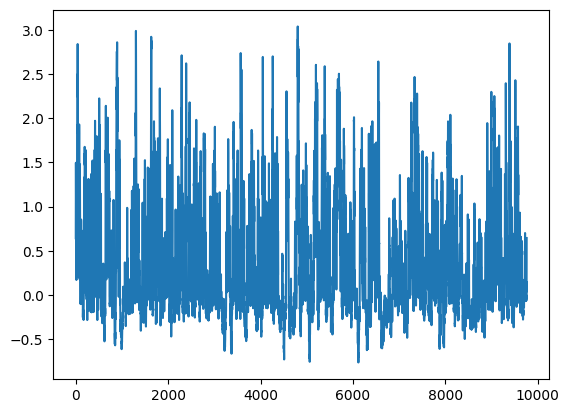

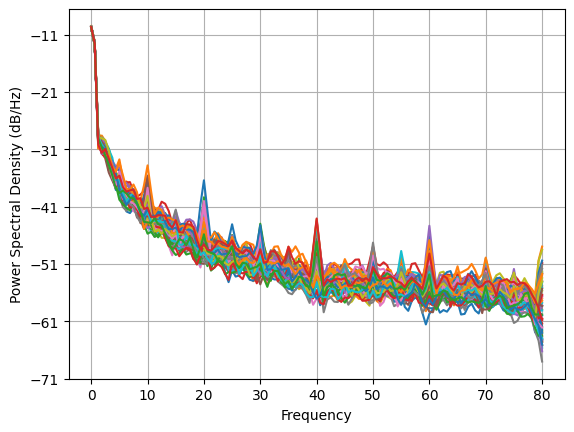

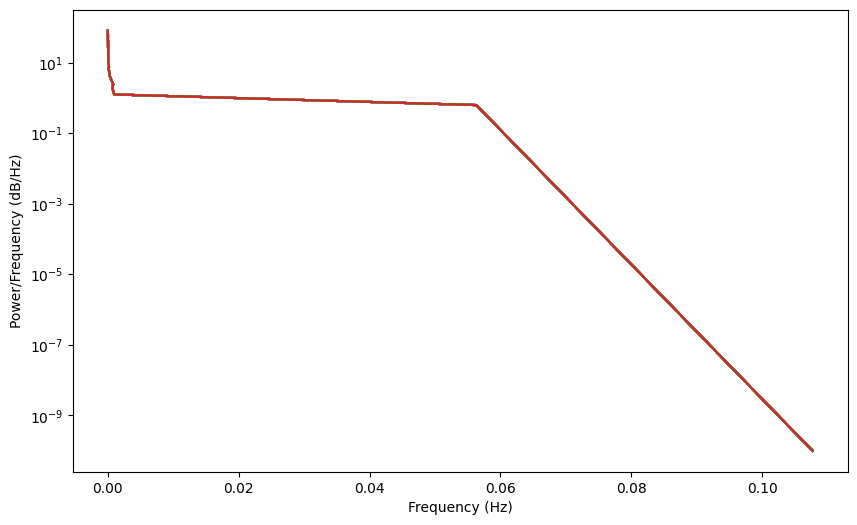

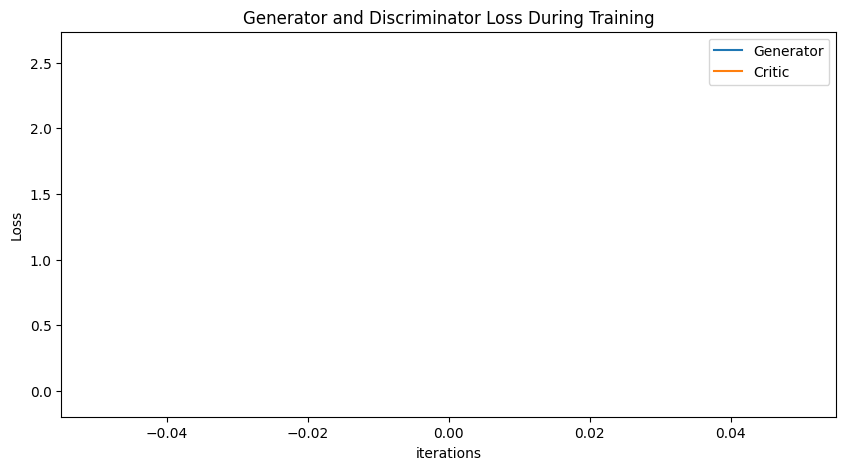

Epoch 10: Critic error ([2.601824243096349, 1.429257581771782, 0.23432020216051835, 0.002553143868025104, -0.01932095950344163, -0.13198360395965253, -0.02703649377801622, -0.019515158916576722, 0.008446174165821337, 0.008997251957424658, 0.008958115654778429]) Generator err ([-0.062410060316324234, -0.07129694521427155, -0.08476918190717697, 0.031453829258680344, 0.0019269426120445132, 0.11212687939405441, -0.003239814890548587, 0.004125459585338831, -0.028122039511799812, -0.028267813846468925, -0.012927348725497723])


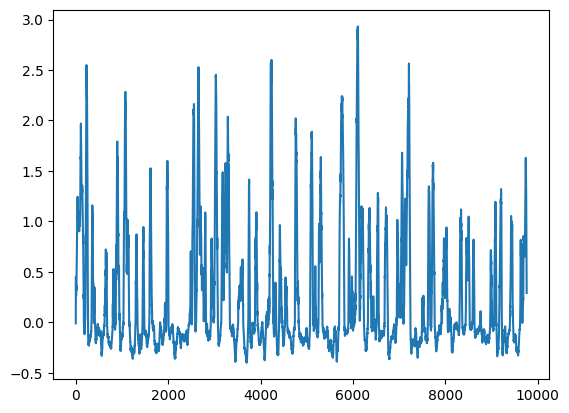

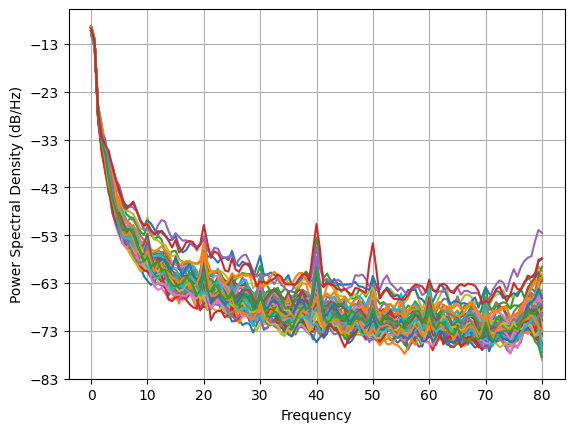

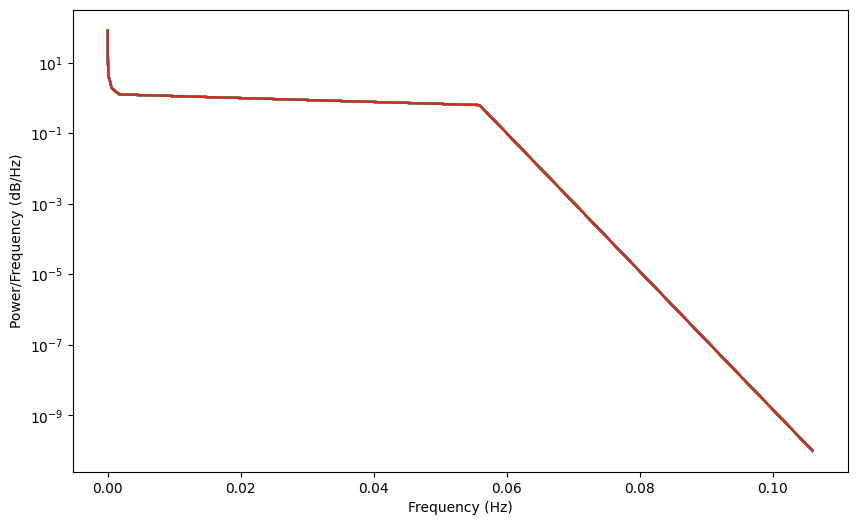

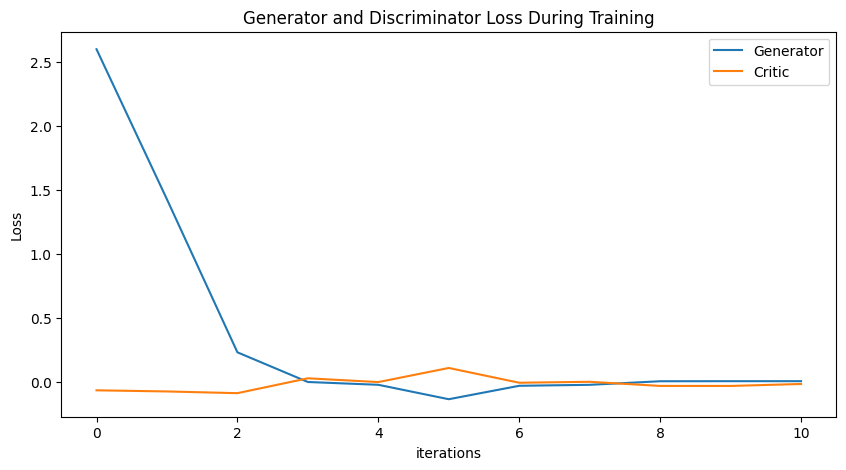

Epoch 20: Critic error ([2.601824243096349, 1.429257581771782, 0.23432020216051835, 0.002553143868025104, -0.01932095950344163, -0.13198360395965253, -0.02703649377801622, -0.019515158916576722, 0.008446174165821337, 0.008997251957424658, 0.008958115654778429, 0.03356769266670942, 0.048812167621713615, 0.036740687933591684, 0.05648696690055257, 0.0418626441387608, 0.039698435592161706, 0.04959979195675754, 0.054463506321548075, 0.04224011448125572, 0.05367068773648716]) Generator err ([-0.062410060316324234, -0.07129694521427155, -0.08476918190717697, 0.031453829258680344, 0.0019269426120445132, 0.11212687939405441, -0.003239814890548587, 0.004125459585338831, -0.028122039511799812, -0.028267813846468925, -0.012927348725497723, -0.052005376666784286, -0.0521496906876564, -0.04385383427143097, -0.05016288906335831, -0.05381392687559128, -0.04764646664261818, -0.048282887786626816, -0.04296637326478958, -0.0383230522274971, -0.028605228289961815])


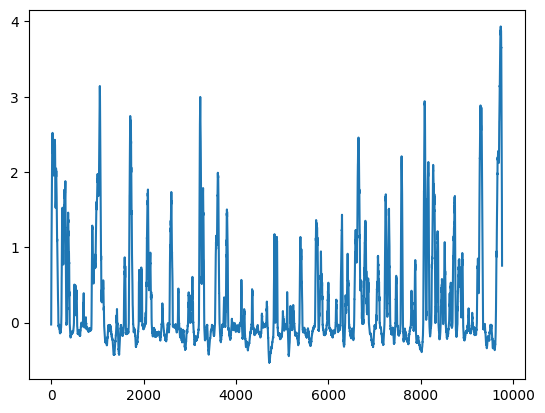

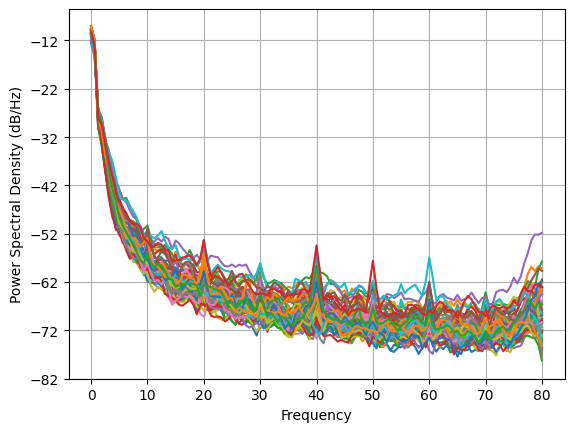

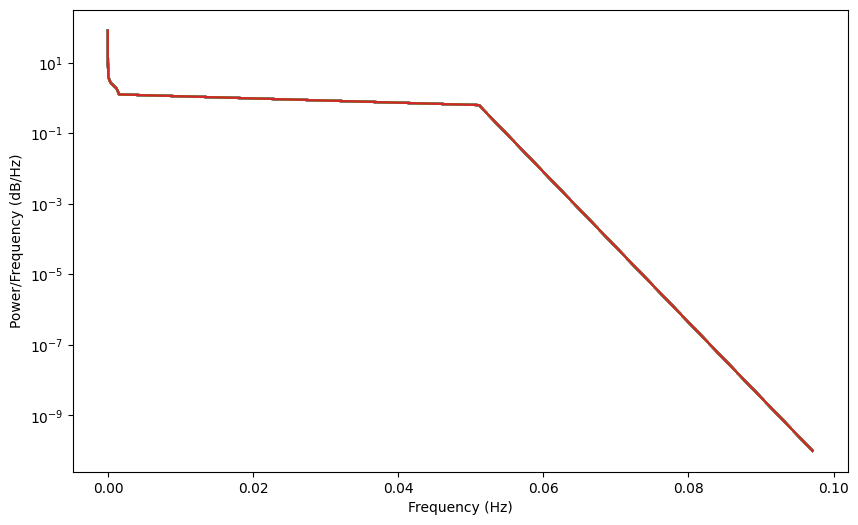

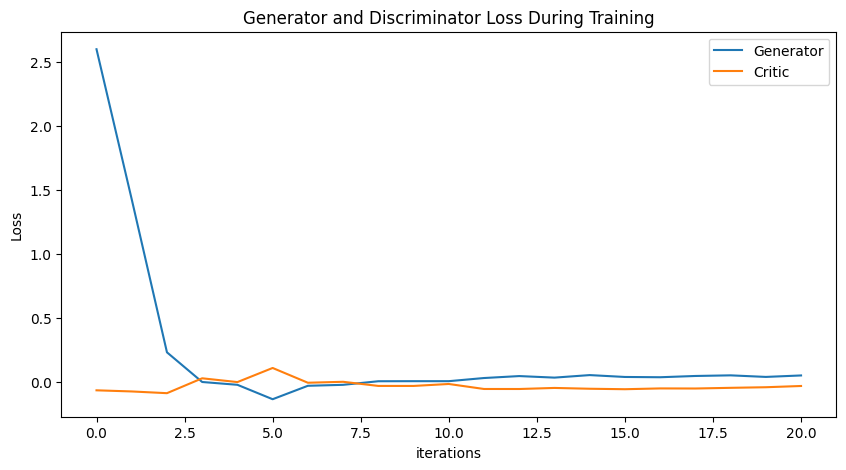

Epoch 30: Critic error ([2.601824243096349, 1.429257581771782, 0.23432020216051835, 0.002553143868025104, -0.01932095950344163, -0.13198360395965253, -0.02703649377801622, -0.019515158916576722, 0.008446174165821337, 0.008997251957424658, 0.008958115654778429, 0.03356769266670942, 0.048812167621713615, 0.036740687933591684, 0.05648696690055257, 0.0418626441387608, 0.039698435592161706, 0.04959979195675754, 0.054463506321548075, 0.04224011448125572, 0.05367068773648716, 0.014133231842159408, 0.036230704217854875, -0.01754068133310294, -0.040819372379846106, -0.10646436992716868, -0.310337898313355, -0.778413689531969, -1.7362404675125673, -1.836542623753082, -3.289635569205639]) Generator err ([-0.062410060316324234, -0.07129694521427155, -0.08476918190717697, 0.031453829258680344, 0.0019269426120445132, 0.11212687939405441, -0.003239814890548587, 0.004125459585338831, -0.028122039511799812, -0.028267813846468925, -0.012927348725497723, -0.052005376666784286, -0.0521496906876564, -0.043

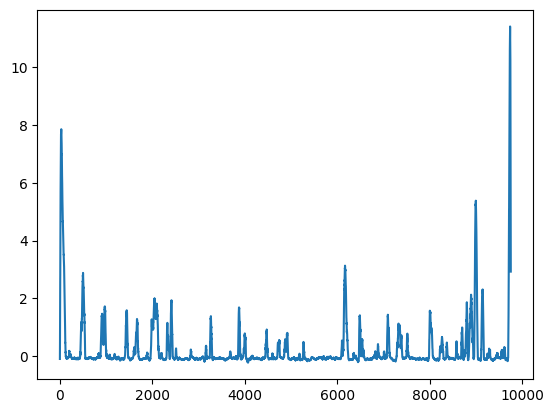

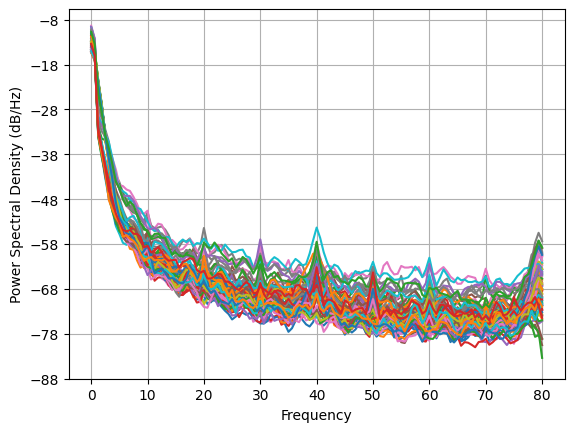

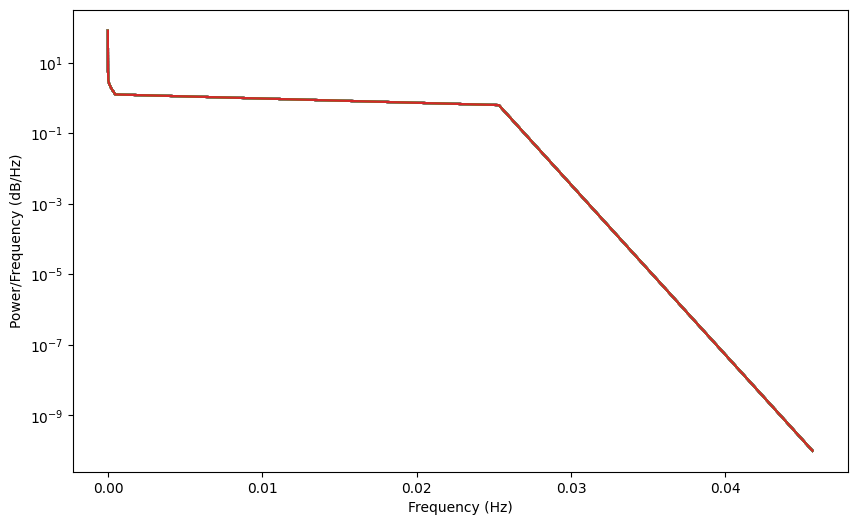

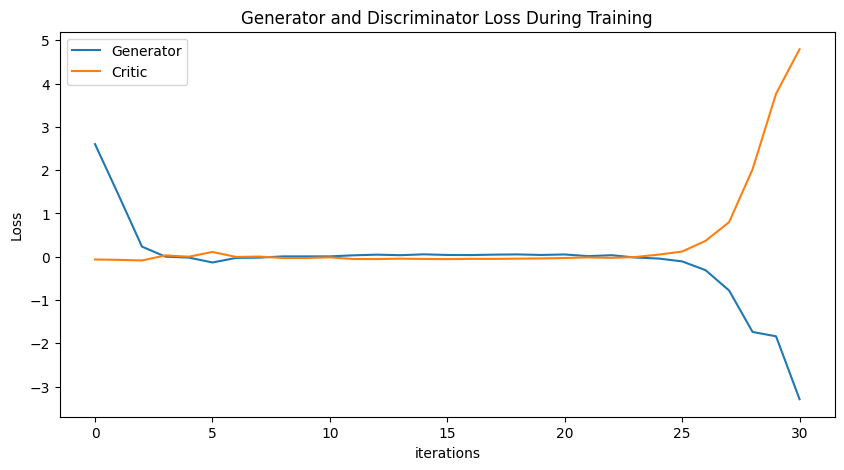

Epoch 40: Critic error ([2.601824243096349, 1.429257581771782, 0.23432020216051835, 0.002553143868025104, -0.01932095950344163, -0.13198360395965253, -0.02703649377801622, -0.019515158916576722, 0.008446174165821337, 0.008997251957424658, 0.008958115654778429, 0.03356769266670942, 0.048812167621713615, 0.036740687933591684, 0.05648696690055257, 0.0418626441387608, 0.039698435592161706, 0.04959979195675754, 0.054463506321548075, 0.04224011448125572, 0.05367068773648716, 0.014133231842159408, 0.036230704217854875, -0.01754068133310294, -0.040819372379846106, -0.10646436992716868, -0.310337898313355, -0.778413689531969, -1.7362404675125673, -1.836542623753082, -3.289635569205639, -2.957443350733873, -2.8444280100731425, -3.5040017909210226, -3.4484114297210566, -3.943560898555949, -2.7155978066326063, -2.405688205899944, -2.0909007451390407, -2.0812811076162645, -2.2544822189088674]) Generator err ([-0.062410060316324234, -0.07129694521427155, -0.08476918190717697, 0.031453829258680344, 0

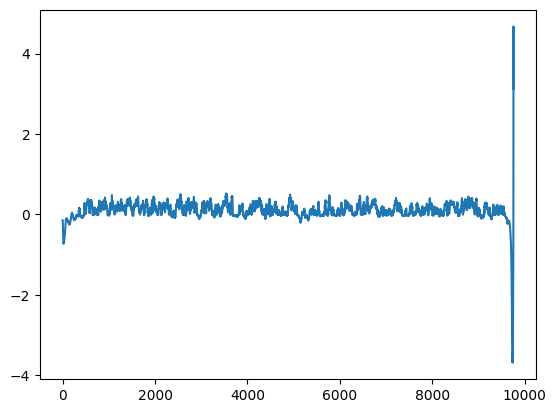

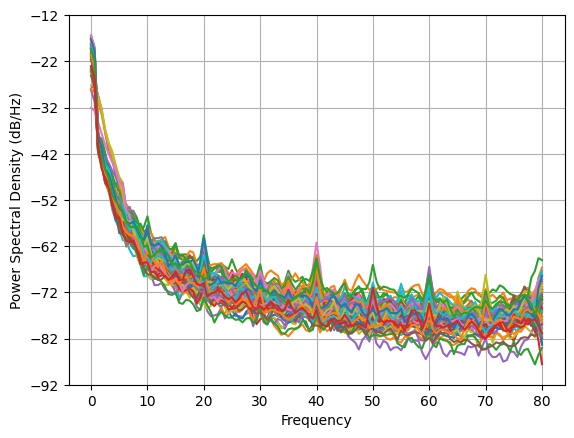

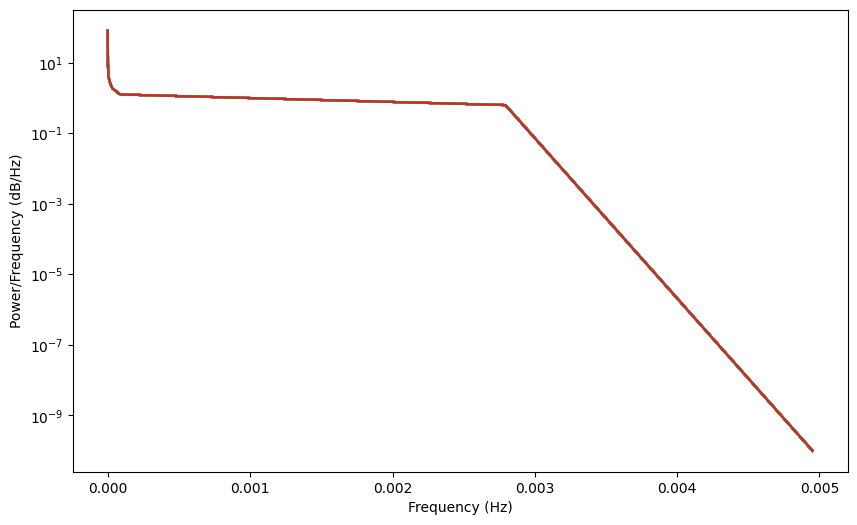

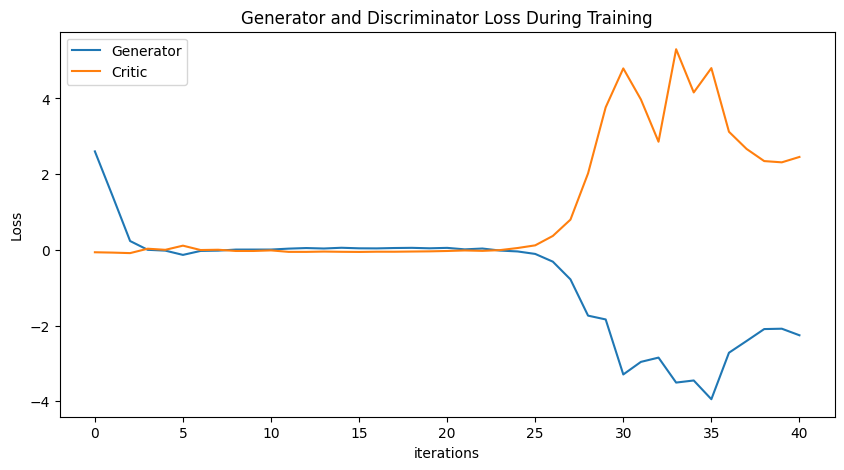

Epoch 50: Critic error ([2.601824243096349, 1.429257581771782, 0.23432020216051835, 0.002553143868025104, -0.01932095950344163, -0.13198360395965253, -0.02703649377801622, -0.019515158916576722, 0.008446174165821337, 0.008997251957424658, 0.008958115654778429, 0.03356769266670942, 0.048812167621713615, 0.036740687933591684, 0.05648696690055257, 0.0418626441387608, 0.039698435592161706, 0.04959979195675754, 0.054463506321548075, 0.04224011448125572, 0.05367068773648716, 0.014133231842159408, 0.036230704217854875, -0.01754068133310294, -0.040819372379846106, -0.10646436992716868, -0.310337898313355, -0.778413689531969, -1.7362404675125673, -1.836542623753082, -3.289635569205639, -2.957443350733873, -2.8444280100731425, -3.5040017909210226, -3.4484114297210566, -3.943560898555949, -2.7155978066326063, -2.405688205899944, -2.0909007451390407, -2.0812811076162645, -2.2544822189088674, -2.2364624233376795, -2.344530437730635, -2.330786833677367, -2.2414791251441724, -2.3039230001471247, -2.2

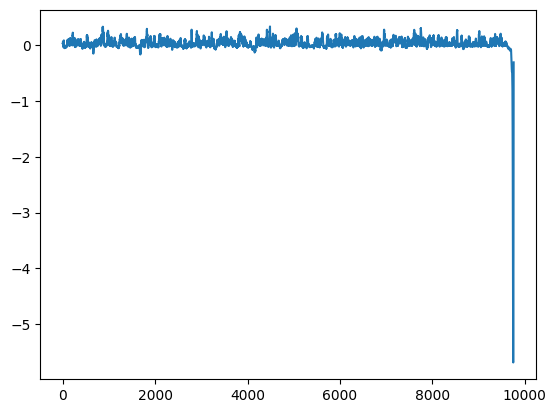

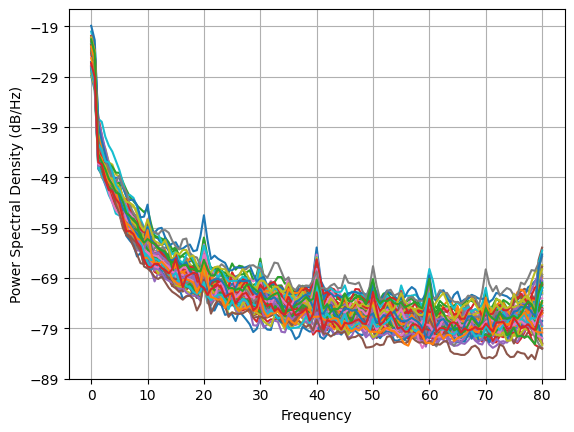

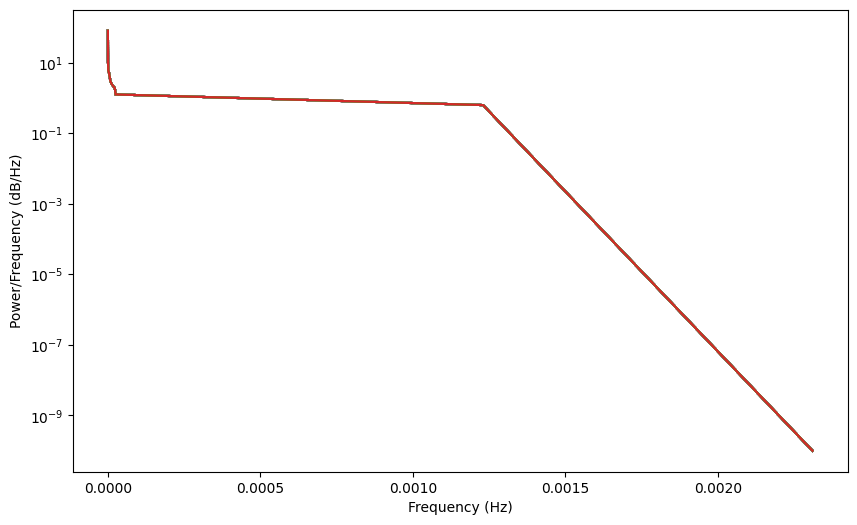

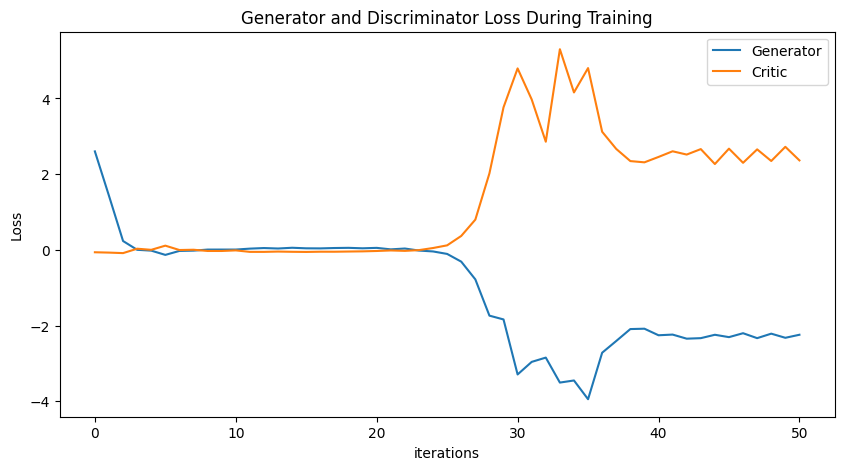

Epoch 60: Critic error ([2.601824243096349, 1.429257581771782, 0.23432020216051835, 0.002553143868025104, -0.01932095950344163, -0.13198360395965253, -0.02703649377801622, -0.019515158916576722, 0.008446174165821337, 0.008997251957424658, 0.008958115654778429, 0.03356769266670942, 0.048812167621713615, 0.036740687933591684, 0.05648696690055257, 0.0418626441387608, 0.039698435592161706, 0.04959979195675754, 0.054463506321548075, 0.04224011448125572, 0.05367068773648716, 0.014133231842159408, 0.036230704217854875, -0.01754068133310294, -0.040819372379846106, -0.10646436992716868, -0.310337898313355, -0.778413689531969, -1.7362404675125673, -1.836542623753082, -3.289635569205639, -2.957443350733873, -2.8444280100731425, -3.5040017909210226, -3.4484114297210566, -3.943560898555949, -2.7155978066326063, -2.405688205899944, -2.0909007451390407, -2.0812811076162645, -2.2544822189088674, -2.2364624233376795, -2.344530437730635, -2.330786833677367, -2.2414791251441724, -2.3039230001471247, -2.2

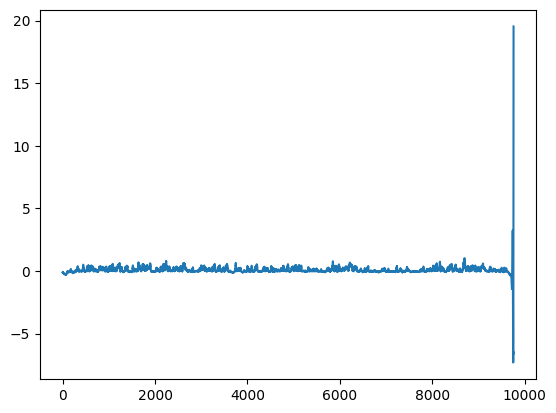

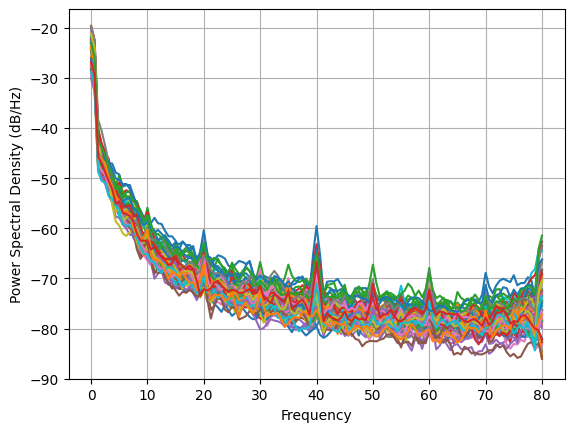

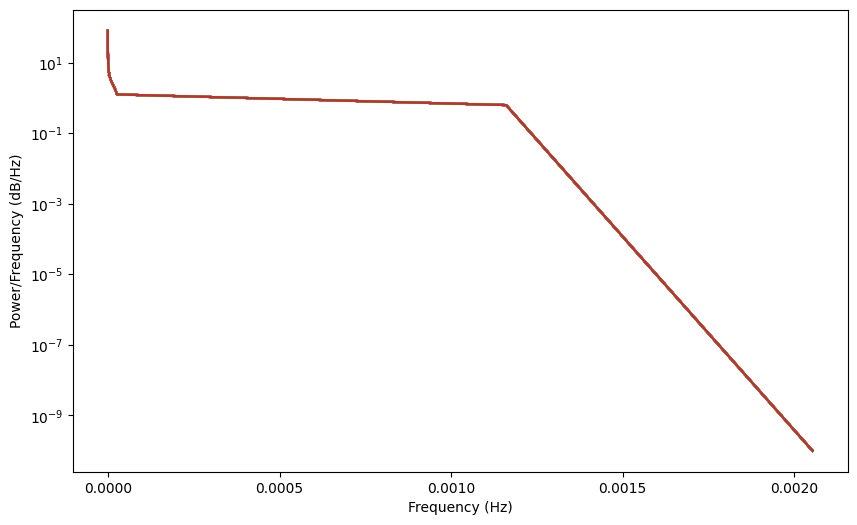

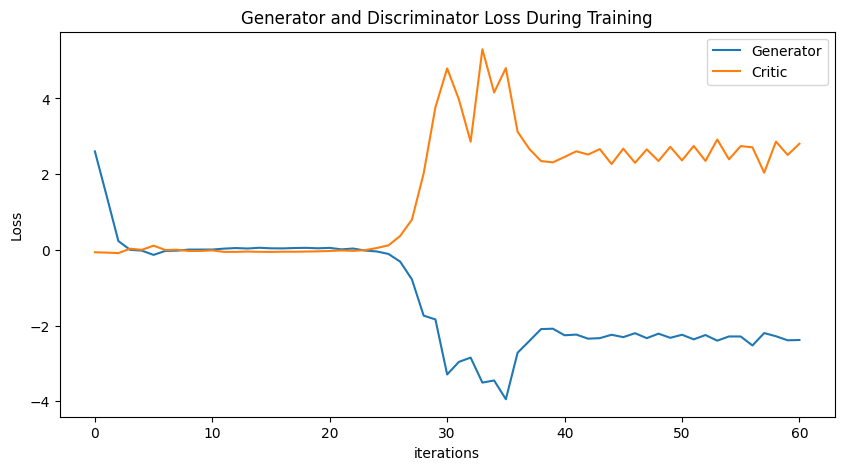

Epoch 70: Critic error ([2.601824243096349, 1.429257581771782, 0.23432020216051835, 0.002553143868025104, -0.01932095950344163, -0.13198360395965253, -0.02703649377801622, -0.019515158916576722, 0.008446174165821337, 0.008997251957424658, 0.008958115654778429, 0.03356769266670942, 0.048812167621713615, 0.036740687933591684, 0.05648696690055257, 0.0418626441387608, 0.039698435592161706, 0.04959979195675754, 0.054463506321548075, 0.04224011448125572, 0.05367068773648716, 0.014133231842159408, 0.036230704217854875, -0.01754068133310294, -0.040819372379846106, -0.10646436992716868, -0.310337898313355, -0.778413689531969, -1.7362404675125673, -1.836542623753082, -3.289635569205639, -2.957443350733873, -2.8444280100731425, -3.5040017909210226, -3.4484114297210566, -3.943560898555949, -2.7155978066326063, -2.405688205899944, -2.0909007451390407, -2.0812811076162645, -2.2544822189088674, -2.2364624233376795, -2.344530437730635, -2.330786833677367, -2.2414791251441724, -2.3039230001471247, -2.2

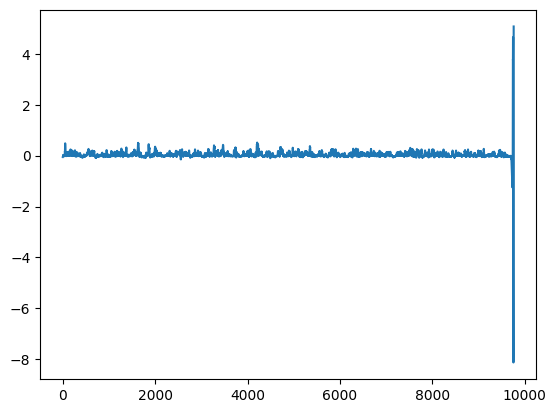

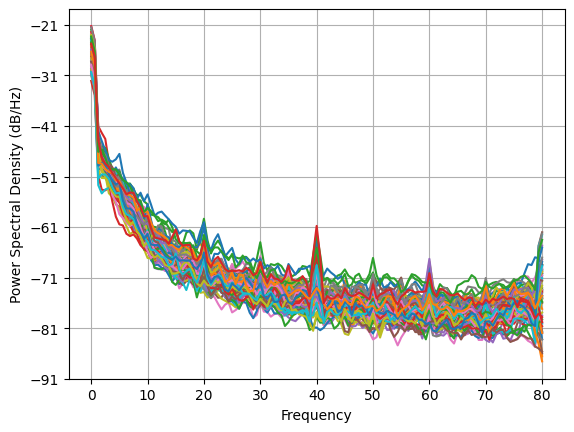

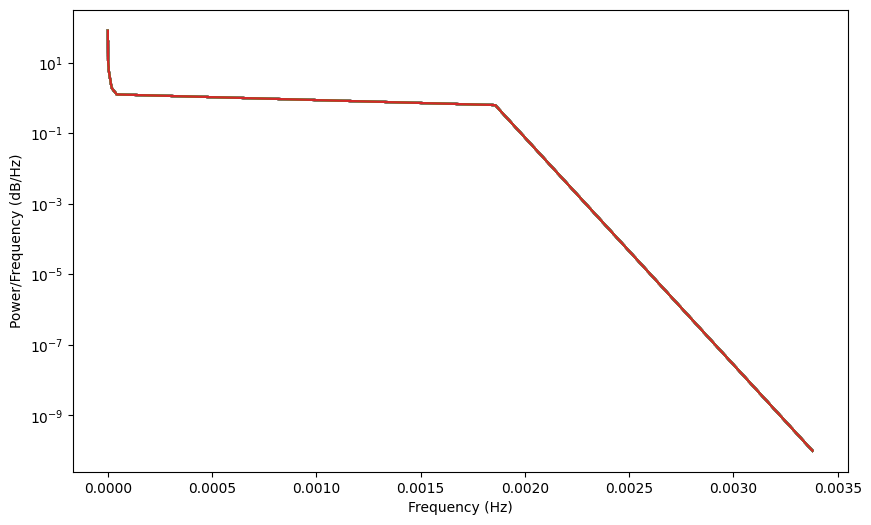

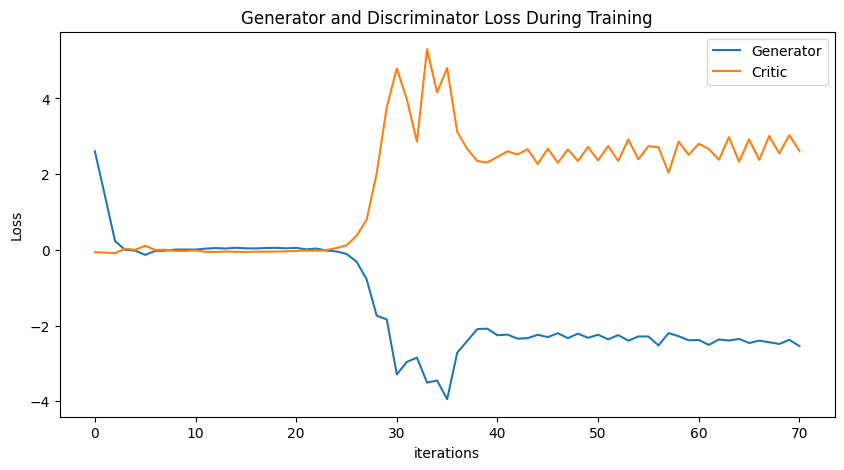

Epoch 80: Critic error ([2.601824243096349, 1.429257581771782, 0.23432020216051835, 0.002553143868025104, -0.01932095950344163, -0.13198360395965253, -0.02703649377801622, -0.019515158916576722, 0.008446174165821337, 0.008997251957424658, 0.008958115654778429, 0.03356769266670942, 0.048812167621713615, 0.036740687933591684, 0.05648696690055257, 0.0418626441387608, 0.039698435592161706, 0.04959979195675754, 0.054463506321548075, 0.04224011448125572, 0.05367068773648716, 0.014133231842159408, 0.036230704217854875, -0.01754068133310294, -0.040819372379846106, -0.10646436992716868, -0.310337898313355, -0.778413689531969, -1.7362404675125673, -1.836542623753082, -3.289635569205639, -2.957443350733873, -2.8444280100731425, -3.5040017909210226, -3.4484114297210566, -3.943560898555949, -2.7155978066326063, -2.405688205899944, -2.0909007451390407, -2.0812811076162645, -2.2544822189088674, -2.2364624233376795, -2.344530437730635, -2.330786833677367, -2.2414791251441724, -2.3039230001471247, -2.2

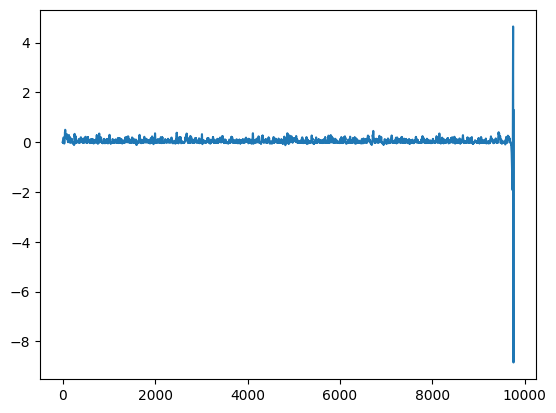

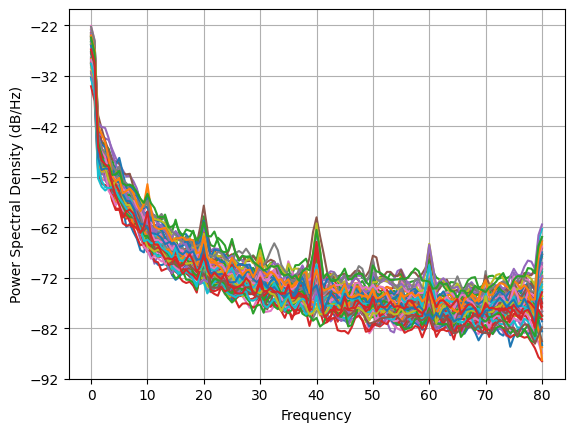

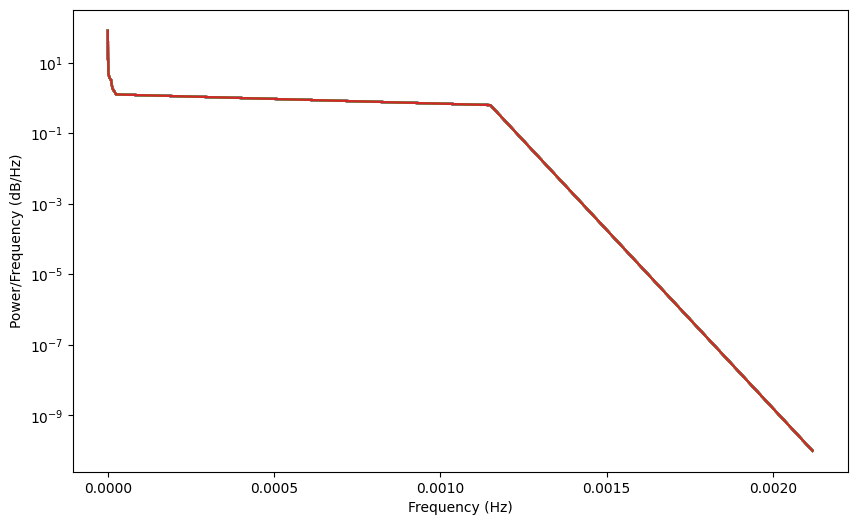

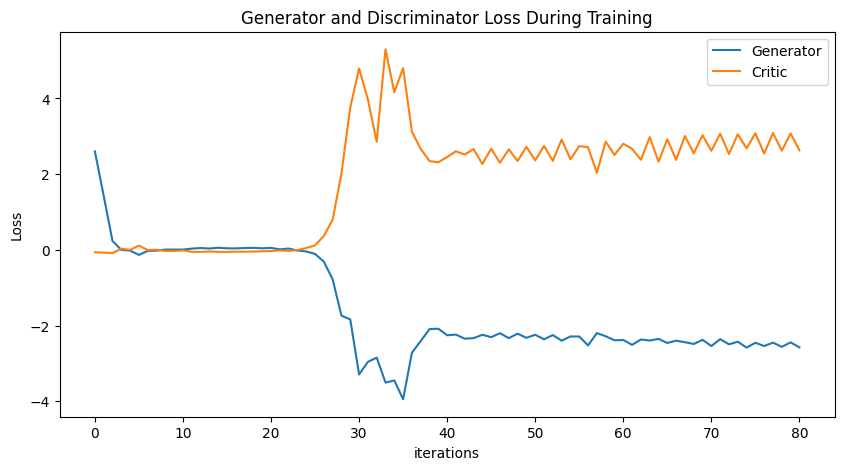

Epoch 90: Critic error ([2.601824243096349, 1.429257581771782, 0.23432020216051835, 0.002553143868025104, -0.01932095950344163, -0.13198360395965253, -0.02703649377801622, -0.019515158916576722, 0.008446174165821337, 0.008997251957424658, 0.008958115654778429, 0.03356769266670942, 0.048812167621713615, 0.036740687933591684, 0.05648696690055257, 0.0418626441387608, 0.039698435592161706, 0.04959979195675754, 0.054463506321548075, 0.04224011448125572, 0.05367068773648716, 0.014133231842159408, 0.036230704217854875, -0.01754068133310294, -0.040819372379846106, -0.10646436992716868, -0.310337898313355, -0.778413689531969, -1.7362404675125673, -1.836542623753082, -3.289635569205639, -2.957443350733873, -2.8444280100731425, -3.5040017909210226, -3.4484114297210566, -3.943560898555949, -2.7155978066326063, -2.405688205899944, -2.0909007451390407, -2.0812811076162645, -2.2544822189088674, -2.2364624233376795, -2.344530437730635, -2.330786833677367, -2.2414791251441724, -2.3039230001471247, -2.2

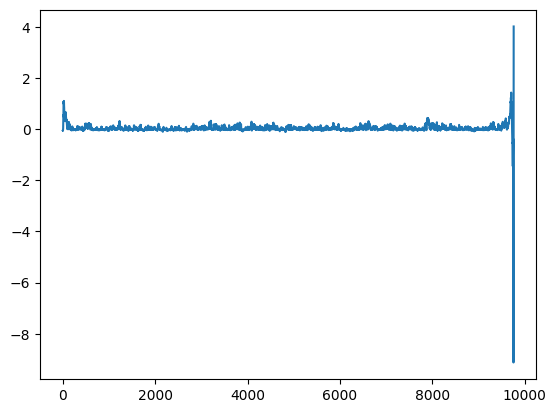

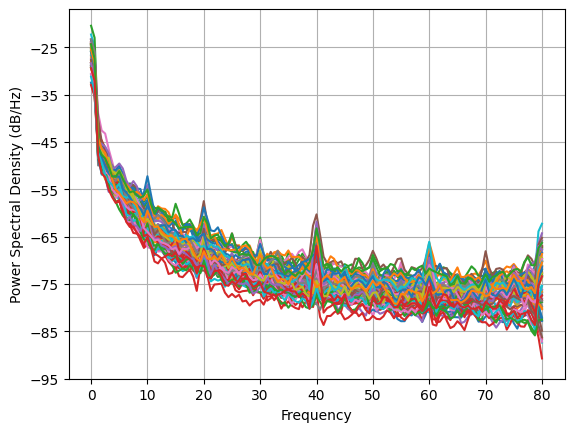

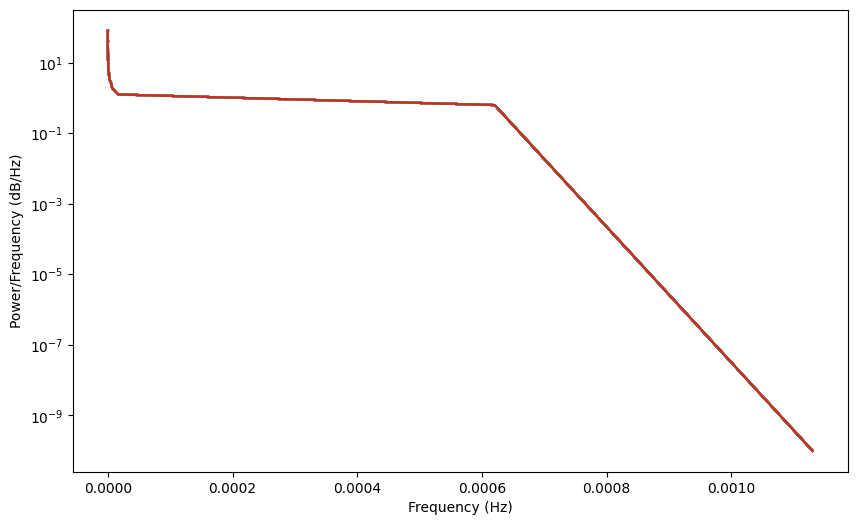

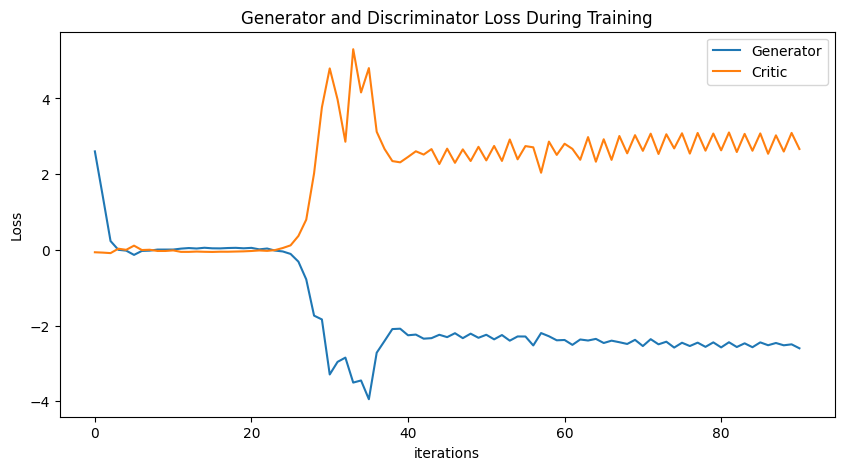

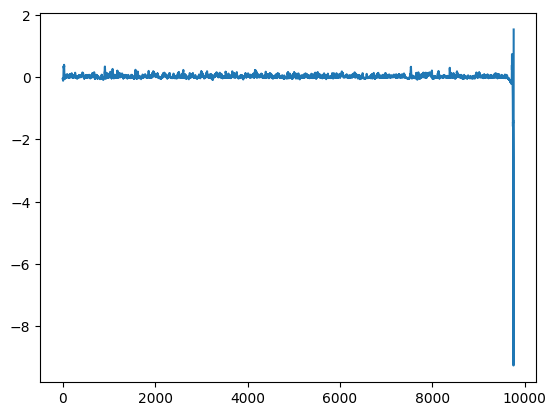

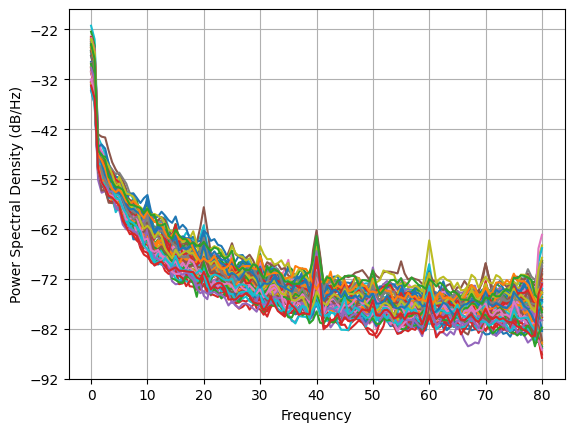

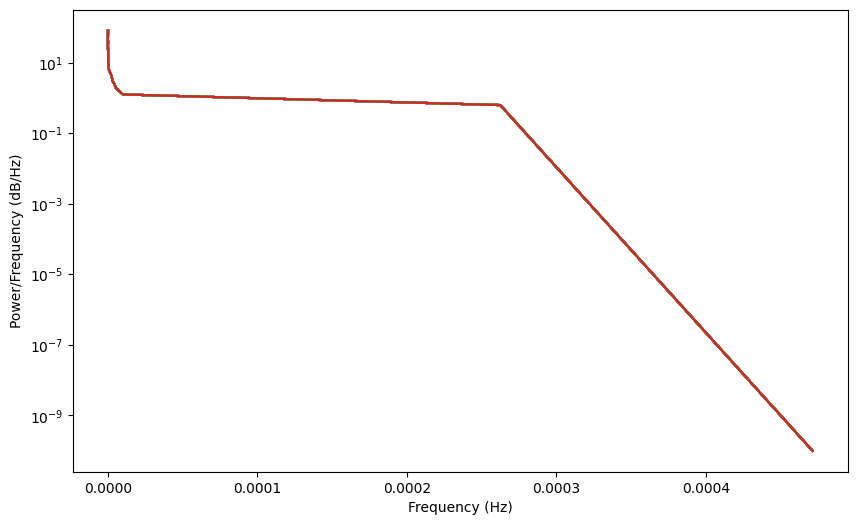

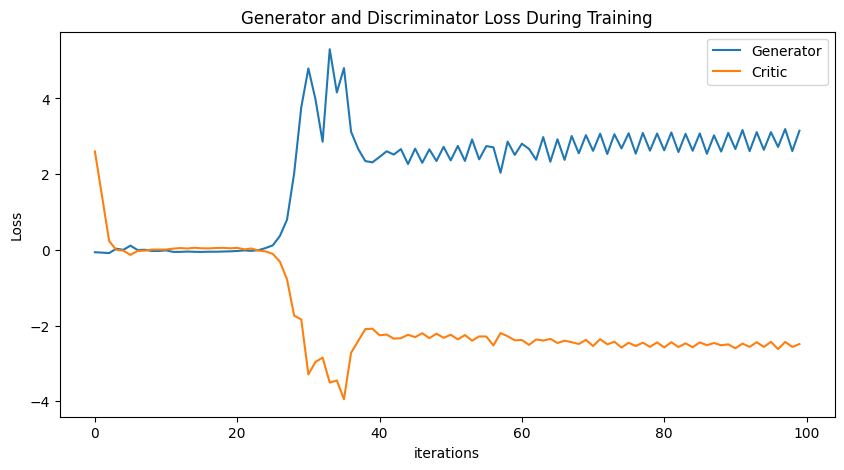

In [13]:
NUM_EPOCHS = 100
PRINT_INTERVAL = 10
BATCH_SIZE = np.shape(training_data_open)[0]
training_data = torch.tensor(training_data_open)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            real = training_data.clone().detach()
            real.requires_grad=True
            noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
            fake = G(noise)
            critic_real = D(real).reshape(-1)
            critic_fake = D(fake).reshape(-1)
            gp = gradient_penalty(D, real, fake)
            critic_loss = -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            D.zero_grad()
            critic_loss.backward(retain_graph=True)
            critic_optimizer.step()
            critic_optimizer.zero_grad()

        generated_data = fake
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        gen_optimizer.zero_grad()

        critic_err.append(critic_loss.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_norm_open_same, disc, gen = train()

torch.save(gen, 'generator_FINAL_norm_open.pt')
torch.save(disc, 'discriminator_FINAL_norm_open.pt')

plot_everything(generated_data_norm_open_same, gen_err, critic_err)

# Final model (tanh, normalized)

Epoch 0: Critic error ([1.7100269664816368]) Generator err ([-0.05441240593791008])


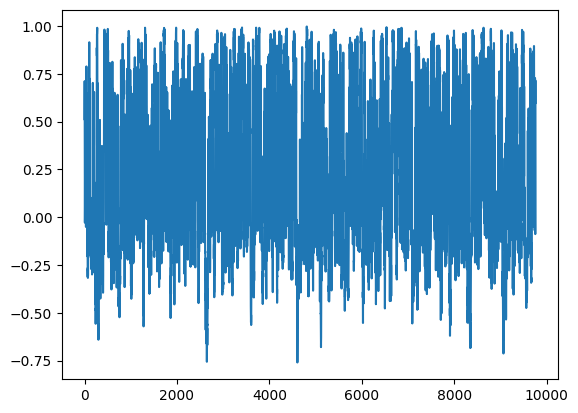

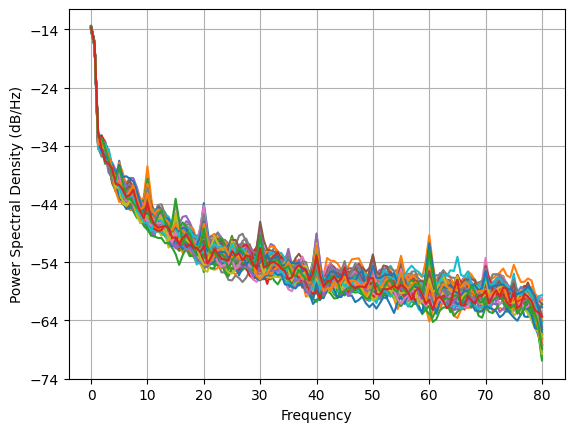

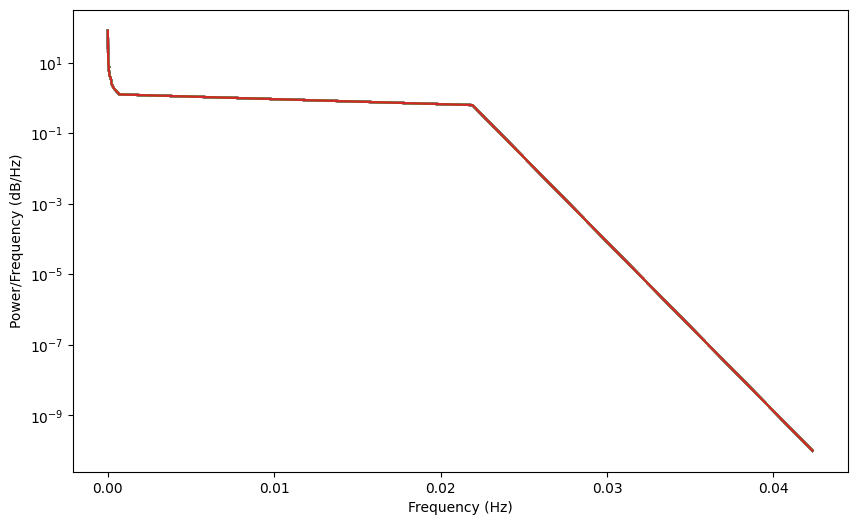

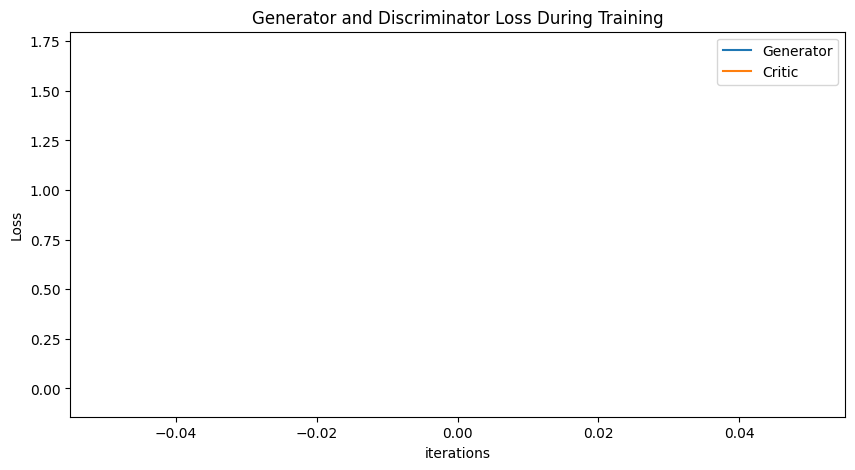

Epoch 10: Critic error ([1.7100269664816368, 0.5929679581922717, 0.062006785393305286, 0.08631061928957326, 0.12582546941375858, 0.11331296911666011, 0.15083048120985026, 0.2832309338527076, 0.3224597973074582, 0.17989877937711884, 0.2646078537183995]) Generator err ([-0.05441240593791008, -0.05020948126912117, -0.05489969253540039, -0.03926147520542145, -0.04664818197488785, -0.03301316872239113, -0.04873239994049072, -0.04955660179257393, -0.048363588750362396, -0.04982369765639305, -0.05479675158858299])


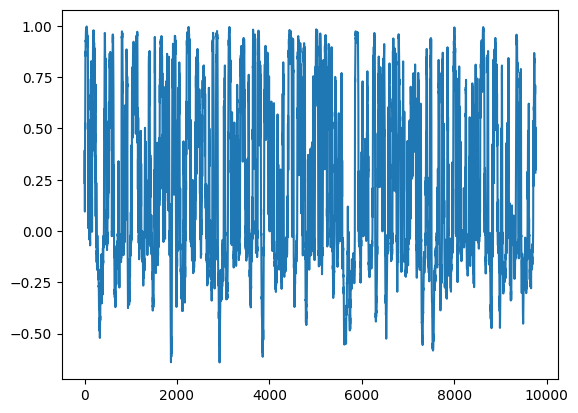

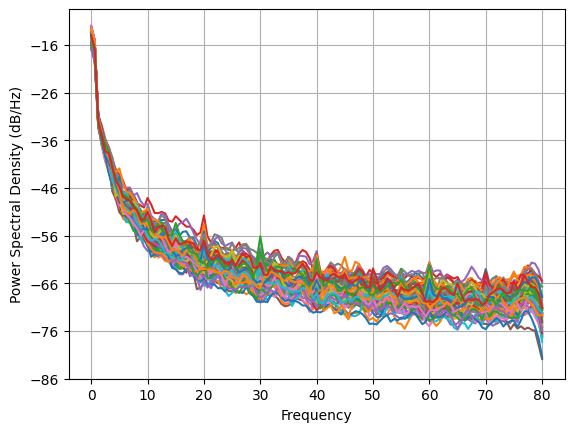

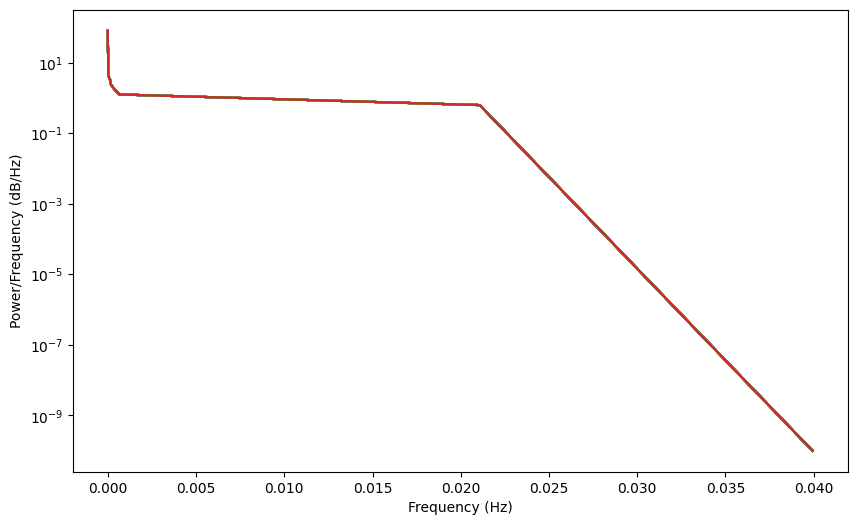

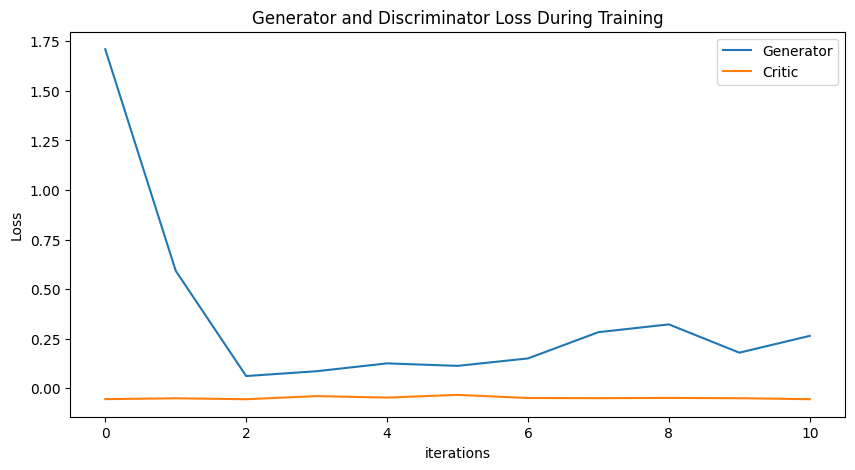

Epoch 20: Critic error ([1.7100269664816368, 0.5929679581922717, 0.062006785393305286, 0.08631061928957326, 0.12582546941375858, 0.11331296911666011, 0.15083048120985026, 0.2832309338527076, 0.3224597973074582, 0.17989877937711884, 0.2646078537183995, 0.15526977909566161, 0.18990873323221, 0.14685462827669427, 0.13668667386800967, 0.1500612636133255, 0.16900307767863926, 0.10300454960788807, 0.07346032282716039, 0.1249353742901469, 0.0789799416284524]) Generator err ([-0.05441240593791008, -0.05020948126912117, -0.05489969253540039, -0.03926147520542145, -0.04664818197488785, -0.03301316872239113, -0.04873239994049072, -0.04955660179257393, -0.048363588750362396, -0.04982369765639305, -0.05479675158858299, -0.052860863506793976, -0.054368168115615845, -0.053824532777071, -0.03326086699962616, -0.04917845502495766, -0.0411762036383152, -0.047163743525743484, -0.034367114305496216, -0.04210831597447395, -0.0481390580534935])


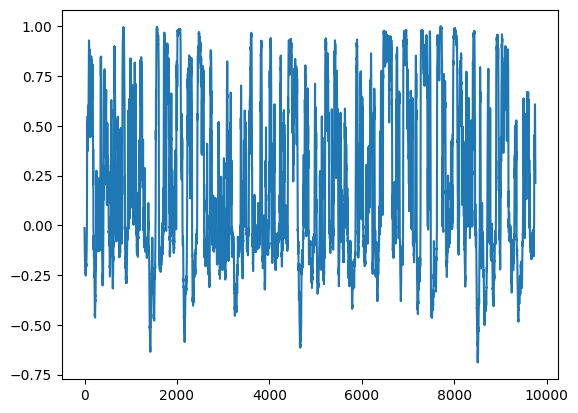

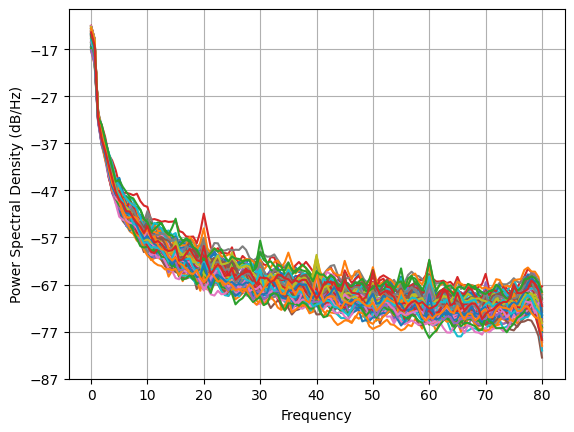

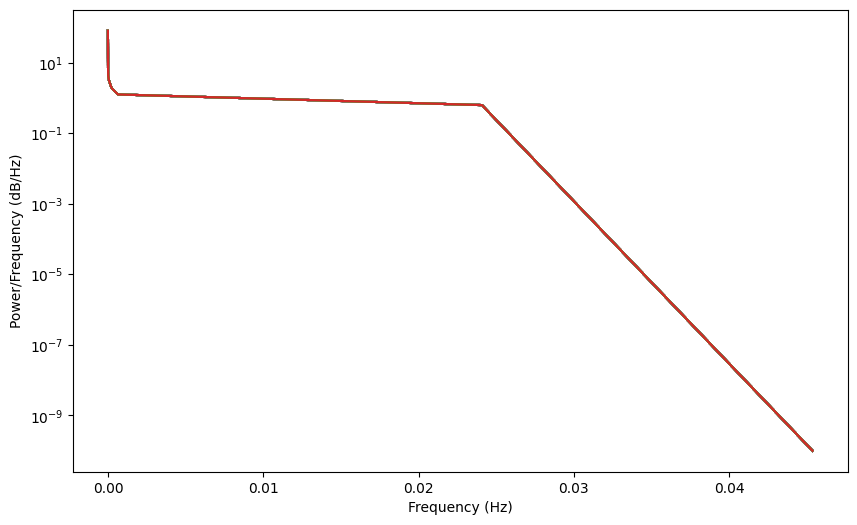

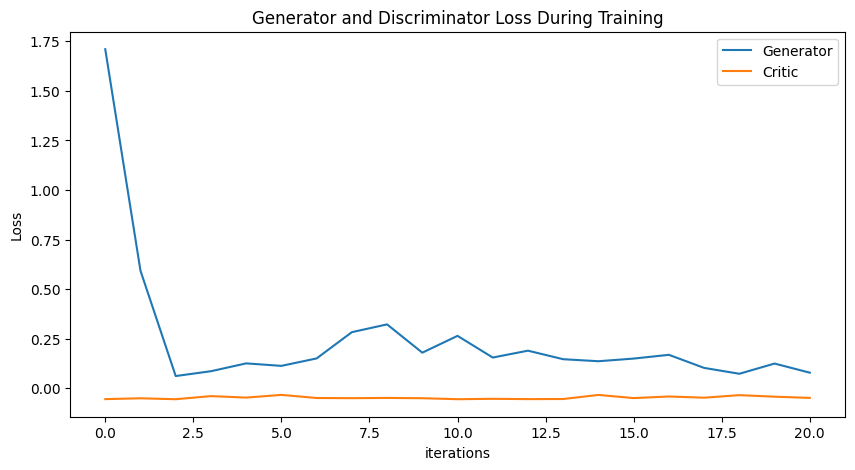

Epoch 30: Critic error ([1.7100269664816368, 0.5929679581922717, 0.062006785393305286, 0.08631061928957326, 0.12582546941375858, 0.11331296911666011, 0.15083048120985026, 0.2832309338527076, 0.3224597973074582, 0.17989877937711884, 0.2646078537183995, 0.15526977909566161, 0.18990873323221, 0.14685462827669427, 0.13668667386800967, 0.1500612636133255, 0.16900307767863926, 0.10300454960788807, 0.07346032282716039, 0.1249353742901469, 0.0789799416284524, 0.07766285682725937, 0.07354528702867699, 0.03651071146560164, 0.07272974023894974, 0.03007252951172182, 0.006449683528760394, 0.019639522774326165, 0.02264032785281414, -0.008660825980371711, 0.0027413019668896255]) Generator err ([-0.05441240593791008, -0.05020948126912117, -0.05489969253540039, -0.03926147520542145, -0.04664818197488785, -0.03301316872239113, -0.04873239994049072, -0.04955660179257393, -0.048363588750362396, -0.04982369765639305, -0.05479675158858299, -0.052860863506793976, -0.054368168115615845, -0.053824532777071, -0

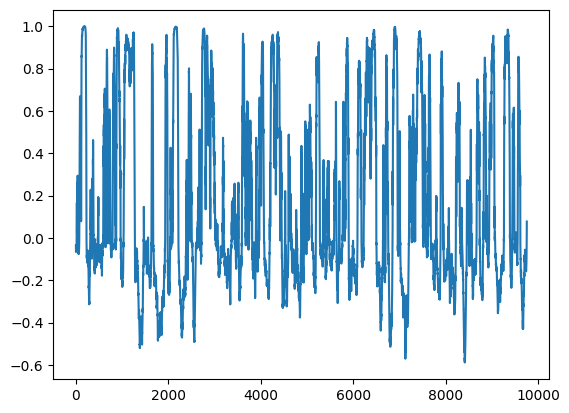

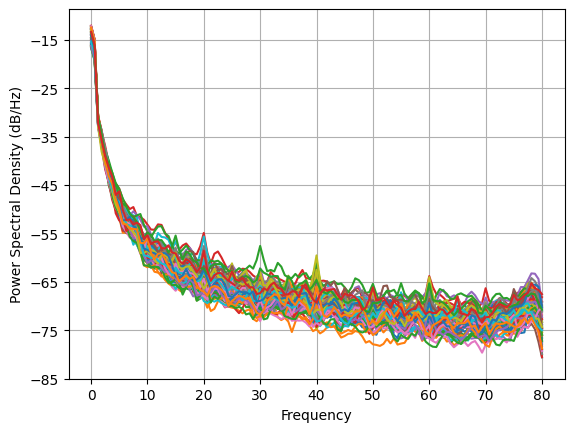

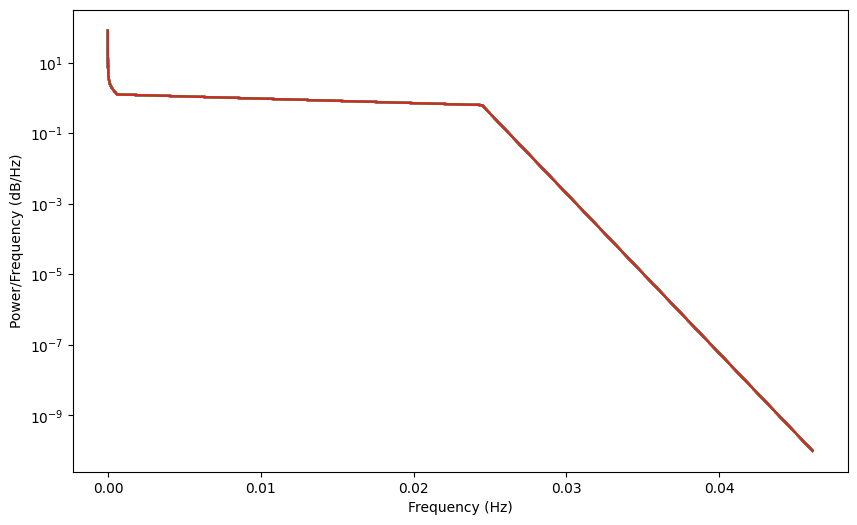

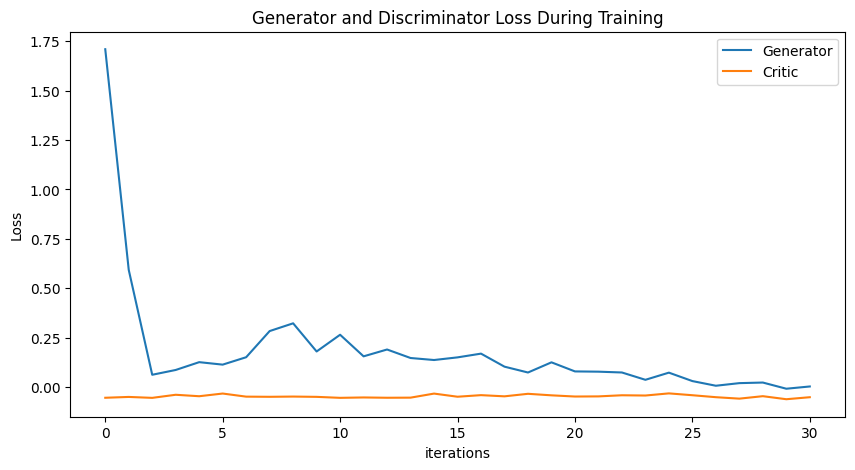

Epoch 40: Critic error ([1.7100269664816368, 0.5929679581922717, 0.062006785393305286, 0.08631061928957326, 0.12582546941375858, 0.11331296911666011, 0.15083048120985026, 0.2832309338527076, 0.3224597973074582, 0.17989877937711884, 0.2646078537183995, 0.15526977909566161, 0.18990873323221, 0.14685462827669427, 0.13668667386800967, 0.1500612636133255, 0.16900307767863926, 0.10300454960788807, 0.07346032282716039, 0.1249353742901469, 0.0789799416284524, 0.07766285682725937, 0.07354528702867699, 0.03651071146560164, 0.07272974023894974, 0.03007252951172182, 0.006449683528760394, 0.019639522774326165, 0.02264032785281414, -0.008660825980371711, 0.0027413019668896255, -0.0321807417635612, -0.012073397895751792, -0.004785927563765849, -0.04619286558255618, -0.10524880603064524, -0.07896107743672949, -0.09144199598683295, -0.15343358135632798, -0.15975503304530964, -0.2226657960269972]) Generator err ([-0.05441240593791008, -0.05020948126912117, -0.05489969253540039, -0.03926147520542145, -0.

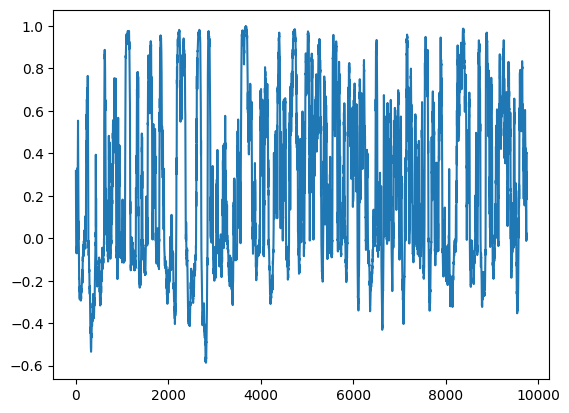

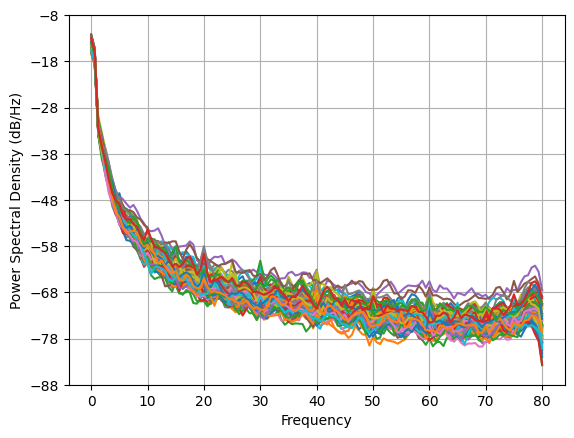

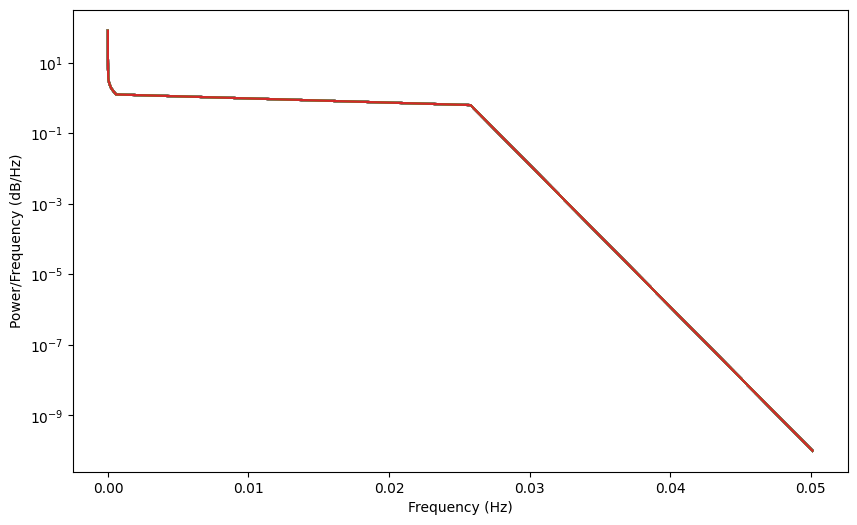

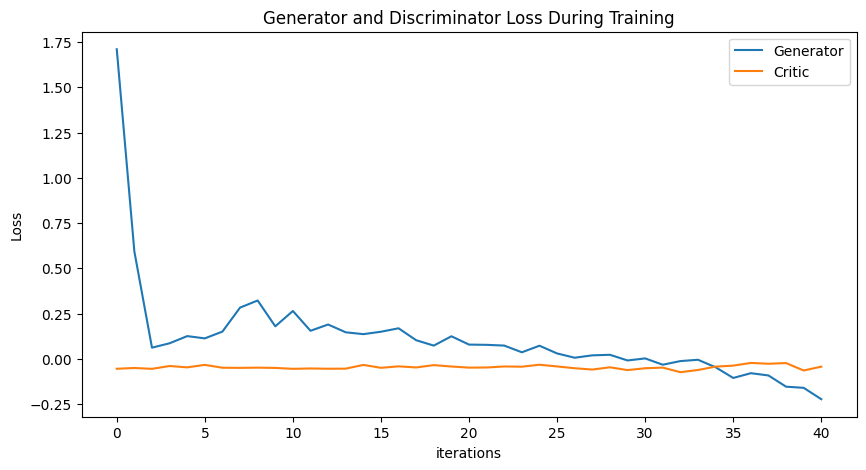

Epoch 50: Critic error ([1.7100269664816368, 0.5929679581922717, 0.062006785393305286, 0.08631061928957326, 0.12582546941375858, 0.11331296911666011, 0.15083048120985026, 0.2832309338527076, 0.3224597973074582, 0.17989877937711884, 0.2646078537183995, 0.15526977909566161, 0.18990873323221, 0.14685462827669427, 0.13668667386800967, 0.1500612636133255, 0.16900307767863926, 0.10300454960788807, 0.07346032282716039, 0.1249353742901469, 0.0789799416284524, 0.07766285682725937, 0.07354528702867699, 0.03651071146560164, 0.07272974023894974, 0.03007252951172182, 0.006449683528760394, 0.019639522774326165, 0.02264032785281414, -0.008660825980371711, 0.0027413019668896255, -0.0321807417635612, -0.012073397895751792, -0.004785927563765849, -0.04619286558255618, -0.10524880603064524, -0.07896107743672949, -0.09144199598683295, -0.15343358135632798, -0.15975503304530964, -0.2226657960269972, -0.2456727821561015, -0.3016170423782287, -0.3643160728109831, -0.460940771048159, -0.5693920978943391, -0.5

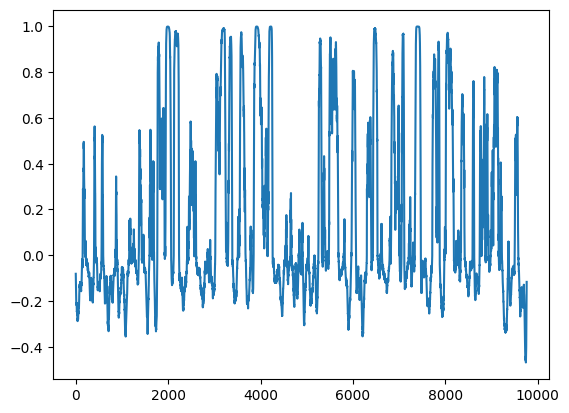

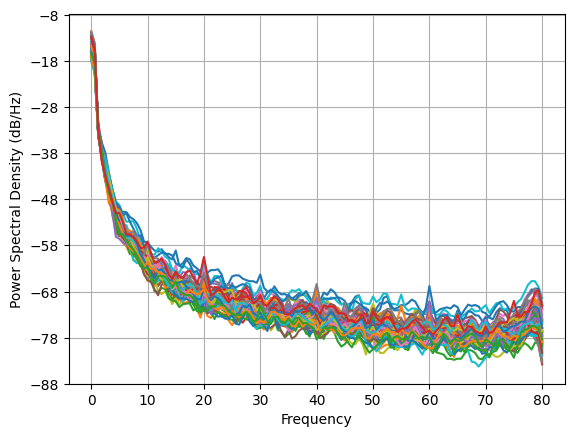

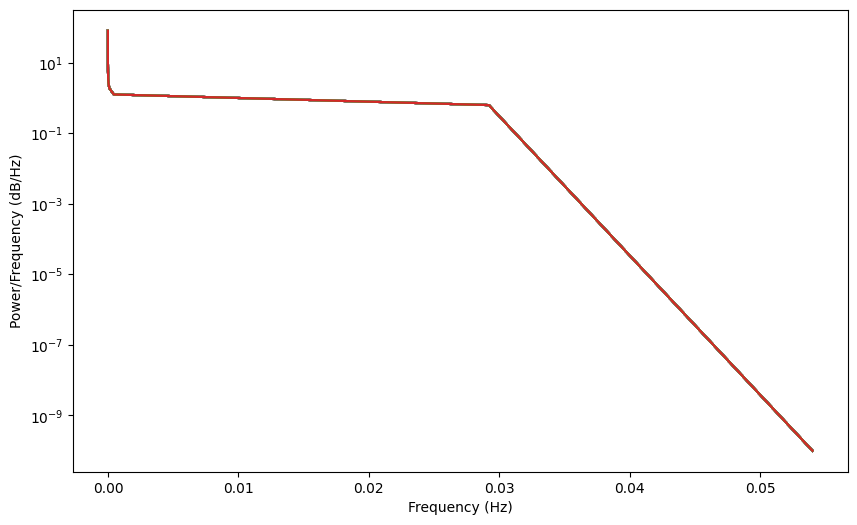

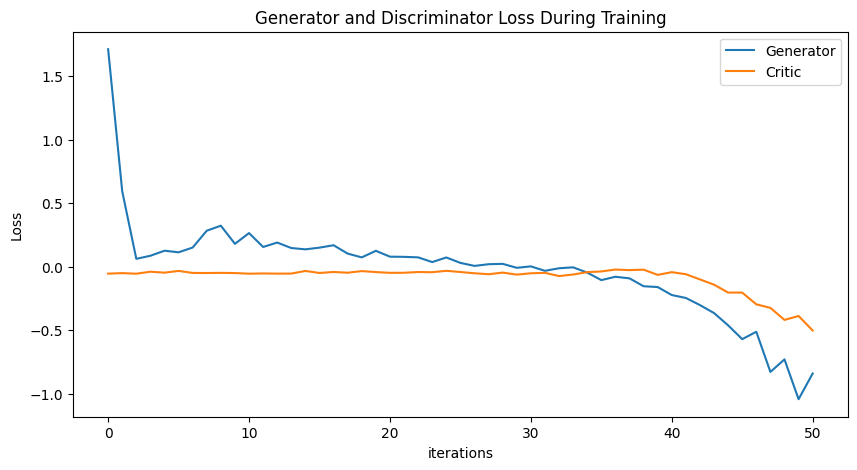

Epoch 60: Critic error ([1.7100269664816368, 0.5929679581922717, 0.062006785393305286, 0.08631061928957326, 0.12582546941375858, 0.11331296911666011, 0.15083048120985026, 0.2832309338527076, 0.3224597973074582, 0.17989877937711884, 0.2646078537183995, 0.15526977909566161, 0.18990873323221, 0.14685462827669427, 0.13668667386800967, 0.1500612636133255, 0.16900307767863926, 0.10300454960788807, 0.07346032282716039, 0.1249353742901469, 0.0789799416284524, 0.07766285682725937, 0.07354528702867699, 0.03651071146560164, 0.07272974023894974, 0.03007252951172182, 0.006449683528760394, 0.019639522774326165, 0.02264032785281414, -0.008660825980371711, 0.0027413019668896255, -0.0321807417635612, -0.012073397895751792, -0.004785927563765849, -0.04619286558255618, -0.10524880603064524, -0.07896107743672949, -0.09144199598683295, -0.15343358135632798, -0.15975503304530964, -0.2226657960269972, -0.2456727821561015, -0.3016170423782287, -0.3643160728109831, -0.460940771048159, -0.5693920978943391, -0.5

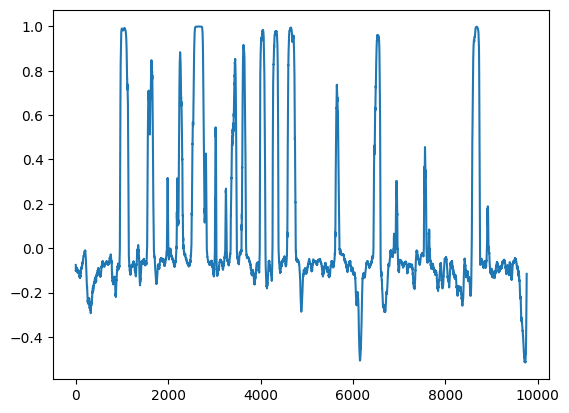

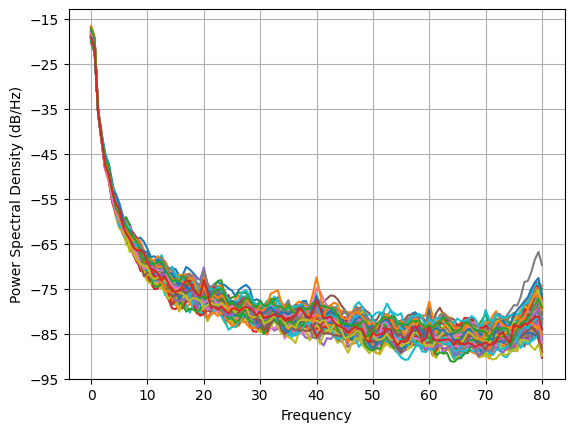

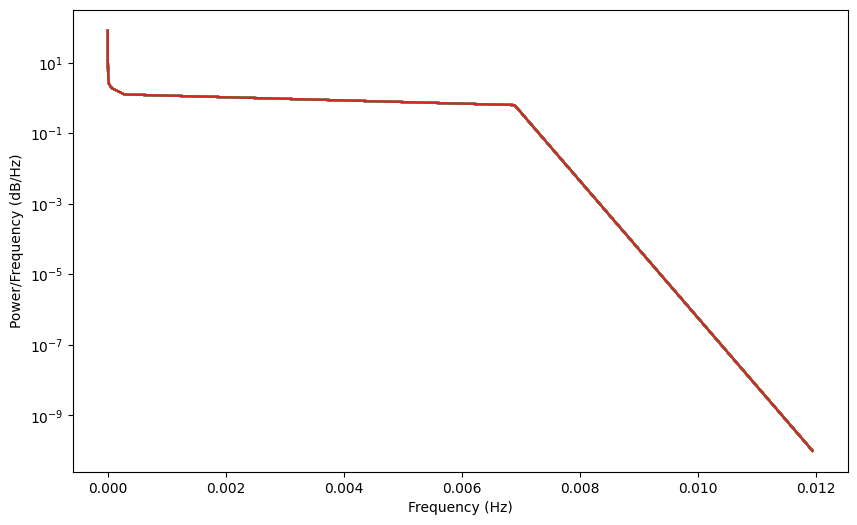

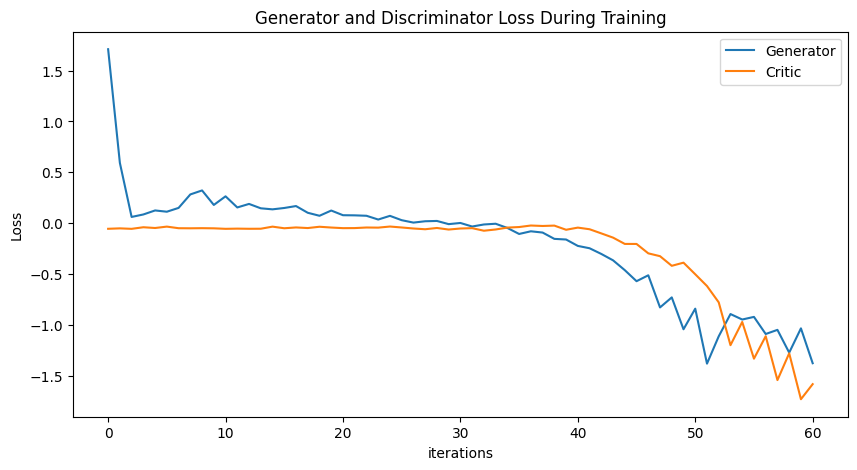

Epoch 70: Critic error ([1.7100269664816368, 0.5929679581922717, 0.062006785393305286, 0.08631061928957326, 0.12582546941375858, 0.11331296911666011, 0.15083048120985026, 0.2832309338527076, 0.3224597973074582, 0.17989877937711884, 0.2646078537183995, 0.15526977909566161, 0.18990873323221, 0.14685462827669427, 0.13668667386800967, 0.1500612636133255, 0.16900307767863926, 0.10300454960788807, 0.07346032282716039, 0.1249353742901469, 0.0789799416284524, 0.07766285682725937, 0.07354528702867699, 0.03651071146560164, 0.07272974023894974, 0.03007252951172182, 0.006449683528760394, 0.019639522774326165, 0.02264032785281414, -0.008660825980371711, 0.0027413019668896255, -0.0321807417635612, -0.012073397895751792, -0.004785927563765849, -0.04619286558255618, -0.10524880603064524, -0.07896107743672949, -0.09144199598683295, -0.15343358135632798, -0.15975503304530964, -0.2226657960269972, -0.2456727821561015, -0.3016170423782287, -0.3643160728109831, -0.460940771048159, -0.5693920978943391, -0.5

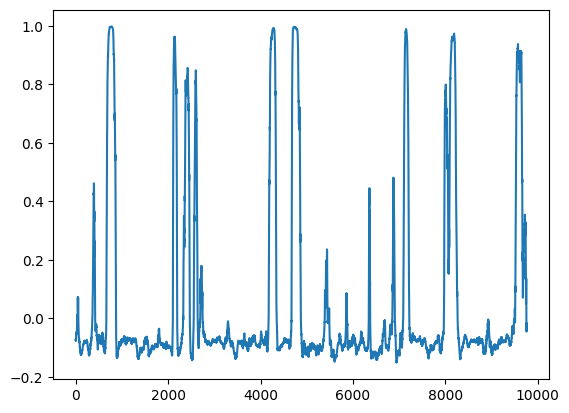

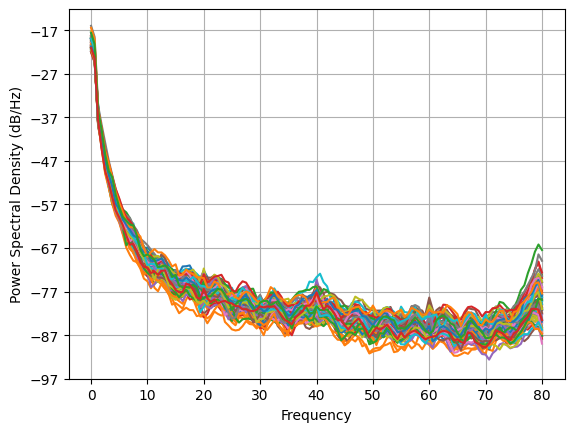

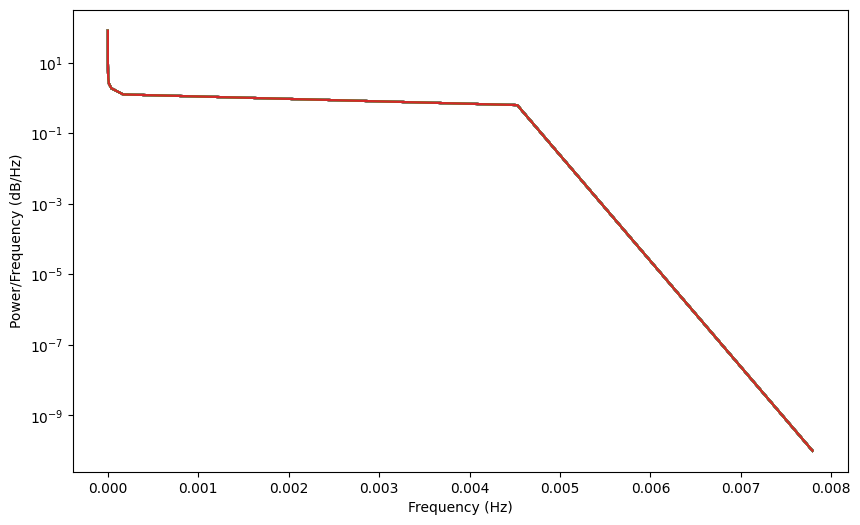

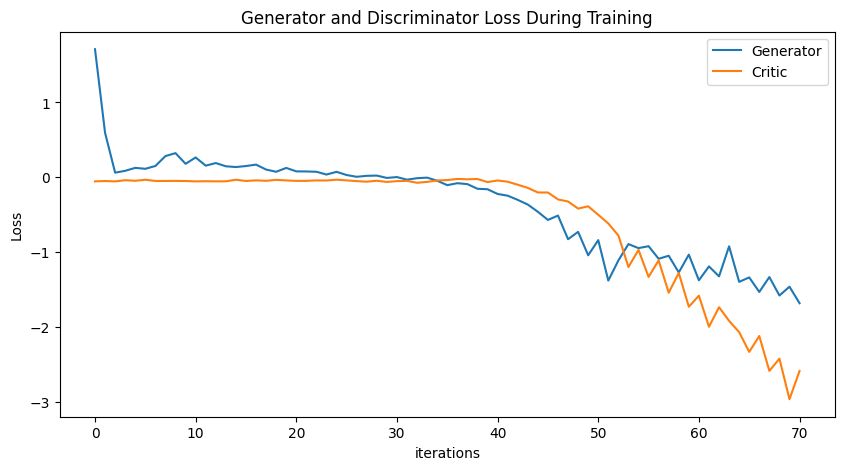

Epoch 80: Critic error ([1.7100269664816368, 0.5929679581922717, 0.062006785393305286, 0.08631061928957326, 0.12582546941375858, 0.11331296911666011, 0.15083048120985026, 0.2832309338527076, 0.3224597973074582, 0.17989877937711884, 0.2646078537183995, 0.15526977909566161, 0.18990873323221, 0.14685462827669427, 0.13668667386800967, 0.1500612636133255, 0.16900307767863926, 0.10300454960788807, 0.07346032282716039, 0.1249353742901469, 0.0789799416284524, 0.07766285682725937, 0.07354528702867699, 0.03651071146560164, 0.07272974023894974, 0.03007252951172182, 0.006449683528760394, 0.019639522774326165, 0.02264032785281414, -0.008660825980371711, 0.0027413019668896255, -0.0321807417635612, -0.012073397895751792, -0.004785927563765849, -0.04619286558255618, -0.10524880603064524, -0.07896107743672949, -0.09144199598683295, -0.15343358135632798, -0.15975503304530964, -0.2226657960269972, -0.2456727821561015, -0.3016170423782287, -0.3643160728109831, -0.460940771048159, -0.5693920978943391, -0.5

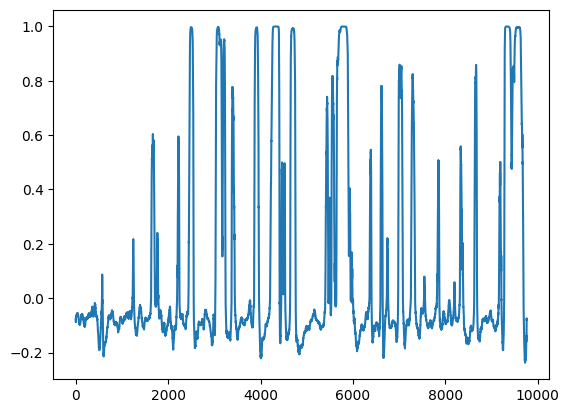

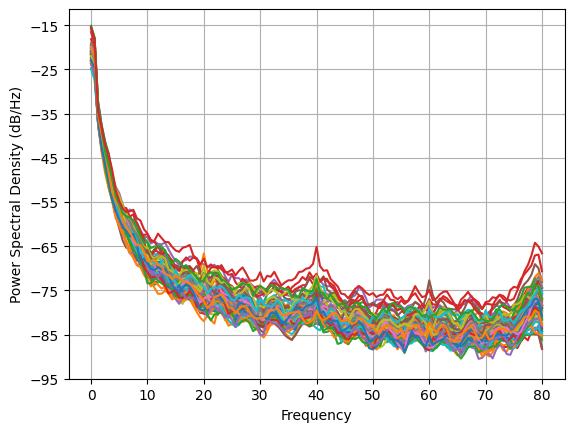

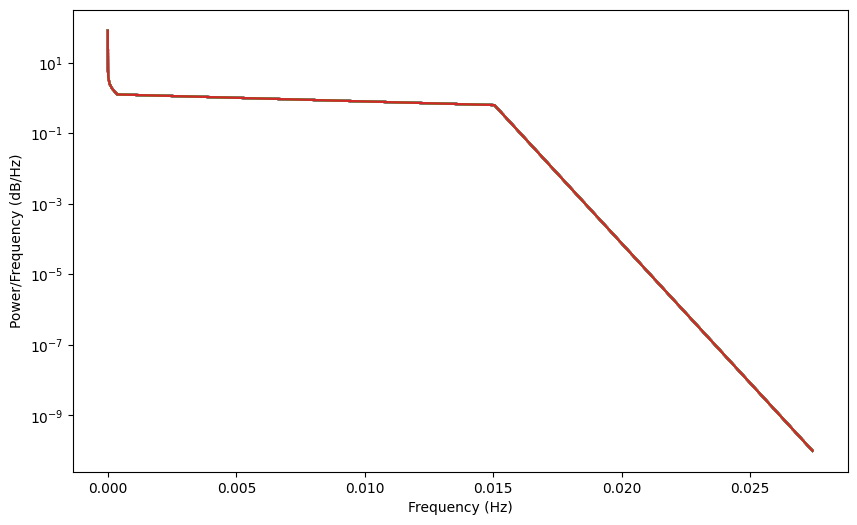

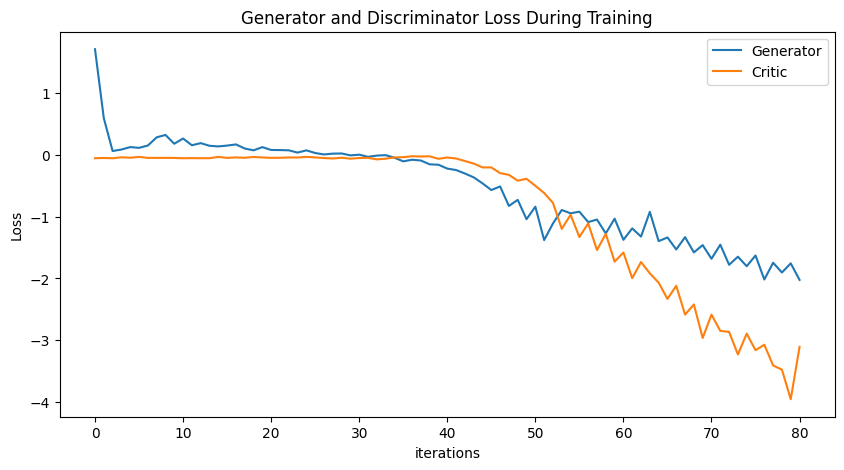

Epoch 90: Critic error ([1.7100269664816368, 0.5929679581922717, 0.062006785393305286, 0.08631061928957326, 0.12582546941375858, 0.11331296911666011, 0.15083048120985026, 0.2832309338527076, 0.3224597973074582, 0.17989877937711884, 0.2646078537183995, 0.15526977909566161, 0.18990873323221, 0.14685462827669427, 0.13668667386800967, 0.1500612636133255, 0.16900307767863926, 0.10300454960788807, 0.07346032282716039, 0.1249353742901469, 0.0789799416284524, 0.07766285682725937, 0.07354528702867699, 0.03651071146560164, 0.07272974023894974, 0.03007252951172182, 0.006449683528760394, 0.019639522774326165, 0.02264032785281414, -0.008660825980371711, 0.0027413019668896255, -0.0321807417635612, -0.012073397895751792, -0.004785927563765849, -0.04619286558255618, -0.10524880603064524, -0.07896107743672949, -0.09144199598683295, -0.15343358135632798, -0.15975503304530964, -0.2226657960269972, -0.2456727821561015, -0.3016170423782287, -0.3643160728109831, -0.460940771048159, -0.5693920978943391, -0.5

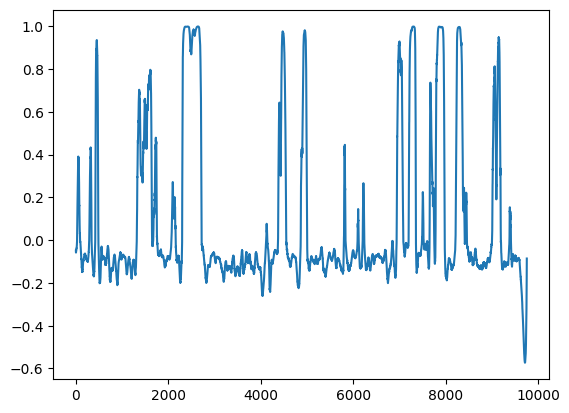

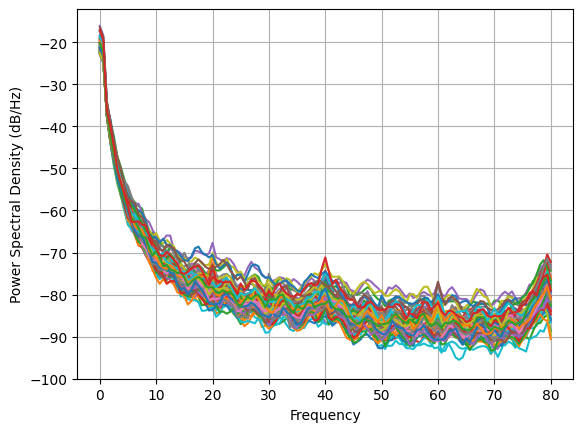

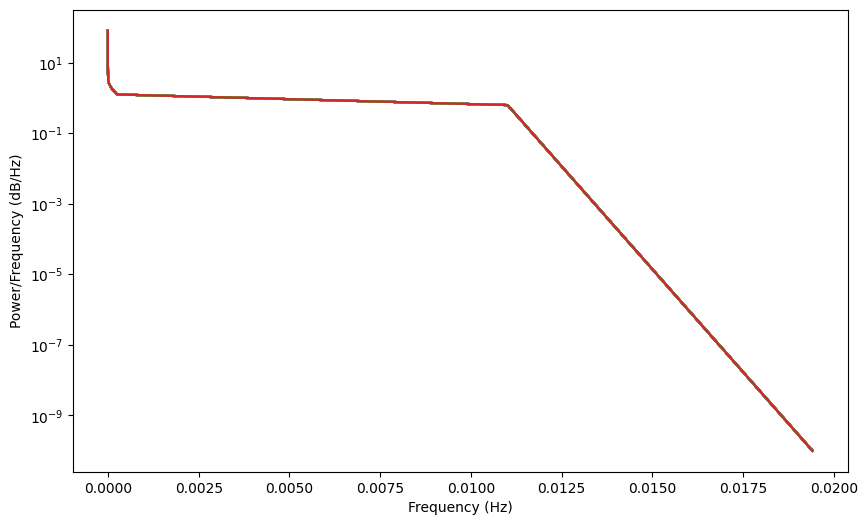

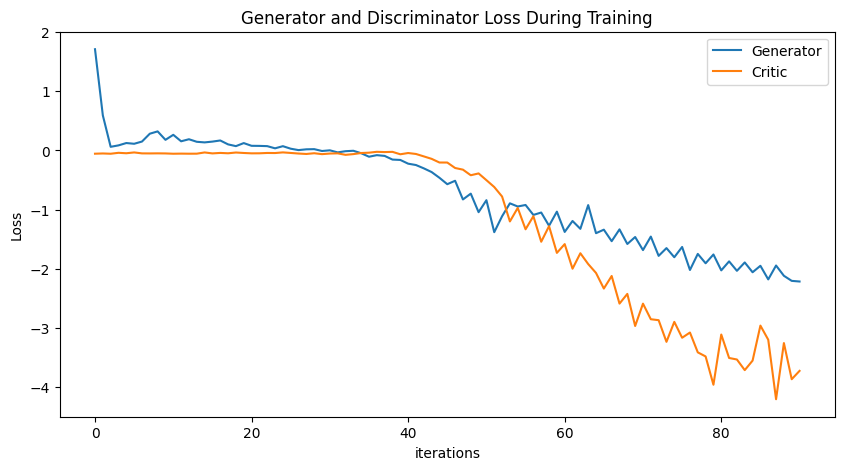

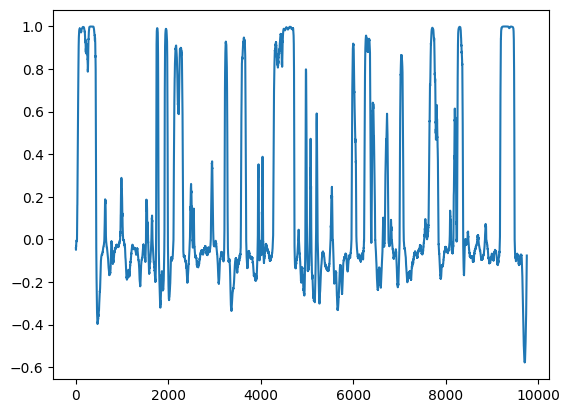

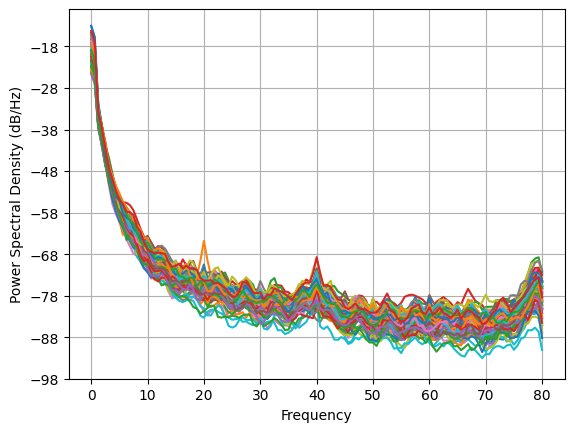

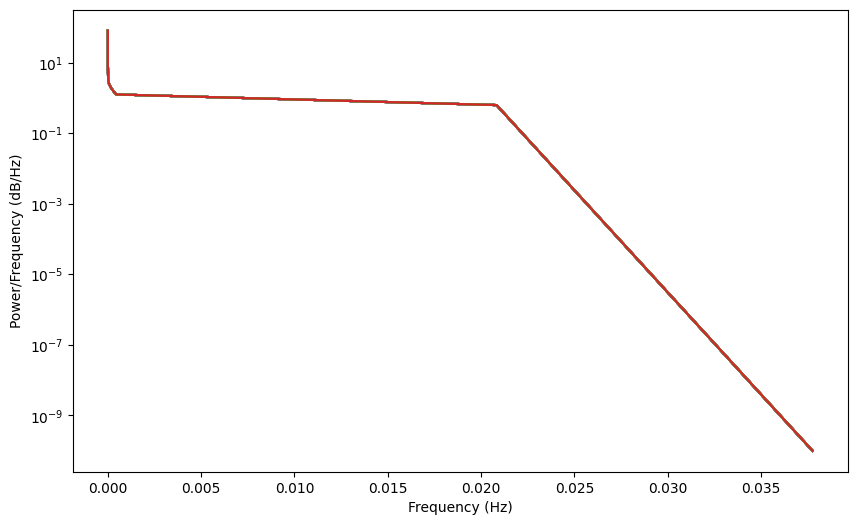

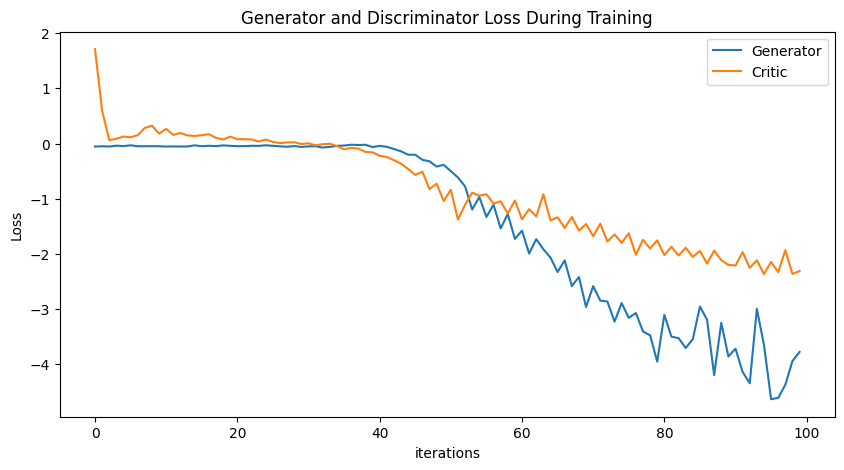

In [14]:
NUM_EPOCHS = 100
PRINT_INTERVAL = 10
BATCH_SIZE = np.shape(normalized_data_open)[0]

train_data = TensorDataset(torch.tensor(normalized_data_open).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for (real,) in train_loader:
            for _ in range(5):
                real.requires_grad=True
                critic_real = D(real).reshape(-1)
                loss_critic_real = -torch.mean(critic_real)
                noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
                fake = G(noise)
                critic_fake = D(fake).reshape(-1)
                loss_critic_fake = torch.mean(critic_fake)
                gp = gradient_penalty(D, real, fake) * LAMBDA_GP
                D.zero_grad()
                loss_critic = loss_critic_real + loss_critic_fake + gp
                loss_critic.backward()
                critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        generated_data = fake
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_norm_open_diff, disc, gen = train()

torch.save(gen, 'gen_FINAL_open_norm_diff.pt')
torch.save(disc, 'disc_FINAL_open_norm_diff.pt')

plot_everything(generated_data_norm_open_diff, gen_err, critic_err)

Epoch 0: Critic error ([2.618525337723418]) Generator err ([-0.014242589473724365])


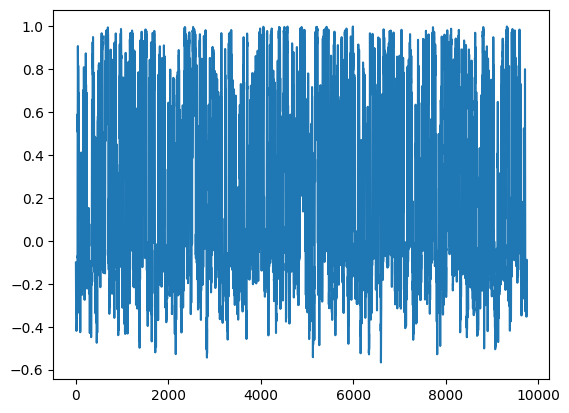

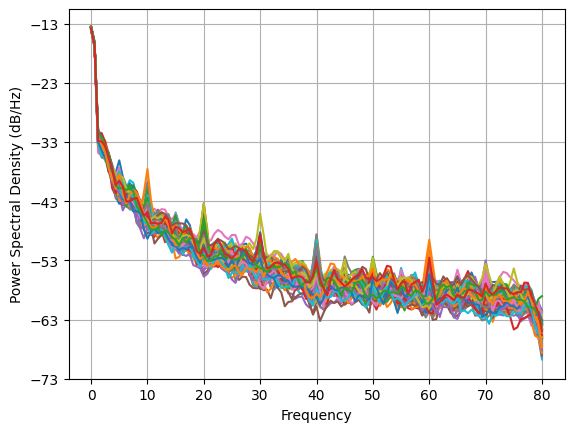

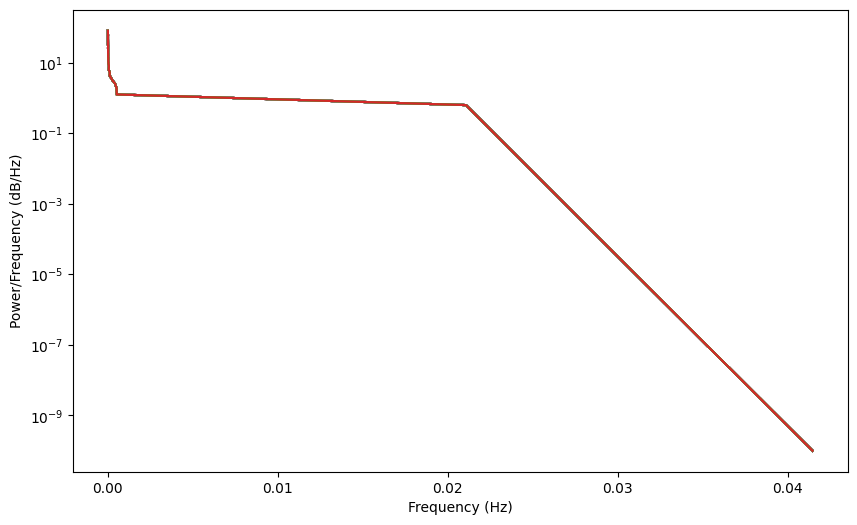

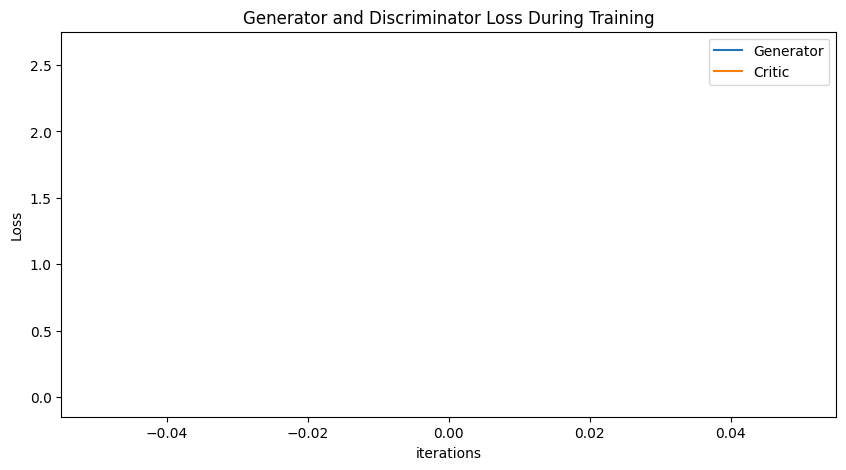

Epoch 10: Critic error ([2.618525337723418, 0.06312931427349128, 0.059945192334870015, -0.005984456796789099, 0.05137392704705923, 0.00424257091393343, -0.02134739883114302, -0.026120282677801313, -0.030870583504854304, -0.0388505109474376, -0.04522424344229791]) Generator err ([-0.014242589473724365, -0.00927618145942688, 0.031138012185692787, 0.019831350073218346, 0.04359110817313194, 0.010275430977344513, 0.028919247910380363, 0.002409587614238262, 0.013080042786896229, 0.013308213092386723, 0.015320222824811935])


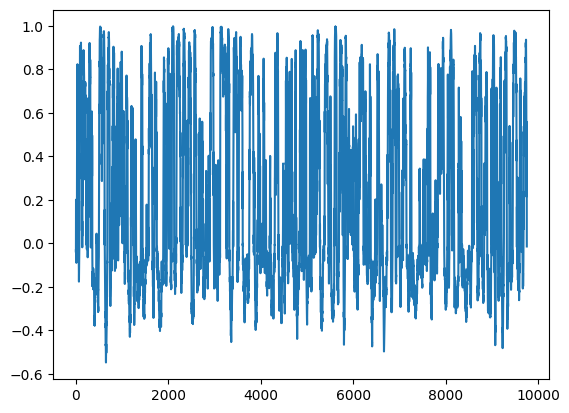

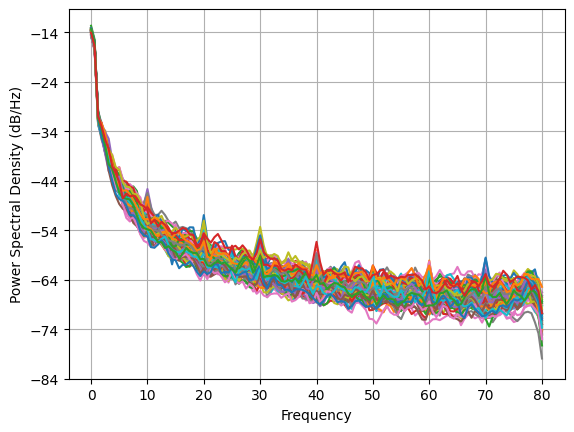

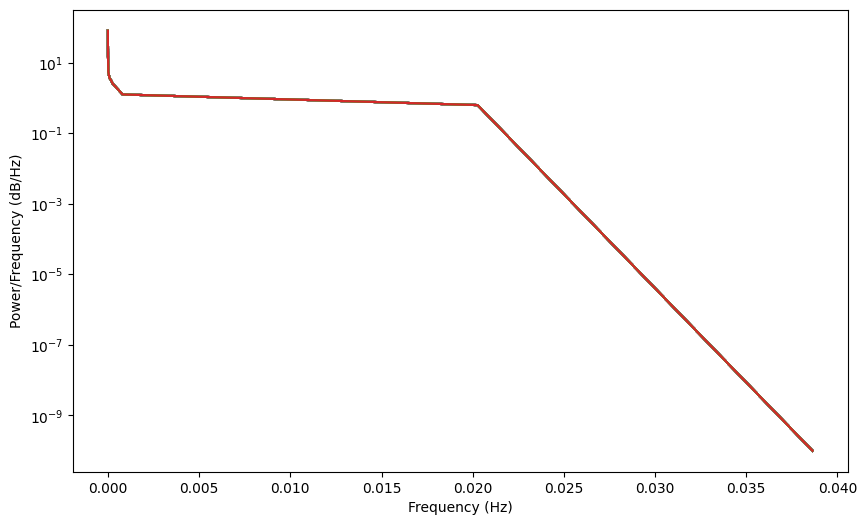

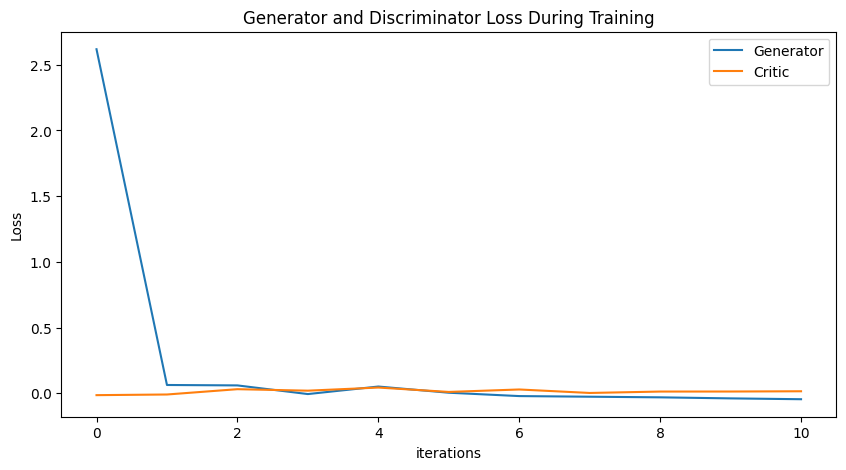

Epoch 20: Critic error ([2.618525337723418, 0.06312931427349128, 0.059945192334870015, -0.005984456796789099, 0.05137392704705923, 0.00424257091393343, -0.02134739883114302, -0.026120282677801313, -0.030870583504854304, -0.0388505109474376, -0.04522424344229791, -0.06662574130957319, -0.04917803777927688, -0.0788595344540002, -0.05223113142673792, -0.19756445273081852, -0.21813090106317568, -0.7924863597538168, -0.7868098021236805, -1.2955215135576252, -0.7500474905240093]) Generator err ([-0.014242589473724365, -0.00927618145942688, 0.031138012185692787, 0.019831350073218346, 0.04359110817313194, 0.010275430977344513, 0.028919247910380363, 0.002409587614238262, 0.013080042786896229, 0.013308213092386723, 0.015320222824811935, 0.03456053137779236, 0.034326184540987015, 0.060697585344314575, 0.1219329684972763, 0.49518585205078125, 0.3204610347747803, 2.0527307987213135, 1.6575992107391357, 1.3461676836013794, 1.6239491701126099])


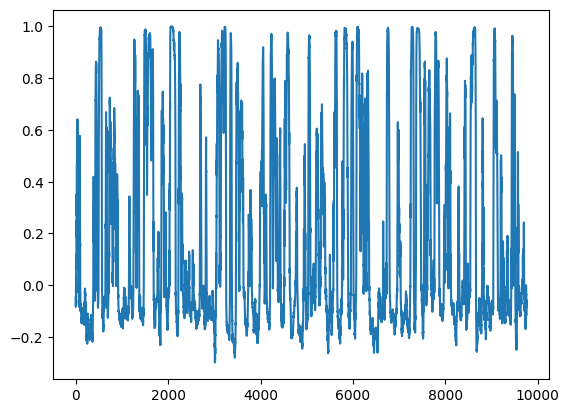

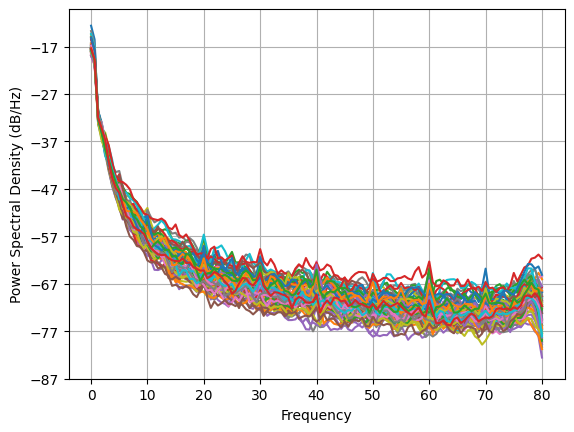

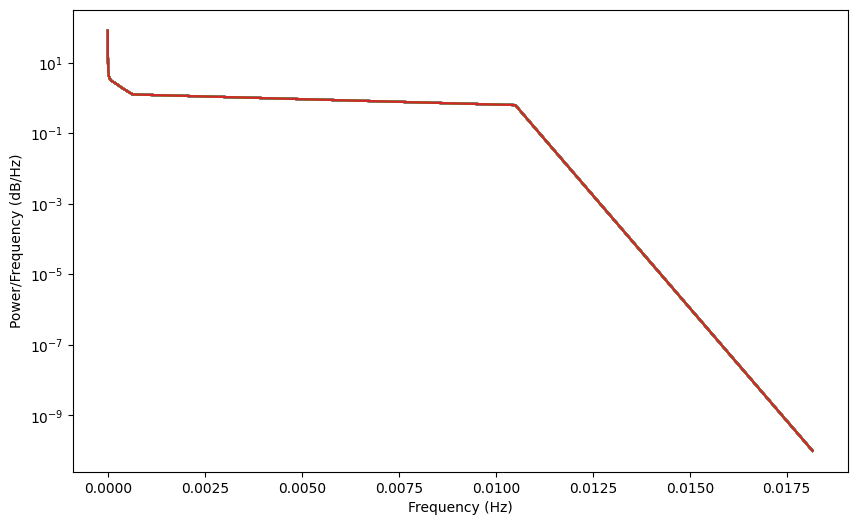

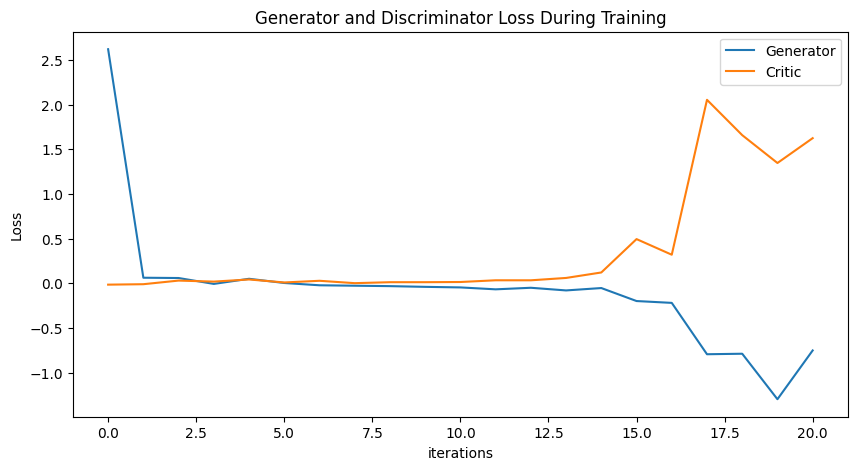

Epoch 30: Critic error ([2.618525337723418, 0.06312931427349128, 0.059945192334870015, -0.005984456796789099, 0.05137392704705923, 0.00424257091393343, -0.02134739883114302, -0.026120282677801313, -0.030870583504854304, -0.0388505109474376, -0.04522424344229791, -0.06662574130957319, -0.04917803777927688, -0.0788595344540002, -0.05223113142673792, -0.19756445273081852, -0.21813090106317568, -0.7924863597538168, -0.7868098021236805, -1.2955215135576252, -0.7500474905240093, -0.47476915571032796, -1.1090978818712331, -1.0418398417260637, -0.8053361304373458, -1.3410341440874824, -1.4934297327982333, -1.0282635958898636, -1.7942262281297499, -1.7343545470866035, -2.025079386079273]) Generator err ([-0.014242589473724365, -0.00927618145942688, 0.031138012185692787, 0.019831350073218346, 0.04359110817313194, 0.010275430977344513, 0.028919247910380363, 0.002409587614238262, 0.013080042786896229, 0.013308213092386723, 0.015320222824811935, 0.03456053137779236, 0.034326184540987015, 0.06069758

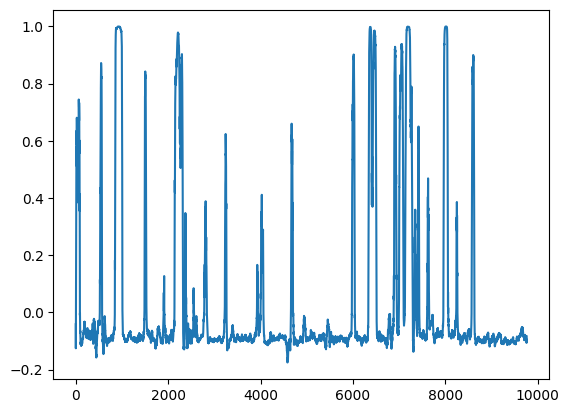

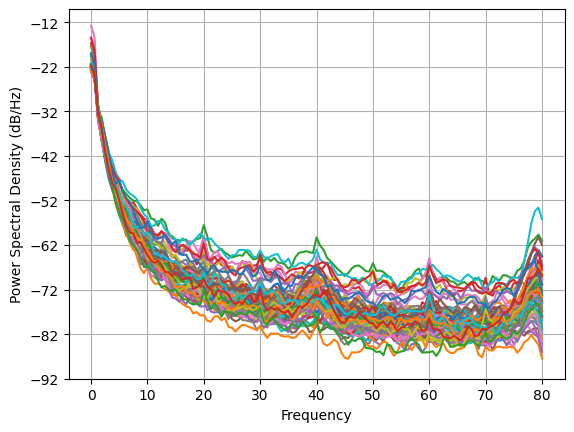

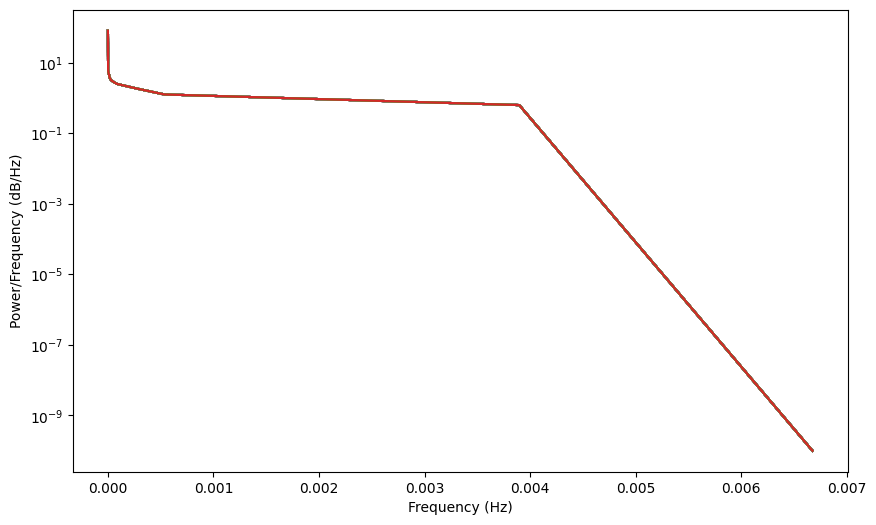

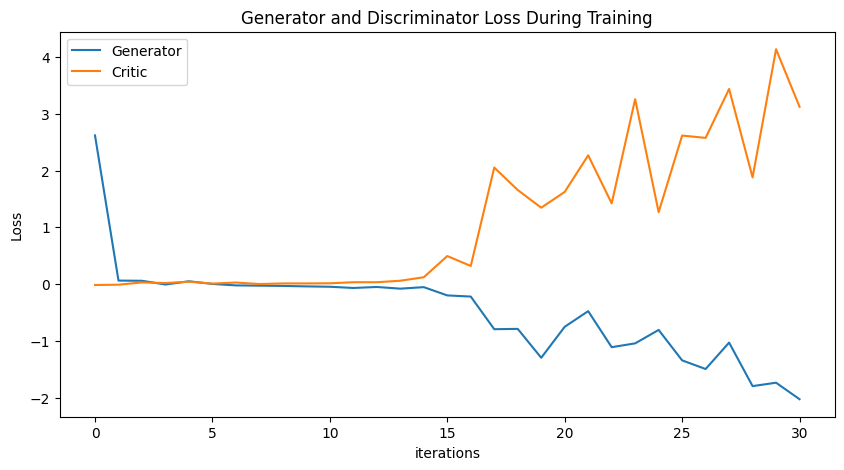

Epoch 40: Critic error ([2.618525337723418, 0.06312931427349128, 0.059945192334870015, -0.005984456796789099, 0.05137392704705923, 0.00424257091393343, -0.02134739883114302, -0.026120282677801313, -0.030870583504854304, -0.0388505109474376, -0.04522424344229791, -0.06662574130957319, -0.04917803777927688, -0.0788595344540002, -0.05223113142673792, -0.19756445273081852, -0.21813090106317568, -0.7924863597538168, -0.7868098021236805, -1.2955215135576252, -0.7500474905240093, -0.47476915571032796, -1.1090978818712331, -1.0418398417260637, -0.8053361304373458, -1.3410341440874824, -1.4934297327982333, -1.0282635958898636, -1.7942262281297499, -1.7343545470866035, -2.025079386079273, -1.8898979794251056, -1.7123404227170087, -2.1838740363430915, -1.9990789789370969, -2.4282048716764955, -2.0973619535541803, -2.495940121975912, -1.7932267373830635, -2.4597759120821103, -2.6482220696632988]) Generator err ([-0.014242589473724365, -0.00927618145942688, 0.031138012185692787, 0.01983135007321834

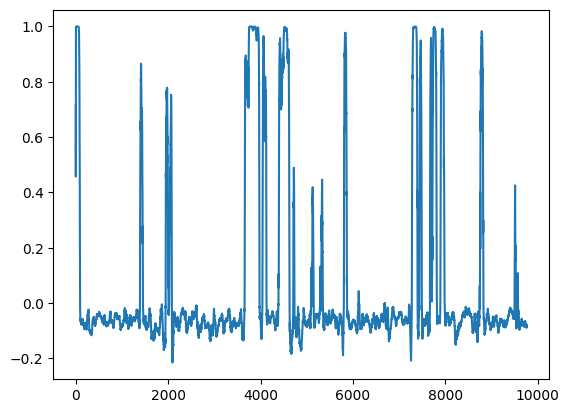

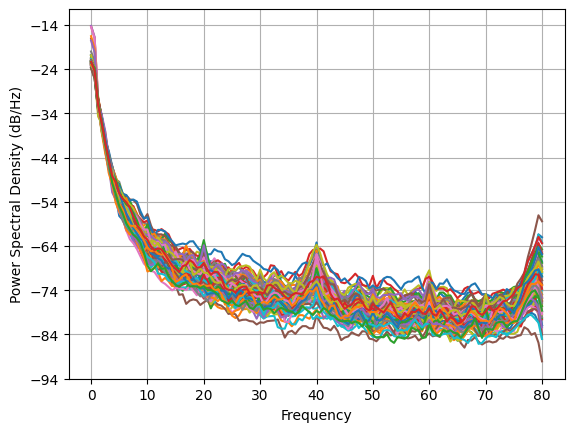

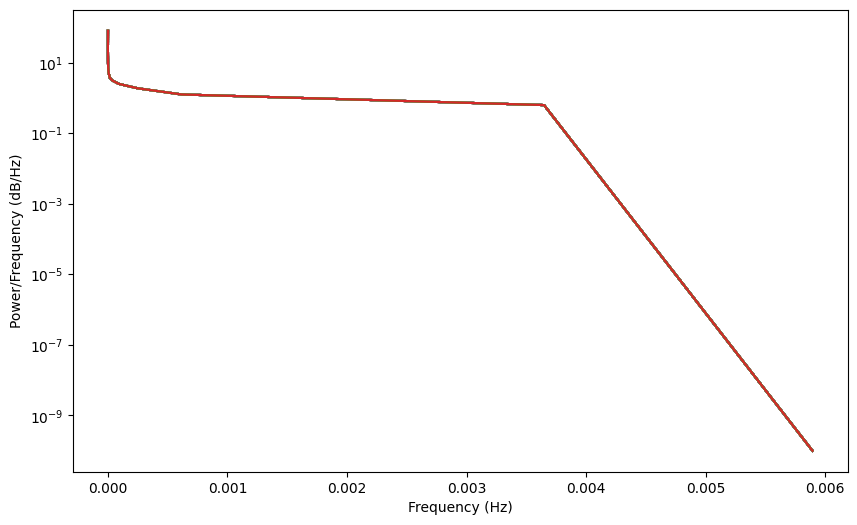

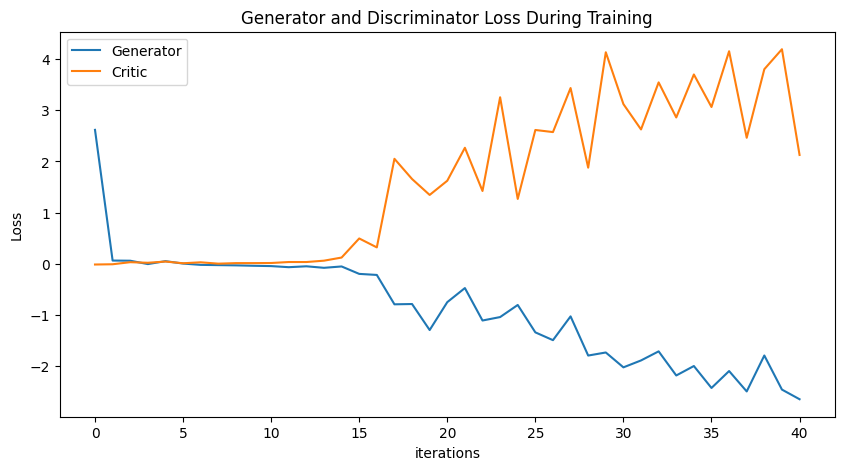

Epoch 50: Critic error ([2.618525337723418, 0.06312931427349128, 0.059945192334870015, -0.005984456796789099, 0.05137392704705923, 0.00424257091393343, -0.02134739883114302, -0.026120282677801313, -0.030870583504854304, -0.0388505109474376, -0.04522424344229791, -0.06662574130957319, -0.04917803777927688, -0.0788595344540002, -0.05223113142673792, -0.19756445273081852, -0.21813090106317568, -0.7924863597538168, -0.7868098021236805, -1.2955215135576252, -0.7500474905240093, -0.47476915571032796, -1.1090978818712331, -1.0418398417260637, -0.8053361304373458, -1.3410341440874824, -1.4934297327982333, -1.0282635958898636, -1.7942262281297499, -1.7343545470866035, -2.025079386079273, -1.8898979794251056, -1.7123404227170087, -2.1838740363430915, -1.9990789789370969, -2.4282048716764955, -2.0973619535541803, -2.495940121975912, -1.7932267373830635, -2.4597759120821103, -2.6482220696632988, -2.167444570082297, -2.689076679399865, -2.719276775560588, -2.8041744540952522, -2.8315087377562946, -

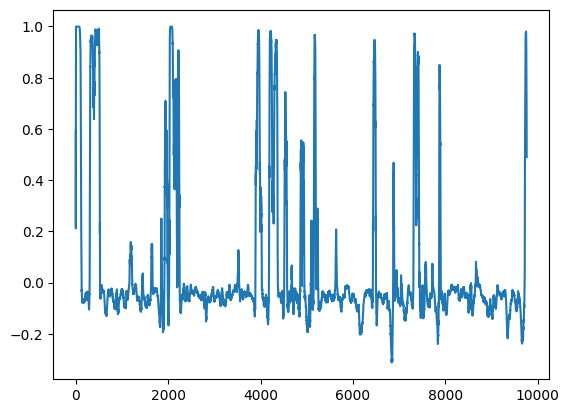

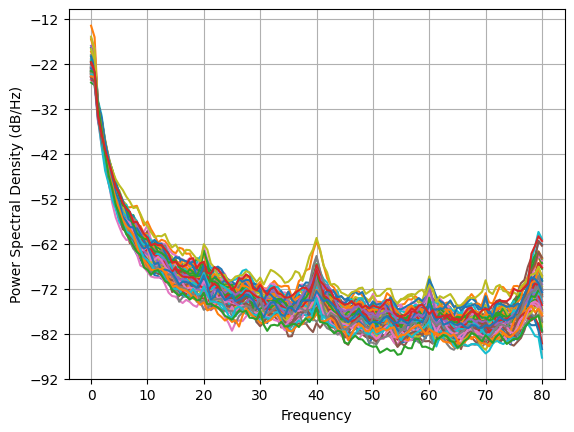

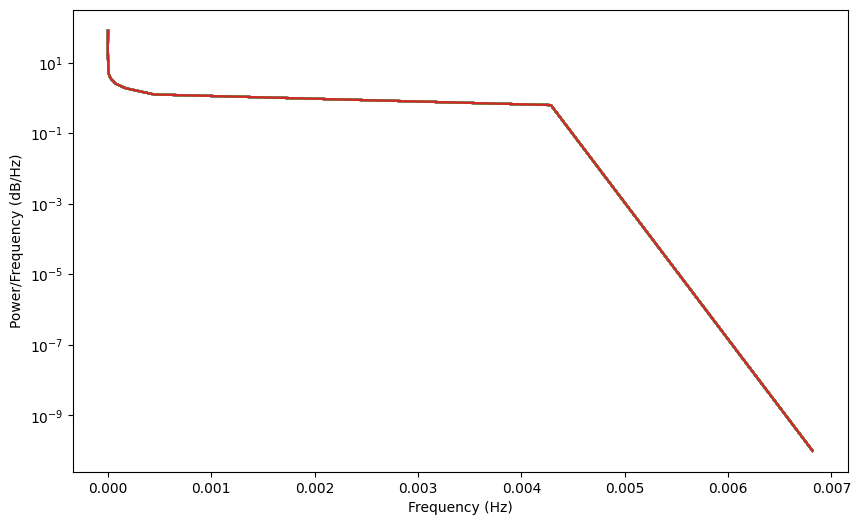

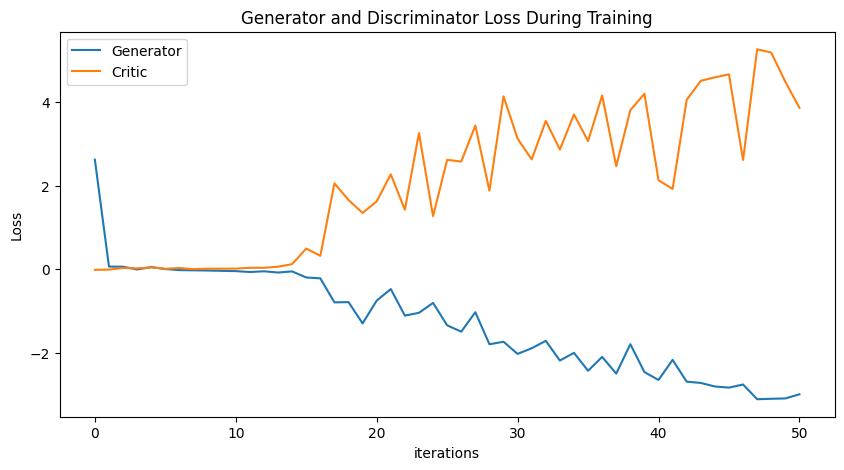

Epoch 60: Critic error ([2.618525337723418, 0.06312931427349128, 0.059945192334870015, -0.005984456796789099, 0.05137392704705923, 0.00424257091393343, -0.02134739883114302, -0.026120282677801313, -0.030870583504854304, -0.0388505109474376, -0.04522424344229791, -0.06662574130957319, -0.04917803777927688, -0.0788595344540002, -0.05223113142673792, -0.19756445273081852, -0.21813090106317568, -0.7924863597538168, -0.7868098021236805, -1.2955215135576252, -0.7500474905240093, -0.47476915571032796, -1.1090978818712331, -1.0418398417260637, -0.8053361304373458, -1.3410341440874824, -1.4934297327982333, -1.0282635958898636, -1.7942262281297499, -1.7343545470866035, -2.025079386079273, -1.8898979794251056, -1.7123404227170087, -2.1838740363430915, -1.9990789789370969, -2.4282048716764955, -2.0973619535541803, -2.495940121975912, -1.7932267373830635, -2.4597759120821103, -2.6482220696632988, -2.167444570082297, -2.689076679399865, -2.719276775560588, -2.8041744540952522, -2.8315087377562946, -

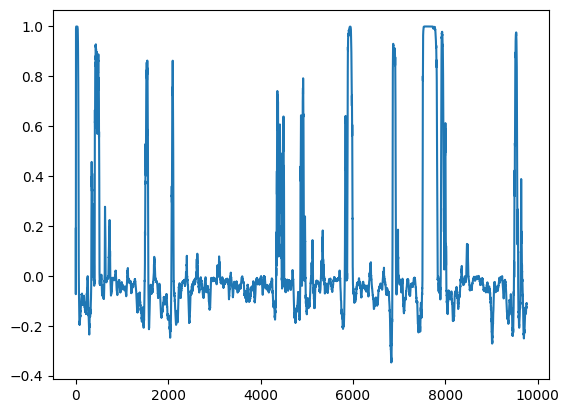

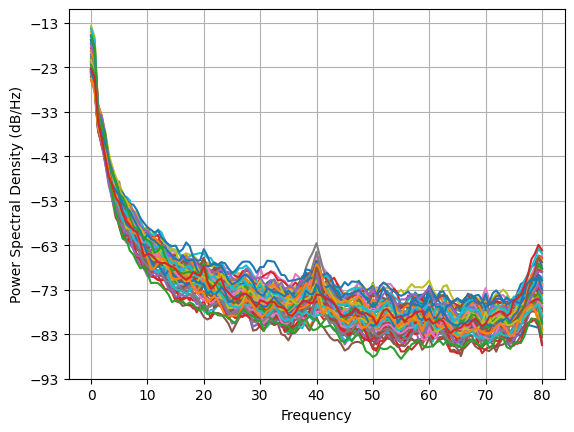

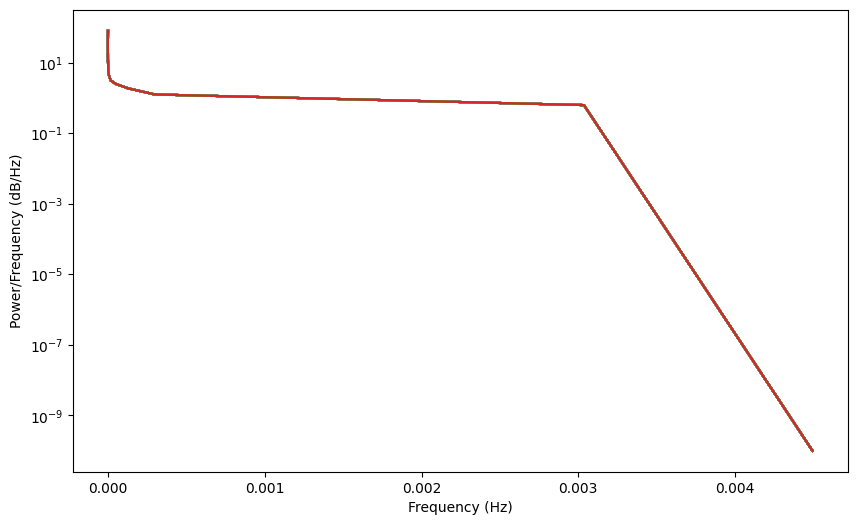

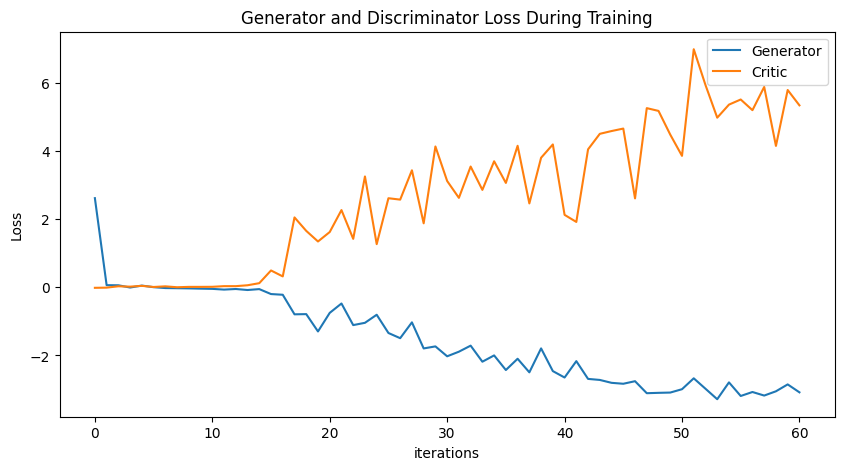

Epoch 70: Critic error ([2.618525337723418, 0.06312931427349128, 0.059945192334870015, -0.005984456796789099, 0.05137392704705923, 0.00424257091393343, -0.02134739883114302, -0.026120282677801313, -0.030870583504854304, -0.0388505109474376, -0.04522424344229791, -0.06662574130957319, -0.04917803777927688, -0.0788595344540002, -0.05223113142673792, -0.19756445273081852, -0.21813090106317568, -0.7924863597538168, -0.7868098021236805, -1.2955215135576252, -0.7500474905240093, -0.47476915571032796, -1.1090978818712331, -1.0418398417260637, -0.8053361304373458, -1.3410341440874824, -1.4934297327982333, -1.0282635958898636, -1.7942262281297499, -1.7343545470866035, -2.025079386079273, -1.8898979794251056, -1.7123404227170087, -2.1838740363430915, -1.9990789789370969, -2.4282048716764955, -2.0973619535541803, -2.495940121975912, -1.7932267373830635, -2.4597759120821103, -2.6482220696632988, -2.167444570082297, -2.689076679399865, -2.719276775560588, -2.8041744540952522, -2.8315087377562946, -

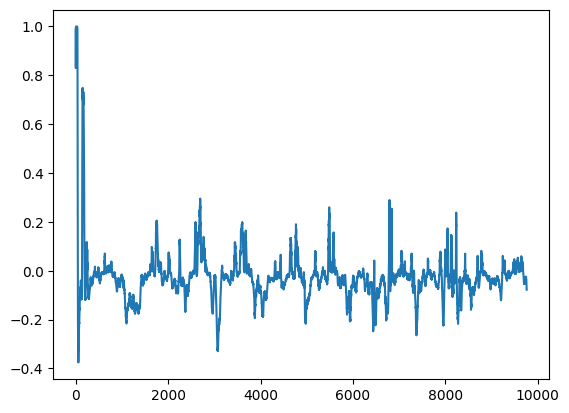

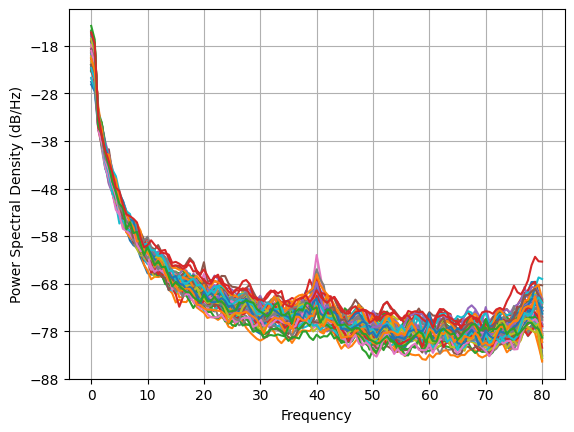

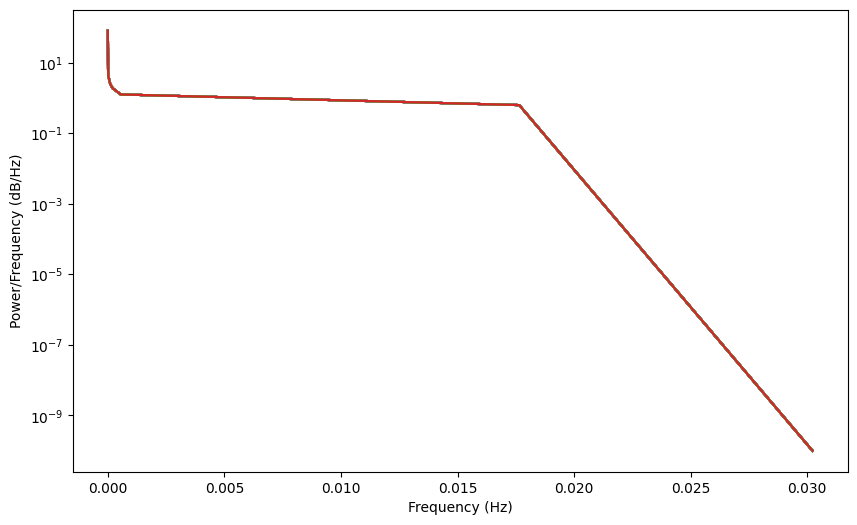

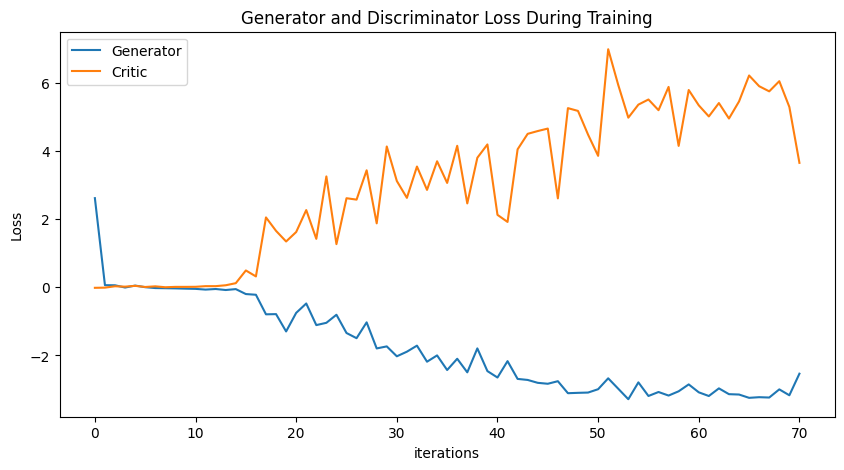

Epoch 80: Critic error ([2.618525337723418, 0.06312931427349128, 0.059945192334870015, -0.005984456796789099, 0.05137392704705923, 0.00424257091393343, -0.02134739883114302, -0.026120282677801313, -0.030870583504854304, -0.0388505109474376, -0.04522424344229791, -0.06662574130957319, -0.04917803777927688, -0.0788595344540002, -0.05223113142673792, -0.19756445273081852, -0.21813090106317568, -0.7924863597538168, -0.7868098021236805, -1.2955215135576252, -0.7500474905240093, -0.47476915571032796, -1.1090978818712331, -1.0418398417260637, -0.8053361304373458, -1.3410341440874824, -1.4934297327982333, -1.0282635958898636, -1.7942262281297499, -1.7343545470866035, -2.025079386079273, -1.8898979794251056, -1.7123404227170087, -2.1838740363430915, -1.9990789789370969, -2.4282048716764955, -2.0973619535541803, -2.495940121975912, -1.7932267373830635, -2.4597759120821103, -2.6482220696632988, -2.167444570082297, -2.689076679399865, -2.719276775560588, -2.8041744540952522, -2.8315087377562946, -

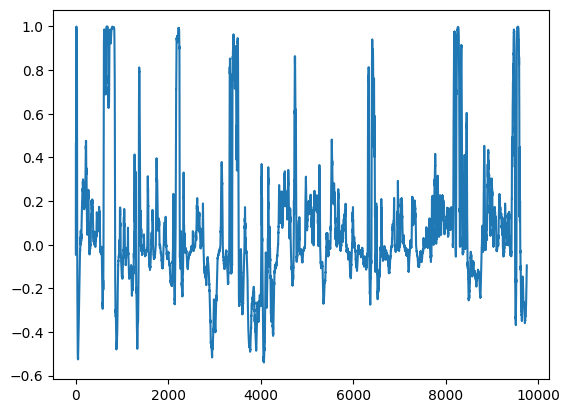

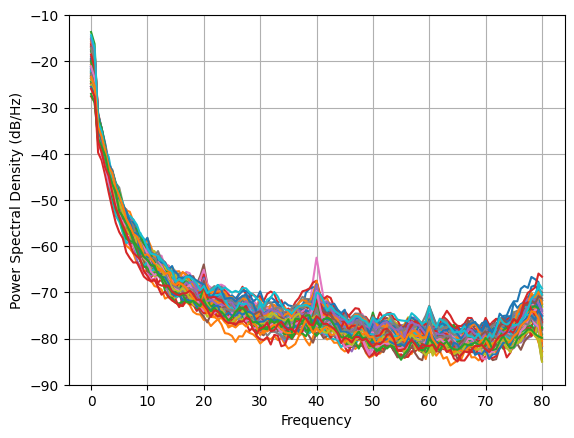

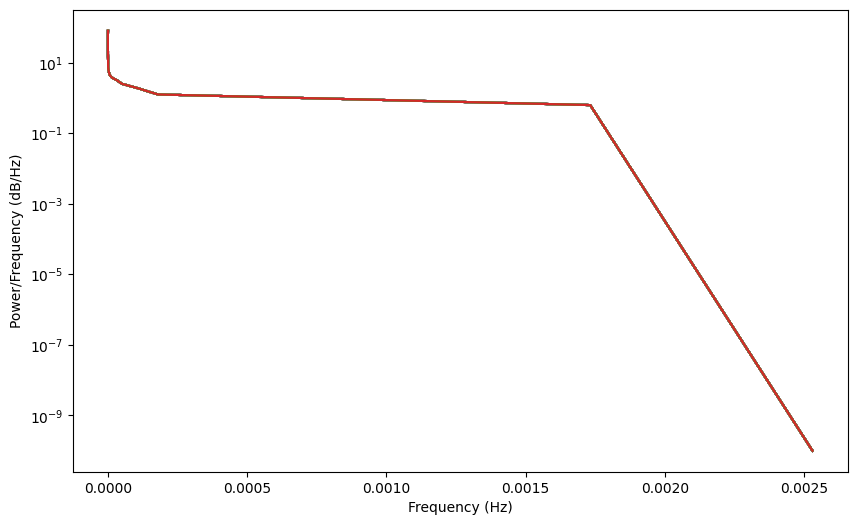

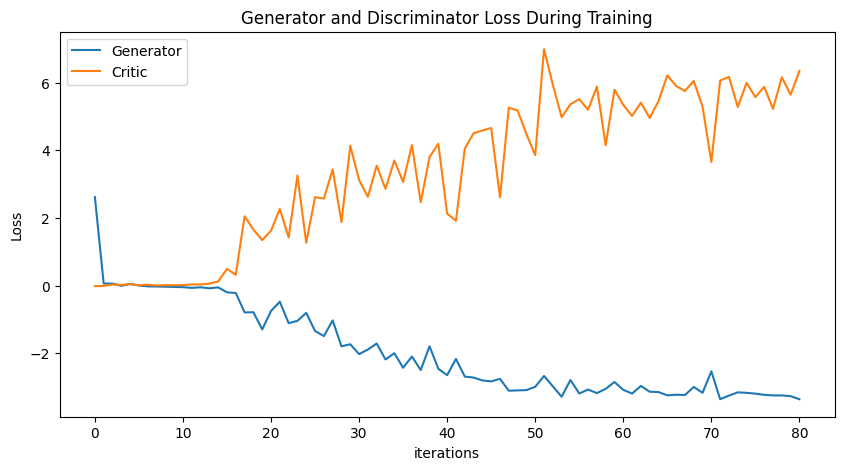

Epoch 90: Critic error ([2.618525337723418, 0.06312931427349128, 0.059945192334870015, -0.005984456796789099, 0.05137392704705923, 0.00424257091393343, -0.02134739883114302, -0.026120282677801313, -0.030870583504854304, -0.0388505109474376, -0.04522424344229791, -0.06662574130957319, -0.04917803777927688, -0.0788595344540002, -0.05223113142673792, -0.19756445273081852, -0.21813090106317568, -0.7924863597538168, -0.7868098021236805, -1.2955215135576252, -0.7500474905240093, -0.47476915571032796, -1.1090978818712331, -1.0418398417260637, -0.8053361304373458, -1.3410341440874824, -1.4934297327982333, -1.0282635958898636, -1.7942262281297499, -1.7343545470866035, -2.025079386079273, -1.8898979794251056, -1.7123404227170087, -2.1838740363430915, -1.9990789789370969, -2.4282048716764955, -2.0973619535541803, -2.495940121975912, -1.7932267373830635, -2.4597759120821103, -2.6482220696632988, -2.167444570082297, -2.689076679399865, -2.719276775560588, -2.8041744540952522, -2.8315087377562946, -

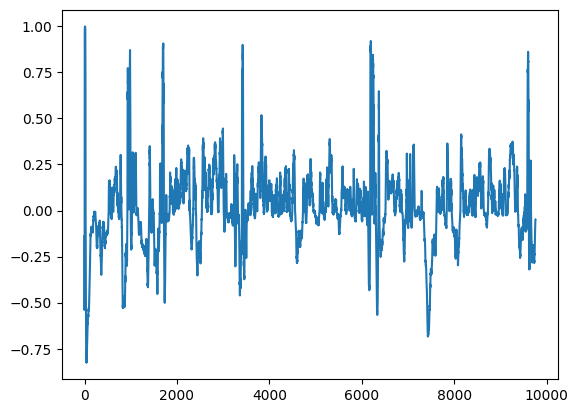

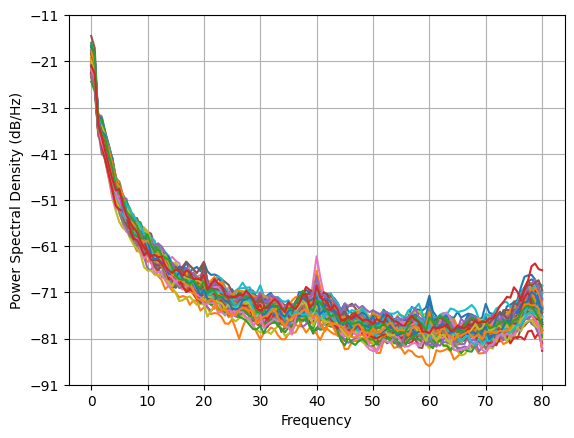

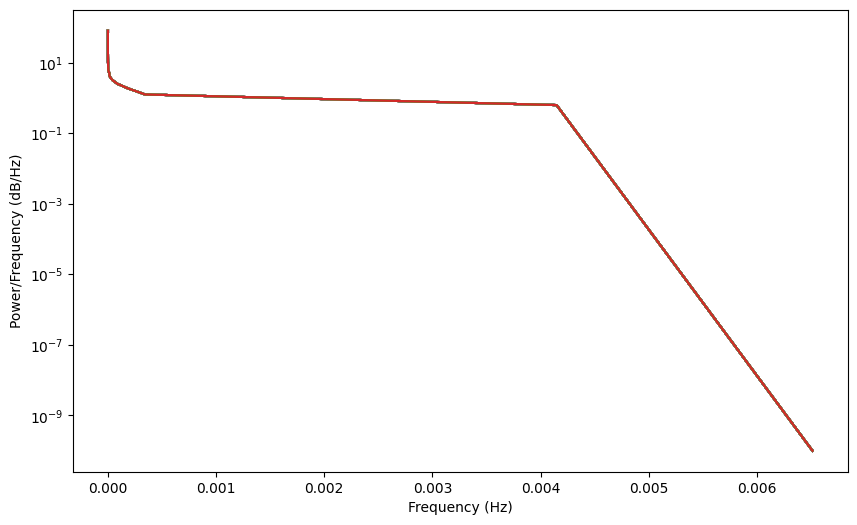

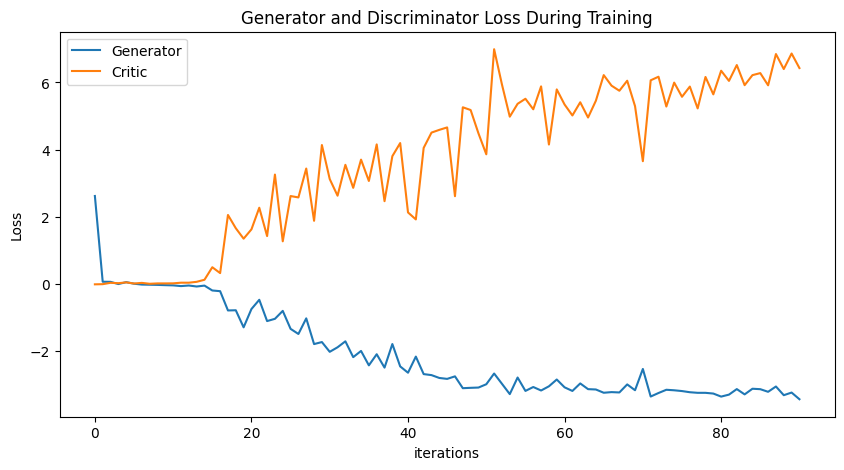

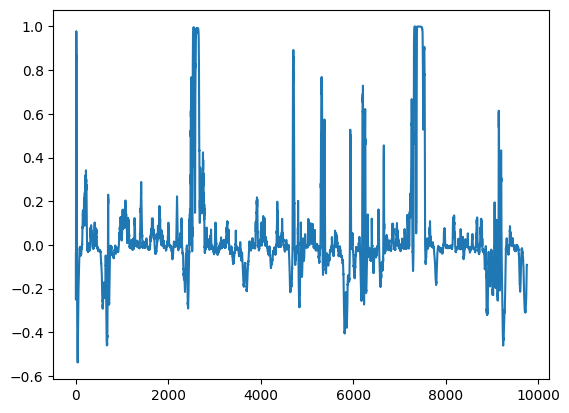

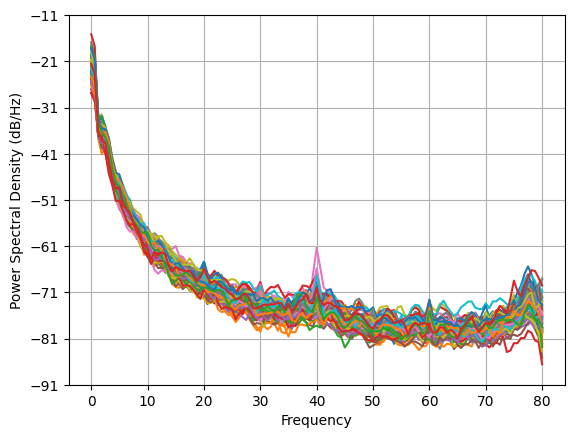

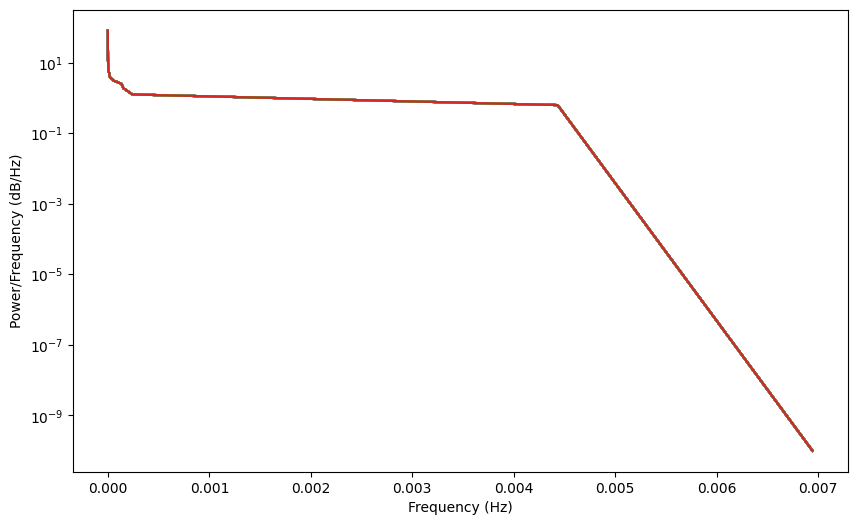

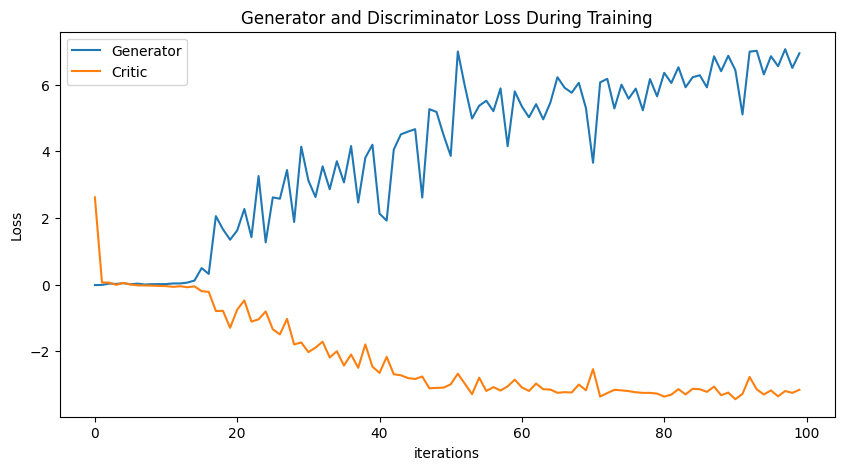

In [15]:
NUM_EPOCHS = 100
PRINT_INTERVAL = 10
BATCH_SIZE = np.shape(normalized_data_closed)[0]

train_data = TensorDataset(torch.tensor(normalized_data_closed).detach())
train_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(120, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(64, affine=True),
            nn.LeakyReLU(0.2),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(64, 64, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for (real,) in train_loader:
            for _ in range(5):
                real.requires_grad=True
                critic_real = D(real).reshape(-1)
                loss_critic_real = -torch.mean(critic_real)
                noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
                fake = G(noise)
                critic_fake = D(fake).reshape(-1)
                loss_critic_fake = torch.mean(critic_fake)
                gp = gradient_penalty(D, real, fake) * LAMBDA_GP
                D.zero_grad()
                loss_critic = loss_critic_real + loss_critic_fake + gp
                loss_critic.backward()
                critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 120, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()

        generated_data = fake
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(generated_data, critic_err, gen_err)

    return critic_err, gen_err, generated_data, D, G

critic_err, gen_err, generated_data_norm_closed_diff, disc, gen = train()

torch.save(gen, 'gen_FINAL_closed_norm_diff.pt')
torch.save(disc, 'disc_FINAL_closed_norm_diff.pt')

plot_everything(generated_data_norm_closed_diff, gen_err, critic_err)